# Data processing - Level 1
Code written by Radiance and Yolanda (with the help of ChatGPT)

## Load data

In [1]:
from helikite.metadata.utils import load_parquet

df, metadata = load_parquet("level0_2025-02-12T07-55.parquet")

In [2]:
metadata

Flight 59 from 2025-02-12 07:59:35 to 2025-02-12 10:17:15


**Example commands to output different individual elements of the dataset**  

*To use individual fields, just use the object (.) notation, for example*  
  
print(metadata.flight_date)  
print(metadata.landing_time)  
metadata.takeoff_time

flight_computer_columns = [col for col in df.columns if col.startswith("flight_computer_")]  
print(flight_computer_columns)  

smart_tether_columns = [col for col in df.columns if col.startswith("smart_tether_")]  
print(smart_tether_columns)  

## Outlier removal

To remove outliers, load the level 0 CSV file, making sure to set the index to the DateTime.  
This function will load all the data, plot an individual variable, and then save a CSV of any outliers that are chosen as True. This outlier CSV can be used to mask the values in the original dataframe. An example of this is shown in the second cell.

_Note: No data is changed in the input dataframe._  
  
In a first time, check the **'flight_computer_pressure'** against **'flight_computer_time'** as well as **'flight_computer_Out1_T'**, **'flight_computer_Out2_T'**, **'flight_computer_Out1_H'** and **'flight_computer_Out2_H'**.  
Then check **'smart_tether_Wind (m/s)'**. The WD values corresponding to the WS outliers will automatically also be set as outliers (no need to manually select **'smart_tether_Wind (degrees)'** outliers).  
If needed, remove **'flight_computer_Lat'** outliers by selecting a threshold value. The Long values corresponding to the Lat outliers will automatically also be set as outliers (no need to manually select **'flight_computer_Long'** outliers).

In [3]:
""" CHANGE NAMES OF INPUT AND OUTLIER FILES """

import pandas as pd
import os
import numpy as np
from helikite.processing import choose_outliers

INPUT_DATA_FILENAME = r'C:\Users\temel\helikite-data-processing\Yolanda-helikite-data-processing\notebooks\level0_2025-02-12T07-55.csv'
OUTLIER_FILENAME = r'C:\Users\temel\helikite-data-processing\Yolanda-helikite-data-processing\notebooks\level0_2025-02-12T07-55_outliers.csv'
df = pd.read_csv(INPUT_DATA_FILENAME, low_memory=False, parse_dates=True, index_col=0)
choose_outliers(df=df, y="flight_computer_pressure", outlier_file=OUTLIER_FILENAME)
#choose_outliers(df=df, y="pops_pressure", outlier_file=OUTLIER_FILENAME)
#choose_outliers(df=df, y="cpc_DateTime", outlier_file=OUTLIER_FILENAME)

C:\Users\temel\helikite-data-processing\Yolanda-helikite-data-processing\helikite\processing\post\tools.py:39: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [4]:
outliers = pd.read_csv(OUTLIER_FILENAME, index_col=0, parse_dates=True)
outliers['smart_tether_Wind (degrees)'] = outliers['smart_tether_Wind (m/s)']   # Remove WS values corresponding to outlying WD

In [5]:
# Remove WS = 0 and WS > 12 outliers
wind_zero_mask = df['smart_tether_Wind (m/s)'] == 0
wind_high_mask = df['smart_tether_Wind (m/s)'] > 10

combined_wind_mask = wind_zero_mask | wind_high_mask

selected_rows = pd.DataFrame(False, index=df[combined_wind_mask].index, columns=df.columns)
selected_rows['smart_tether_Wind (m/s)'] = True
selected_rows['smart_tether_Wind (degrees)'] = True  # Also flag the direction as outlier

if 'outliers' not in locals():
    outliers = selected_rows.copy()
else:
    outliers = pd.concat([outliers, selected_rows])

In [6]:
# Remove GPS outliers
lat_mask = (df['flight_computer_Lat'] <= 7039) | (df['flight_computer_Lat'] > 7100)
long_mask = df['flight_computer_Long'] < 800

combined_mask = lat_mask | long_mask  # Combine both masks using logical OR
selected_rows = pd.DataFrame(False, index=df[combined_mask].index, columns=df.columns)
selected_rows['flight_computer_Lat'] = True
selected_rows['flight_computer_Long'] = True  # Mark both as outliers if either condition is true

if 'outliers' not in locals():
    outliers = selected_rows.copy()
else:
    outliers = pd.concat([outliers, selected_rows])

In [6]:
# Set GPS data for missing FC files
df['flight_computer_Lat'] = 7039.724
df['flight_computer_Long'] = 817.1591

In [7]:
# Remove T and RH outliers
start_time = pd.to_datetime("2025-02-08 19:55:39")
end_time = pd.to_datetime("2025-02-08 19:57:45")
time_mask = (df.index >= start_time) & (df.index <= end_time)

temp_mask = pd.DataFrame(False, index=df[time_mask].index, columns=df.columns)
temp_mask['flight_computer_Out1_T'] = True
temp_mask['flight_computer_Out1_H'] = True

if 'outliers' not in locals():
    outliers = temp_mask.copy()
else:
    outliers = pd.concat([outliers, temp_mask])

In [17]:
# Remove FC outliers
intervals = [
    ("2025-02-11 15:48:23", "2025-02-11 16:10:01"),
    ("2025-02-11 16:27:01", "2025-02-11 16:54:43"),
    ("2025-02-11 16:58:37", "2025-02-11 17:08:12"),
]

fc_cols = [col for col in df.columns if col.startswith('flight_computer_') and col != 'flight_computer_Time']
FC_mask = pd.DataFrame(False, index=df.index, columns=df.columns)

for start_str, end_str in intervals:
    start, end = pd.Timestamp(start_str), pd.Timestamp(end_str)
    mask = (df.index >= start) & (df.index <= end)
    FC_mask.loc[mask, fc_cols] = True
FC_mask = FC_mask.loc[FC_mask[fc_cols].any(axis=1)]

if 'outliers' not in locals():
    outliers = FC_mask.copy()
else:
    outliers = pd.concat([outliers, FC_mask])

In [7]:
# Remove FC outliers
timestamp = pd.Timestamp("2025-02-10 12:16:55")
fc_cols = [col for col in df.columns if col.startswith('flight_computer_')]
FC_mask = pd.DataFrame(False, index=[timestamp], columns=df.columns)
FC_mask.loc[timestamp, fc_cols] = True

if 'outliers' not in locals():
    outliers = FC_mask.copy()
else:
    outliers = pd.concat([outliers, FC_mask])

In [4]:
outliers = pd.read_csv(OUTLIER_FILENAME, index_col=0, parse_dates=True)
#outliers['smart_tether_Wind (degrees)'] = outliers['smart_tether_Wind (m/s)']   # Remove WD values corresponding to outlying WS
#outliers['flight_computer_Long'] = outliers['flight_computer_Lat']              # Remove Long values corresponding to outlying Lat
#outliers.to_csv(OUTLIER_FILENAME, date_format="%Y-%m-%d %H:%M:%S")              # Save corresponding outliers into the csv file

num_WS = outliers['smart_tether_Wind (m/s)'].sum()
print(f"Number of outliers in 'smart_tether_Wind (m/s)': {num_WS}")
num_T1 = outliers['flight_computer_Out1_T'].sum()
print(f"Number of outliers in 'flight_computer_Out1_T': {num_T1}")
num_T2 = outliers['flight_computer_Out2_T'].sum()
print(f"Number of outliers in 'flight_computer_Out2_T': {num_T2}")
num_lat = outliers['flight_computer_Lat'].sum()
print(f"Number of outliers in 'flight_computer_Lat': {num_lat}")

Number of outliers in 'smart_tether_Wind (m/s)': 14
Number of outliers in 'flight_computer_Out1_T': 0
Number of outliers in 'flight_computer_Out2_T': 0
Number of outliers in 'flight_computer_Lat': 13


In [5]:
# Set the values in the df to be np.nan (this is default behavior of a mask)
df.loc[outliers.index] = df.loc[outliers.index].mask(outliers)                # By default the outliers will be nan

#df.loc["2025-02-15 09:47:40":"2025-02-15 09:47:50", 'smart_tether_Wind (m/s)']   # Print time range to control if values replaced by NaN

In [9]:
#df['flight_computer_pressure'] = df['pops_pressure']

### Outlier removal double check
Plot variables with possible removed outliers.

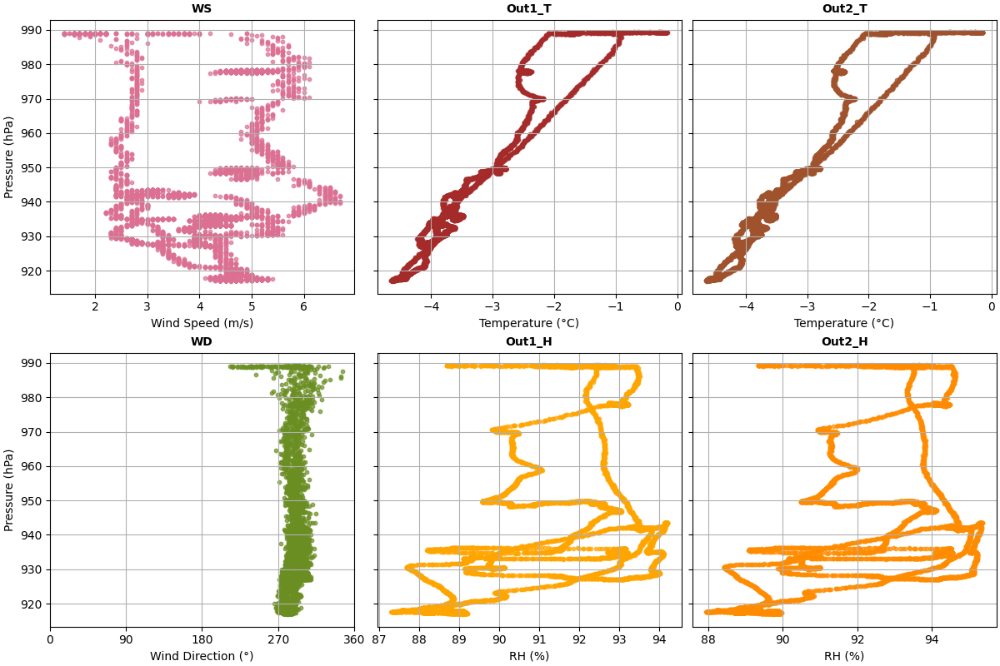

In [6]:
from helikite.processing.post.outliers import plot_outliers_check
%matplotlib ipympl

plot_outliers_check(df)

Check position of balloon compared to the station based on GPS coordinates.  

Transformation of degrees-minutes coordinates (DM) into decimal degrees (DD) coordinates.  
Addition of 'latitude_dd' and 'longitude_dd' into df.

In [7]:
from helikite.processing.post.outliers import plot_gps_on_map

m = plot_gps_on_map(df)
m

## T and RH averaging

Averages flight computer temperature and humidity data from the two T/RH sensors (if >90 NaNs for one of the sensors, takes only the other one into account).  
Plots T and RH in function of pressure.  
Smart Tether is also plotted as indication, but not taken into account for the averaging. 

Adds 'Average_Temperature' and 'Average_RH' into df.

Number of NaNs - Out1_T: 0 Out2_T: 0
Number of NaNs - Out1_H: 0 Out2_H: 0


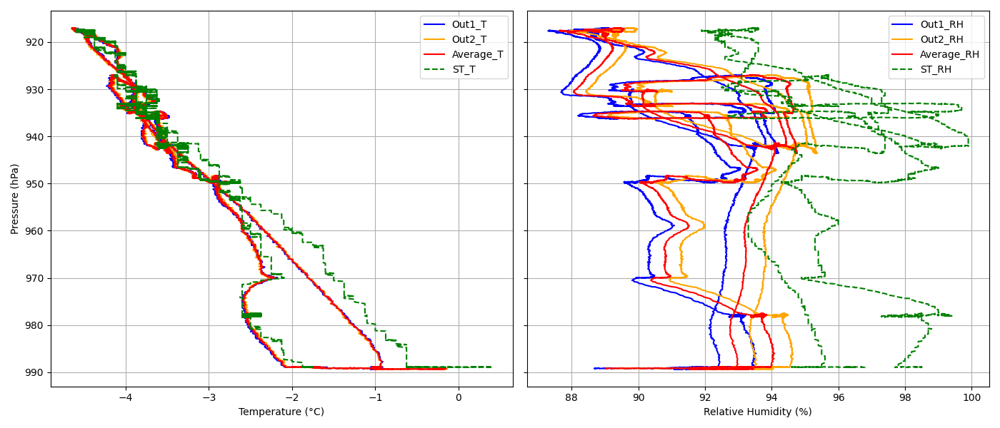

In [8]:
from helikite.processing.post.TandRH import T_RH_averaging
%matplotlib ipympl

df = T_RH_averaging(df)

**In case the standard T and RH averaging is not working or needs to be adapted :**

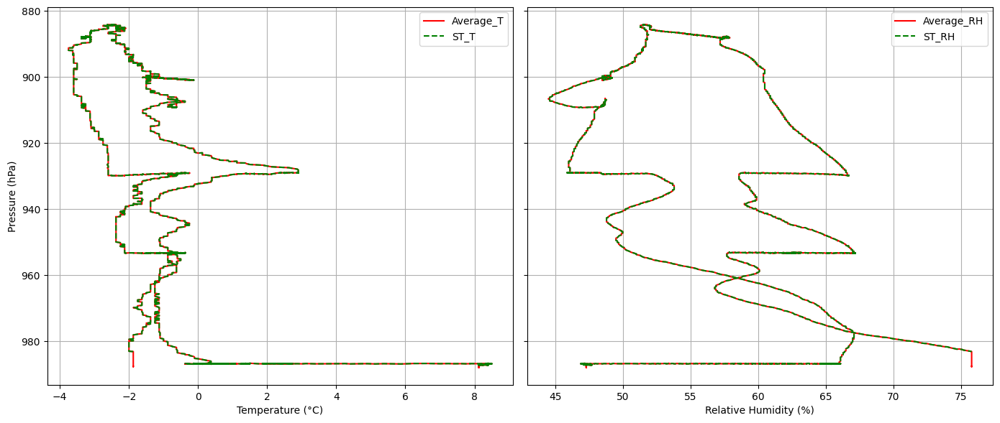

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

#df['smart_tether_T (deg C)_corr'] = df['smart_tether_T (deg C)'] - 0.2
#df['smart_tether_%RH_corr'] = df['smart_tether_%RH'] -6.1

#df['Average_Temperature'] = df[['flight_computer_Out1_T', 'flight_computer_Out2_T', 'smart_tether_T (deg C)_corr']].mean(axis=1, skipna=True)
#df['Average_RH'] = df[['flight_computer_Out1_H', 'flight_computer_Out2_H', 'smart_tether_%RH_corr']].mean(axis=1)

df['Average_Temperature'] = df['smart_tether_T (deg C)']
df['Average_RH'] = df['smart_tether_%RH']
df['Average_Temperature'] = df['Average_Temperature'].ffill().bfill()
df['Average_RH'] = df['Average_RH'].ffill().bfill()


# PLOT
plt.close('all')
fig, ax = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Temperature plot
#ax[0].plot(df["flight_computer_Out1_T"], df["flight_computer_pressure"], label="Out1_T", color='blue')
#ax[0].plot(df["flight_computer_Out2_T"], df["flight_computer_pressure"], label="Out2_T", color='orange')
ax[0].plot(df["Average_Temperature"], df["flight_computer_pressure"], label="Average_T", color='red')
ax[0].plot(df["smart_tether_T (deg C)"], df["flight_computer_pressure"], label="ST_T", color='green', linestyle='--')
ax[0].set_xlabel("Temperature (°C)")
ax[0].set_ylabel("Pressure (hPa)")
ax[0].legend()
ax[0].grid(True)
ax[0].invert_yaxis()

# Humidity plot
#ax[1].plot(df["flight_computer_Out1_H"], df["flight_computer_pressure"], label="Out1_RH", color='blue')
#ax[1].plot(df["flight_computer_Out2_H"], df["flight_computer_pressure"], label="Out2_RH", color='orange')
ax[1].plot(df["Average_RH"], df["flight_computer_pressure"], label="Average_RH", color='red')
ax[1].plot(df["smart_tether_%RH"], df["flight_computer_pressure"], label="ST_RH", color='green', linestyle='--')
ax[1].set_xlabel("Relative Humidity (%)")
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

In [12]:
df

,pops_Status,pops_PartCt,pops_BL,pops_BLTH,pops_STD,pops_P,pops_TofP,pops_POPS_Flow,pops_PumpFB,pops_LDTemp,...,tapir_Thead4,tapir_TB,tapir_Tbox,flight_computer_Lat,flight_computer_Long,flight_computer_pressure,latitude_dd,longitude_dd,Average_Temperature,Average_RH
DateTime,,,,,,,,,,,,,,,,,,,,,
2025-01-27 17:57:43,1,0,2380,2416,12.04,987.90,6.37,-0.08,76.0,29.41,...,NaN,NaN,NaN,7039.724,817.1591,987.90,-70.662067,-8.285985,8.125,47.3
2025-01-27 17:57:44,1,30,2380,2413,10.94,987.87,6.38,-0.11,451.0,29.75,...,NaN,NaN,NaN,7039.724,817.1591,987.87,-70.662067,-8.285985,8.125,47.3
2025-01-27 17:57:45,1,8,2381,2413,10.83,987.84,6.39,0.42,739.0,30.09,...,NaN,NaN,NaN,7039.724,817.1591,987.84,-70.662067,-8.285985,8.125,47.3
2025-01-27 17:57:46,1,41,2379,2410,10.43,987.85,6.40,0.35,1062.0,30.43,...,NaN,NaN,NaN,7039.724,817.1591,987.85,-70.662067,-8.285985,8.125,47.3
2025-01-27 17:57:47,1,0,2379,2412,10.90,987.82,6.41,-0.09,1102.0,30.70,...,NaN,NaN,NaN,7039.724,817.1591,987.82,-70.662067,-8.285985,8.125,47.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-27 19:44:21,1,11,2353,2384,10.34,987.60,43.00,2.56,483.0,44.90,...,NaN,NaN,NaN,7039.724,817.1591,987.60,-70.662067,-8.285985,-1.875,75.8
2025-01-27 19:44:22,1,4,2354,2383,9.82,987.56,43.00,3.02,483.0,44.90,...,NaN,NaN,NaN,7039.724,817.1591,987.56,-70.662067,-8.285985,-1.875,75.8
2025-01-27 19:44:23,1,5,2353,2383,9.85,987.62,43.00,3.43,483.0,44.90,...,NaN,NaN,NaN,7039.724,817.1591,987.62,-70.662067,-8.285985,-1.875,75.8


## Altitude calculation 

Adds 'DateTime', 'Pressure_ground', 'Temperature_ground' and 'Altitude' into df.

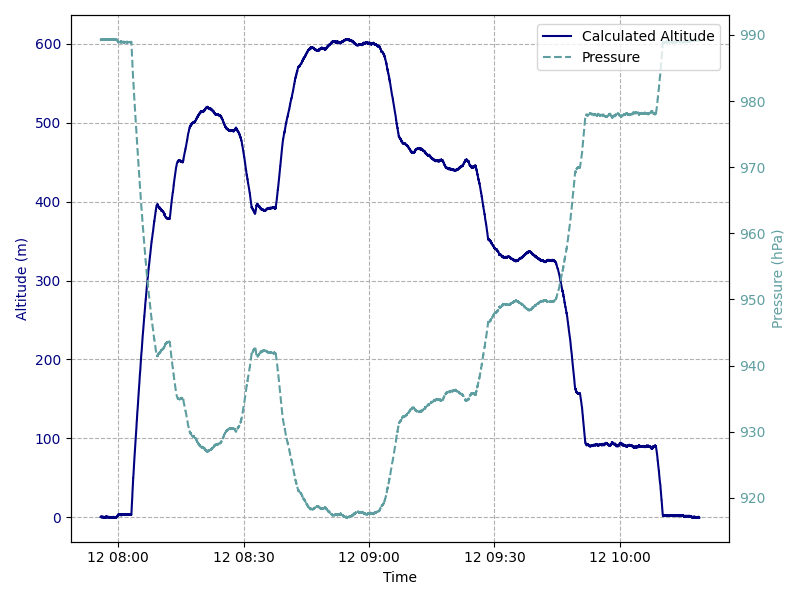

,flight_computer_Time,flight_computer_F_cur_pos,flight_computer_F_cntdown,flight_computer_F_smp_flw,flight_computer_F_smp_tmp,flight_computer_F_smp_prs,flight_computer_F_pump_pw,flight_computer_F_psvolts,flight_computer_F_err_rpt,flight_computer_SO_S,...,tapir_TB,tapir_Tbox,latitude_dd,longitude_dd,Average_Temperature,Average_RH,DateTime,Pressure_ground,Temperature_ground,Altitude
DateTime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:55:45,250212-075545,1.0,0.0,0.83,1.7,983.0,17.0,11.91,0.0,2.32,...,NaN,NaN,-70.66206,-8.285985,-0.180,93.450,2025-02-12 07:55:45,989.3215,272.179833,0.254572
2025-02-12 07:55:46,250212-075546,1.0,0.0,1.00,1.7,982.0,16.0,11.92,0.0,1.91,...,NaN,NaN,-70.66206,-8.285985,-0.195,93.420,2025-02-12 07:55:46,989.3215,272.179833,0.658671
2025-02-12 07:55:47,250212-075547,1.0,0.0,0.77,1.7,983.0,16.0,11.94,0.0,1.95,...,NaN,NaN,-70.66206,-8.285985,-0.180,93.445,2025-02-12 07:55:47,989.3215,272.179833,0.335390
2025-02-12 07:55:48,250212-075548,1.0,0.0,0.92,1.7,982.0,17.0,11.94,0.0,2.23,...,NaN,NaN,-70.66206,-8.285985,-0.170,93.415,2025-02-12 07:55:48,989.3215,272.179833,0.173754
2025-02-12 07:55:49,250212-075549,1.0,0.0,0.94,1.7,982.0,15.0,11.94,0.0,2.36,...,NaN,NaN,-70.66206,-8.285985,-0.195,93.400,2025-02-12 07:55:49,989.3215,272.179833,0.497029


In [9]:
from helikite.processing.post.altitude import altitude_calculation_barometric
%matplotlib ipympl

df = altitude_calculation_barometric(df, metadata)
df.head()

**When start and/or stop of FC at balloon height and not on the sledge : add 3.5 m**

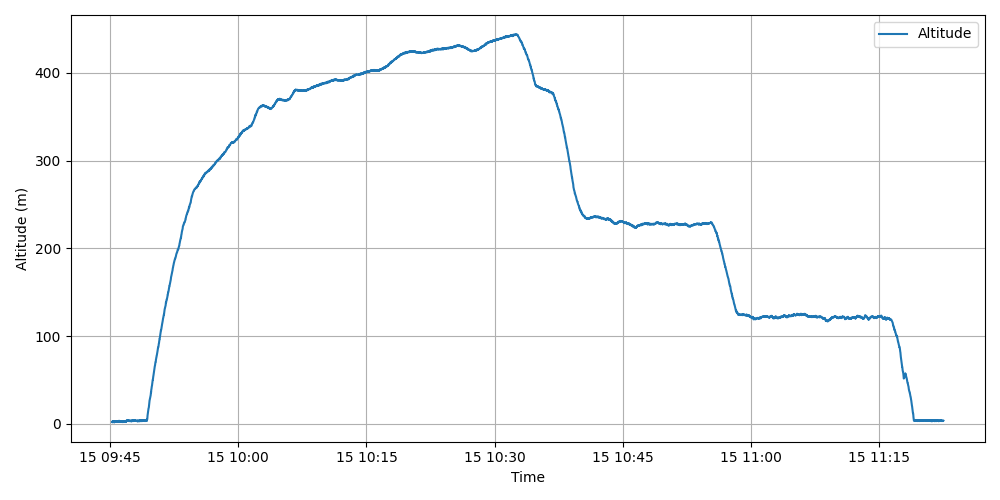

In [13]:
import matplotlib.pyplot as plt

df['Altitude'] = df['Altitude'] + 3.5

plt.close('all')
plt.figure(figsize=(10, 5))
plt.plot(df.index, df['Altitude'], label='Altitude')
plt.xlabel('Time')
plt.ylabel('Altitude (m)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

## POPS data processing
### POPS total concentration calculation

Calculate the total concentration and dN/dlogDP for each bin

From Pohorsky et al. (2024) it appeared that particles with diameters between 142 and 186 (bins 0 to 2) are wrongly detected by the POPS as total particle concentration increases. This phenomenon can be explained by electronic noise from the detector, where fringes on the edge of the Gaussian signal are perceived as smaller particles by the software. It was therefore decided to only consider data for particles larger than 186 nm as the error induced by the first three bins is too high.

*dN_pops = pops_bX / popsflow_mean = dN*  
*pops_total_conc = sum of dN_pops*  
*pops_bX_dlogDp = dN/dlogDp*  

Adds 'pops_total_conc' and 'pops_bX_dlogDp' into df.

In [11]:
# Identify columns to drop
#pops_data = [col for col in df.columns if col.startswith('pops_')]

# Drop them from the DataFrame
#df = df.drop(columns=pops_data)

In [19]:
# print(df.columns.tolist())
pops_data= [col for col in df if col.startswith('pops_')]
print(df[pops_data].columns.tolist())

['pops_DateTime', 'pops_Status', 'pops_PartCt', 'pops_BL', 'pops_BLTH', 'pops_STD', 'pops_P', 'pops_TofP', 'pops_POPS_Flow', 'pops_PumpFB', 'pops_LDTemp', 'pops_LaserFB', 'pops_LD_Mon', 'pops_Temp', 'pops_BatV', 'pops_Laser_Current', 'pops_Flow_Set', 'pops_PumpLife_hrs', 'pops_BL_Start', 'pops_TH_Mult', 'pops_nbins', 'pops_logmin', 'pops_logmax', 'pops_Skip_Save', 'pops_MinPeakPts', 'pops_MaxPeakPts', 'pops_RawPts', 'pops_b0', 'pops_b1', 'pops_b2', 'pops_b3', 'pops_b4', 'pops_b5', 'pops_b6', 'pops_b7', 'pops_b8', 'pops_b9', 'pops_b10', 'pops_b11', 'pops_b12', 'pops_b13', 'pops_b14', 'pops_b15', 'pops_PartCon_186', 'pops_pressure']


**If no POPS measurements, add columns with NaN into dataset.**

In [18]:
# If no POPS
new_pops_cols = [
    'pops_DateTime', 'pops_Status', 'pops_PartCt', 'pops_BL', 'pops_BLTH', 'pops_STD', 'pops_P',
    'pops_TofP', 'pops_POPS_Flow', 'pops_PumpFB', 'pops_LDTemp', 'pops_LaserFB', 'pops_LD_Mon',
    'pops_Temp', 'pops_BatV', 'pops_Laser_Current', 'pops_Flow_Set', 'pops_PumpLife_hrs',
    'pops_BL_Start', 'pops_TH_Mult', 'pops_nbins', 'pops_logmin', 'pops_logmax', 'pops_Skip_Save',
    'pops_MinPeakPts', 'pops_MaxPeakPts', 'pops_RawPts', 'pops_b0', 'pops_b1', 'pops_b2',
    'pops_b3', 'pops_b4', 'pops_b5', 'pops_b6', 'pops_b7', 'pops_b8', 'pops_b9', 'pops_b10',
    'pops_b11', 'pops_b12', 'pops_b13', 'pops_b14', 'pops_b15', 'pops_PartCon_186', 'pops_pressure',
    'pops_total_conc', 'pops_b3_dlogDp', 'pops_b4_dlogDp', 'pops_b5_dlogDp', 'pops_b6_dlogDp', 'pops_b7_dlogDp',
    'pops_b8_dlogDp', 'pops_b9_dlogDp', 'pops_b10_dlogDp', 'pops_b11_dlogDp', 'pops_b12_dlogDp', 'pops_b13_dlogDp', 'pops_b14_dlogDp', 'pops_b15_dlogDp'
]

# Add each column to df with NaN values
for col in new_pops_cols:
    df[col] = np.nan

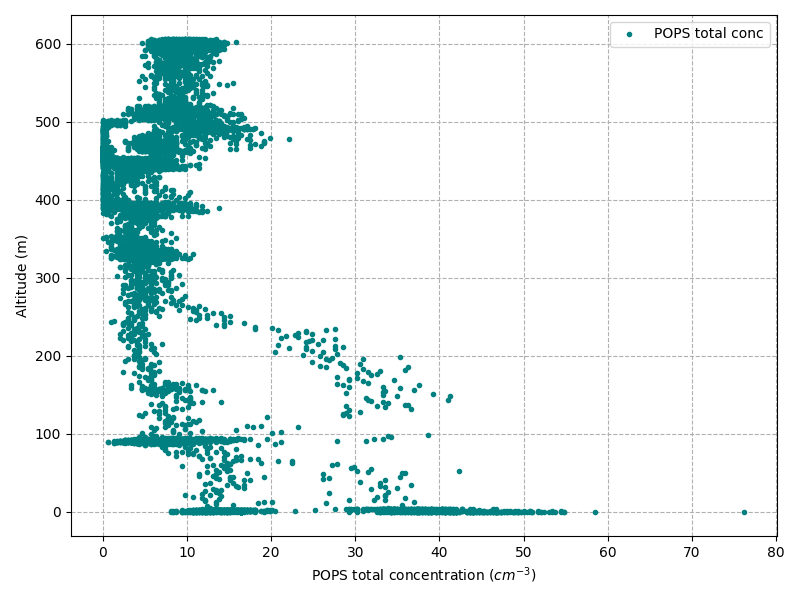

In [10]:
from helikite.instruments.pops import POPS_total_conc_dNdlogDp
%matplotlib ipympl

df = POPS_total_conc_dNdlogDp(df)

**Apply in case of POPS outlier to replace by NaN at a specific timestamp**

In [11]:
pops_b_cols = [col for col in df.columns if col.startswith('pops_b')]
cols_to_nan = pops_b_cols + ['pops_total_conc']

timestamp = pd.Timestamp("2025-02-12 07:57:25")
df.loc[timestamp, cols_to_nan] = np.nan

**Apply in case of intervals with POPS measurements = 0**  

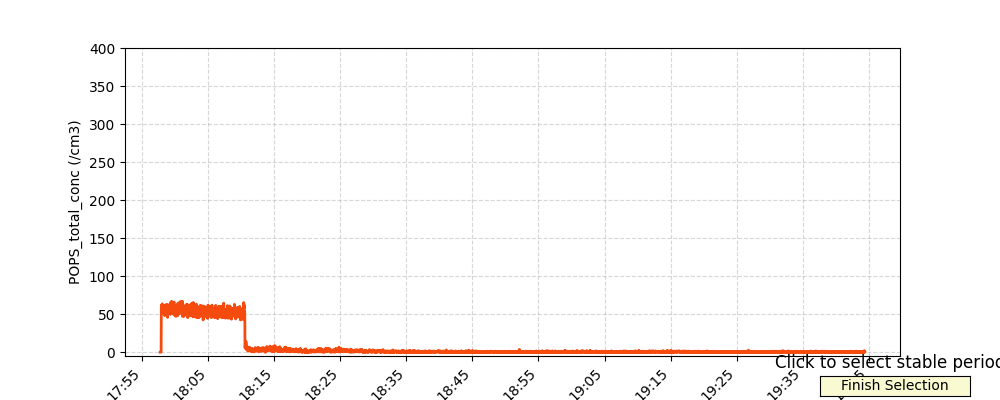

None


In [15]:
import matplotlib.dates as mdates
from matplotlib.widgets import Button
import warnings

# Suppress specific warning
warnings.filterwarnings("ignore", category=DeprecationWarning)
# Suppress all warnings
warnings.filterwarnings("ignore")

%matplotlib widget
plt.close('all')

# Plot setup
fig, ax = plt.subplots(figsize=(10, 4))
palette = ["#F54B0F", "#415067"]

ax.plot(df.index, df["pops_total_conc"], color=palette[0], linewidth=2)
ax.grid(True, ls="--", alpha=0.5)
ax.set_ylim(-5, 400)
ax.set_ylabel("POPS_total_conc (/cm3)")
ax.set_xlabel("Time")
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

# Interaction logic
selected_points = []
stable_periods = []
span_artists = []

def onclick(event):
    if event.inaxes != ax:
        return

    # Skip if zoom or pan mode is active
    if plt.get_current_fig_manager().toolbar.mode != '':
        return
        
    click_time = mdates.num2date(event.xdata)
    selected_points.append(click_time)

    ax.plot(event.xdata, event.ydata, 'o', color=palette[1], markersize=8)
    fig.canvas.draw()

    if len(selected_points) == 2:
        start, end = sorted(selected_points)
        stable_periods.append((start, end))
        span = ax.axvspan(start, end, color=palette[1], alpha=0.2)
        span_artists.append(span)
        selected_points.clear()
        fig.canvas.draw()
results_df = None

def finish_selection(event):
    global results_df

    if stable_periods:
        results_df = pd.DataFrame(stable_periods, columns=['Start_Time', 'End_Time'])
        results_df['Duration'] = results_df['End_Time'] - results_df['Start_Time']
        
        # Optional formatting
        results_df['Start_Time'] = results_df['Start_Time'].dt.strftime('%Y-%m-%d %H:%M:%S')
        results_df['End_Time'] = results_df['End_Time'].dt.strftime('%Y-%m-%d %H:%M:%S')

        print("\nSelected Stable Periods:")
        print(results_df.to_string(index=False))

        # Copy to clipboard
        results_df.to_clipboard(index=False)
        print("\nResults copied to clipboard!")
    else:
        print("No stable periods selected")

# Add button
ax_button = plt.axes([0.82, 0.01, 0.15, 0.05])
btn = Button(ax_button, 'Finish Selection', color='lightgoldenrodyellow')
btn.on_clicked(finish_selection)

# Hook up click handler
fig.canvas.mpl_connect('button_press_event', onclick)

plt.title("Click to select stable periods")
plt.show()

print(results_df)

In [13]:
results_df

,Start_Time,End_Time,Duration
0,2025-02-10 12:26:42,2025-02-10 13:47:08,0 days 01:20:25.963527
1,2025-02-10 13:50:07,2025-02-10 13:50:13,0 days 00:00:06.955402


In [14]:
# Save or load pops mask csv
results_df.to_csv(rf'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1\Level1_{metadata.flight_date}_Flight_{metadata.flight}_POPSmask.csv', index=False)
#results_df = pd.read_csv(rf'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1\Level1_{metadata.flight_date}_Flight_{metadata.flight}_POPSmask.csv')

# Mask pops data in selected time interval
pops_cols = [f'pops_b{i}_dlogDp' for i in range(16)] + ['pops_total_conc']

for _, row in results_df.iterrows():
    start = row['Start_Time']
    end = row['End_Time']
    mask = (df.index >= start) & (df.index <= end)
    df.loc[mask, pops_cols] = np.nan

df.loc["2025-02-10 13:47:00":"2025-02-10 13:47:15", 'pops_b3_dlogDp'] 

DateTime
2025-02-10 13:47:00           NaN
2025-02-10 13:47:01           NaN
2025-02-10 13:47:02           NaN
2025-02-10 13:47:03           NaN
2025-02-10 13:47:04           NaN
2025-02-10 13:47:05           NaN
2025-02-10 13:47:06           NaN
2025-02-10 13:47:07           NaN
2025-02-10 13:47:08           NaN
2025-02-10 13:47:09    249.000628
2025-02-10 13:47:10    163.816203
2025-02-10 13:47:11    366.948294
2025-02-10 13:47:12    288.316517
2025-02-10 13:47:13    327.632405
2025-02-10 13:47:14    353.842998
2025-02-10 13:47:15    373.500942
Name: pops_b3_dlogDp, dtype: float64

### Normalization of POPS concentrations to standard temperature and pressure (STP)

at 0°C (273.15 K) and 1 atm (1013.25 hPa).  

$C_{\text{STP}} = C_{\text{measured}} \times \left( \frac{P_{\text{measured}}}{P_{\text{STP}}} \right) \times \left( \frac{T_{\text{STP}}}{T_{\text{measured}}} \right)$  


       
Adds 'pops_total_conc_stp' and 'pops_bX_dlogDp_stp' into df.

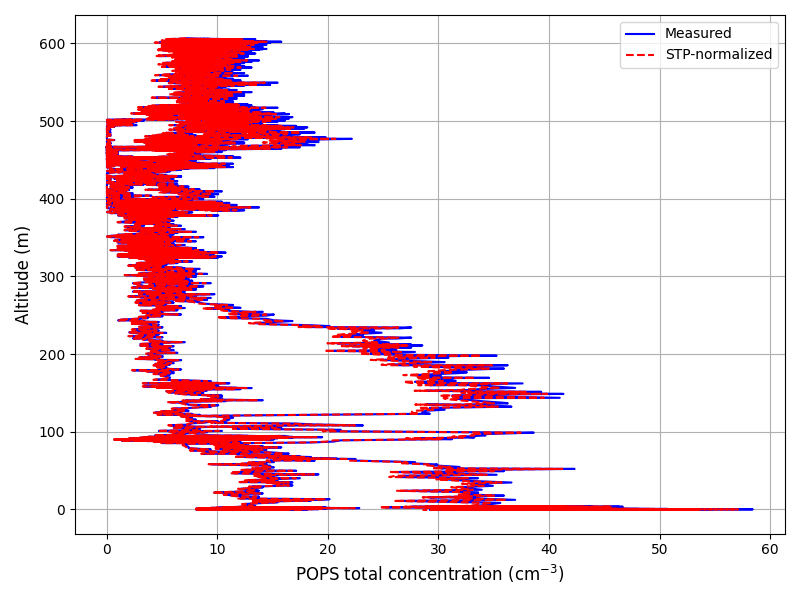

In [12]:
from helikite.instruments.pops import POPS_STP_normalization
%matplotlib ipympl

df = POPS_STP_normalization(df)

### Plot POPS size distribution and total concentration  

STP normalized bin concentrations and total concentration

nan


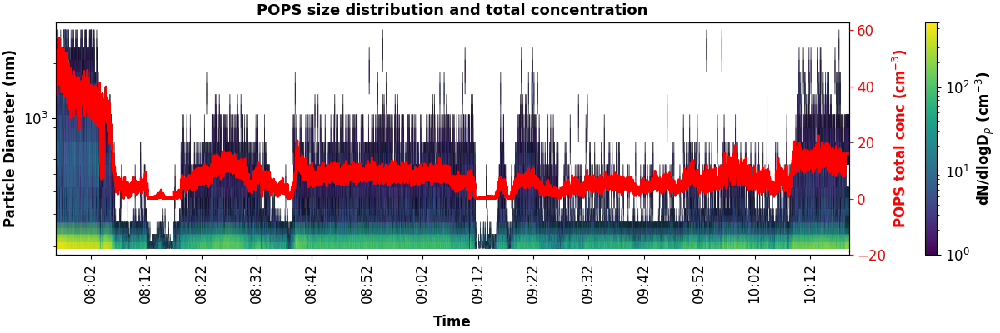

In [13]:
from helikite.instruments.pops import plot_pops_distribution

plot_pops_distribution(df, time_start=None, time_end=None)

## mSEMS data processing
### mSEMS total concentration calculation

*msems_inverted_Bin_ConcX = dN/dlogDp*  
*msems_inverted_dN_Bin_ConcX = conc * dlogDp*  
*msems_inverted_dN_totalconc = sum of msems_inverted_dN_Bin_ConcX*  

Adds 'msems_inverted_dN_Bin_ConcX' and 'msems_inverted_dN_totalconc' into df.

In [14]:
# print(df.columns.tolist())
msems_data= [col for col in df if col.startswith('msems_inverted_')]
print(df[msems_data].columns.tolist())

['msems_inverted_DateTime', 'msems_inverted_Temp(C)', 'msems_inverted_Press(hPa)', 'msems_inverted_NumBins', 'msems_inverted_Bin_Dia1', 'msems_inverted_Bin_Dia2', 'msems_inverted_Bin_Dia3', 'msems_inverted_Bin_Dia4', 'msems_inverted_Bin_Dia5', 'msems_inverted_Bin_Dia6', 'msems_inverted_Bin_Dia7', 'msems_inverted_Bin_Dia8', 'msems_inverted_Bin_Dia9', 'msems_inverted_Bin_Dia10', 'msems_inverted_Bin_Dia11', 'msems_inverted_Bin_Dia12', 'msems_inverted_Bin_Dia13', 'msems_inverted_Bin_Dia14', 'msems_inverted_Bin_Dia15', 'msems_inverted_Bin_Dia16', 'msems_inverted_Bin_Dia17', 'msems_inverted_Bin_Dia18', 'msems_inverted_Bin_Dia19', 'msems_inverted_Bin_Dia20', 'msems_inverted_Bin_Dia21', 'msems_inverted_Bin_Dia22', 'msems_inverted_Bin_Dia23', 'msems_inverted_Bin_Dia24', 'msems_inverted_Bin_Dia25', 'msems_inverted_Bin_Dia26', 'msems_inverted_Bin_Dia27', 'msems_inverted_Bin_Dia28', 'msems_inverted_Bin_Dia29', 'msems_inverted_Bin_Dia30', 'msems_inverted_Bin_Dia31', 'msems_inverted_Bin_Dia32', 'mse

**If no mSEMS measurements, add columns with NaN into dataset.**

In [ ]:
base_columns = [
    'msems_inverted_DateTime', 'msems_inverted_Temp(C)', 'msems_inverted_Press(hPa)',
    'msems_inverted_NumBins', 'msems_inverted_scan_direction',
    'msems_inverted_Bin_Lim0', 'msems_inverted_Bin_Lim60',
    'msems_inverted_StartTime', 'msems_inverted_EndTime', 'msems_inverted_pressure'
]
dia_cols   = [f'msems_inverted_Bin_Dia{i}' for i in range(1, 61)]
conc_cols  = [f'msems_inverted_Bin_Conc{i}' for i in range(1, 61)]
lim_cols   = [f'msems_inverted_Bin_Lim{i}' for i in range(1, 60)]  # 1 to 59

new_columns = base_columns + dia_cols + conc_cols + lim_cols

for col in new_columns:
    if col not in df.columns:
        df[col] = np.nan

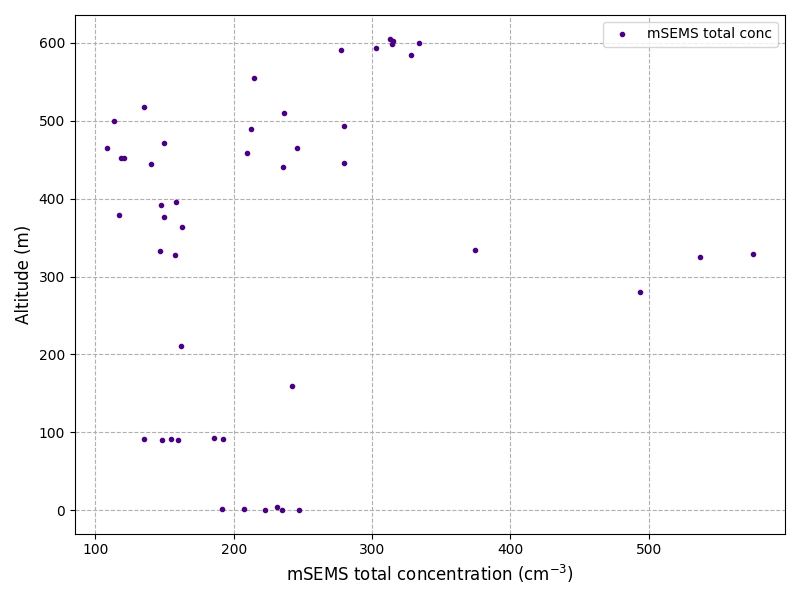

In [15]:
from helikite.instruments.msems import mSEMS_total_conc_dN
%matplotlib ipympl

df = mSEMS_total_conc_dN(df)

### Normalization of mSEMS concentrations to standard temperature and pressure (STP)

at 0°C (273.15 K) and 1 atm (1013.25 hPa).  

$C_{\text{STP}} = C_{\text{measured}} \times \left( \frac{P_{\text{measured}}}{P_{\text{STP}}} \right) \times \left( \frac{T_{\text{STP}}}{T_{\text{measured}}} \right)$  

Adds 'msems_inverted_Bin_ConcX_stp' and 'msems_inverted_dN_totalconc_stp' to df.

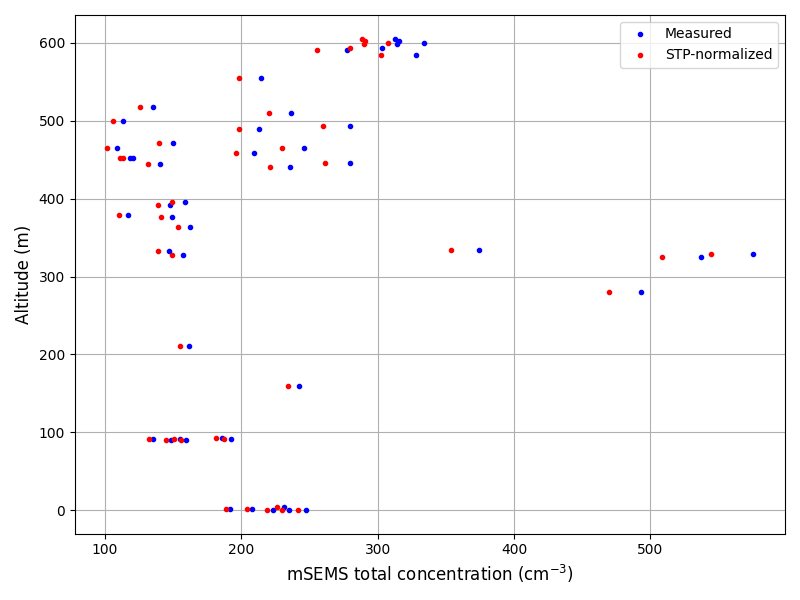

In [16]:
from helikite.instruments.msems import mSEMS_STP_normalization
%matplotlib ipympl

df = mSEMS_STP_normalization(df)

### Plot mSEMS size distribution and total concentration

STP normalized bin concentrations and total concentration

1523.7215266070955


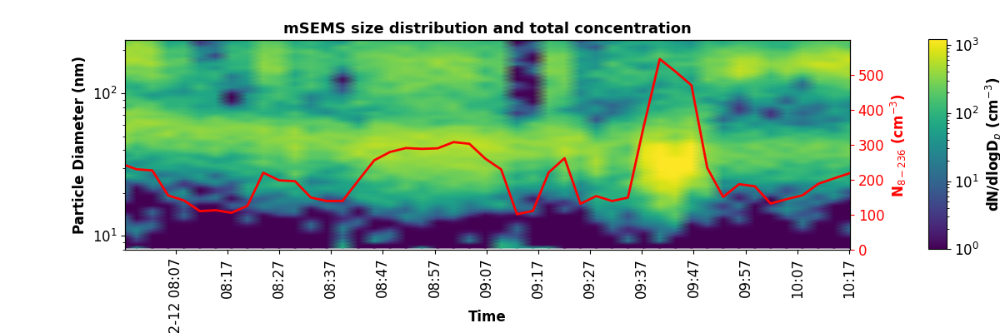

In [17]:
from helikite.instruments.msems import plot_msems_distribution

plot_msems_distribution(df, time_start=None, time_end=None)

**Replace no data or flooded mSEMS measurements by NaN**

In [21]:
import numpy as np

# Define time range of "bad" mSEMS measurements
start_time = "2025-01-27 17:55"
end_time = "2025-01-27 19:45"

inverted_cols = [
    col for col in df.columns 
    if col.startswith("msems_inverted_") and col != "msems_inverted_DateTime"
]

time_mask = (df.index >= pd.to_datetime(start_time)) & (df.index <= pd.to_datetime(end_time))

affected_rows = set()

# Apply only within the time range
for col in inverted_cols:
    col_mask = df[col].map(lambda x: isinstance(x, (int, float)) and not np.isnan(x))
    full_mask = time_mask & col_mask
    affected_rows.update(df.index[full_mask])
    df.loc[full_mask, col] = np.nan

# Count affected rows
print(f"{len(affected_rows)} rows had numeric value replaced by NaN in 'msems_inverted_...' columns within the time range.")

35 rows had numeric value replaced by NaN in 'msems_inverted_...' columns within the time range.


## mCDA data processing
### mCDA bin concentrations, total concentration and normalization per bin width

For bins 1 to 256 :  
*mcda_dataB X = raw counts*  
*mcda_dataB X_dN = counts / (flow rate * sampling interval) = concentration*  
*mcda_dN_totalconc = sum of mcda_dataBX_dN*  
*mcda_dataB X_dN_dlogDp = dN/dlogDp = mcda_dataBX_dN / dlogDp*

Adds 'mcda_dataB X_dN', 'mcda_dN_totalconc' and 'mcda_dataB X_dN_dlogDp' into df.

In [29]:
# Identify columns to drop
#mcda_data = [col for col in df.columns if col.startswith('mcda_')]

# Drop them from the DataFrame
#df = df.drop(columns=mcda_data)

In [28]:
# print(df.columns.tolist())
mcda_data= [col for col in df if col.startswith('mcda_')]
print(df[mcda_data].columns.tolist())

['mcda_DateTime', 'mcda_timestamp_x', 'mcda_set_flow', 'mcda_actual_flow', 'mcda_flow_diff', 'mcda_power %', 'mcda_dataB 1', 'mcda_dataB 2', 'mcda_dataB 3', 'mcda_dataB 4', 'mcda_dataB 5', 'mcda_dataB 6', 'mcda_dataB 7', 'mcda_dataB 8', 'mcda_dataB 9', 'mcda_dataB 10', 'mcda_dataB 11', 'mcda_dataB 12', 'mcda_dataB 13', 'mcda_dataB 14', 'mcda_dataB 15', 'mcda_dataB 16', 'mcda_dataB 17', 'mcda_dataB 18', 'mcda_dataB 19', 'mcda_dataB 20', 'mcda_dataB 21', 'mcda_dataB 22', 'mcda_dataB 23', 'mcda_dataB 24', 'mcda_dataB 25', 'mcda_dataB 26', 'mcda_dataB 27', 'mcda_dataB 28', 'mcda_dataB 29', 'mcda_dataB 30', 'mcda_dataB 31', 'mcda_dataB 32', 'mcda_dataB 33', 'mcda_dataB 34', 'mcda_dataB 35', 'mcda_dataB 36', 'mcda_dataB 37', 'mcda_dataB 38', 'mcda_dataB 39', 'mcda_dataB 40', 'mcda_dataB 41', 'mcda_dataB 42', 'mcda_dataB 43', 'mcda_dataB 44', 'mcda_dataB 45', 'mcda_dataB 46', 'mcda_dataB 47', 'mcda_dataB 48', 'mcda_dataB 49', 'mcda_dataB 50', 'mcda_dataB 51', 'mcda_dataB 52', 'mcda_dataB 53',

**If no mCDA measurements, add columns with NaN into dataset.**

In [23]:
import pandas as pd
import numpy as np

# Identify the position of the last column that starts with 'msems_'
msems_cols = [col for col in df.columns if col.startswith('msems_')]
if not msems_cols:
    raise ValueError("No columns starting with 'msems_' were found in the DataFrame.")

last_msems_index = df.columns.get_loc(msems_cols[-1])

# Define your new columns
first_cols = ['mcda_DateTime', 'mcda_timestamp_x', 'mcda_set_flow', 'mcda_actual_flow', 'mcda_flow_diff', 'mcda_power %']  
mcda_dataB_cols = [f'mcda_dataB {i}' for i in range(1, 513)]
mcda_dataB_dN_cols = [f'mcda_dataB {i}_dN' for i in range(1, 257)]
mcda_dataB_dN_dlogDp_cols = [f'mcda_dataB {i}_dN_dlogDp' for i in range(1, 257)]
last_cols = [
    'mcda_pcount', 'mcda_pm 1', 'mcda_pm 2.5', 'mcda_pm 4', 'mcda_pm 10',
    'mcda_pmtot', 'mcda_timestamp_y', 'mcda_Temperature', 'mcda_Pressure', 'mcda_RH',
    'mcda_pmav', 'mcda_offset1', 'mcda_offset2', 'mcda_calib1', 'mcda_calib2',
    'mcda_measurement_nbr', 'mcda_pressure', 'mcda_dN_totalconc'
]
mcda_cols = first_cols + mcda_dataB_cols + mcda_dataB_dN_cols + mcda_dataB_dN_dlogDp_cols + last_cols

# Create a DataFrame with those new columns (filled with NaN)
mcda_df = pd.DataFrame(np.nan, index=df.index, columns=mcda_cols)

# Insert the new columns into df at the correct position
df = pd.concat([df.iloc[:, :last_msems_index+1], mcda_df, df.iloc[:, last_msems_index+1:]], axis=1)

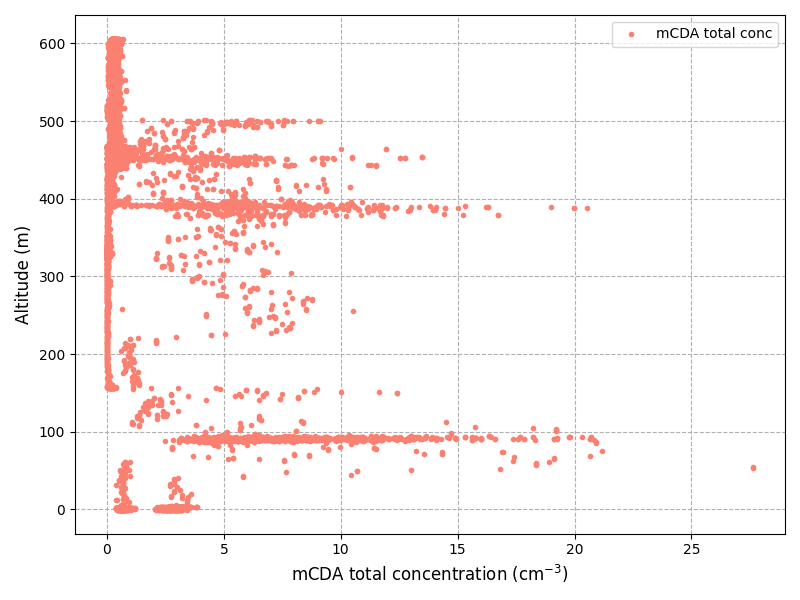

In [18]:
from helikite.instruments.mcda_instrument import mcda_concentration_calculations
%matplotlib ipympl

df = mcda_concentration_calculations(df)

### Normalization of mCDA concentrations to standard temperature and pressure (STP)

at 0°C (273.15 K) and 1 atm (1013.25 hPa).  

$C_{\text{STP}} = C_{\text{measured}} \times \left( \frac{P_{\text{measured}}}{P_{\text{STP}}} \right) \times \left( \frac{T_{\text{STP}}}{T_{\text{measured}}} \right)$  

Adds 'mcda_dataB X_dN_dlogDp_stp' and 'mcda_dN_totalconc_stp' to df.

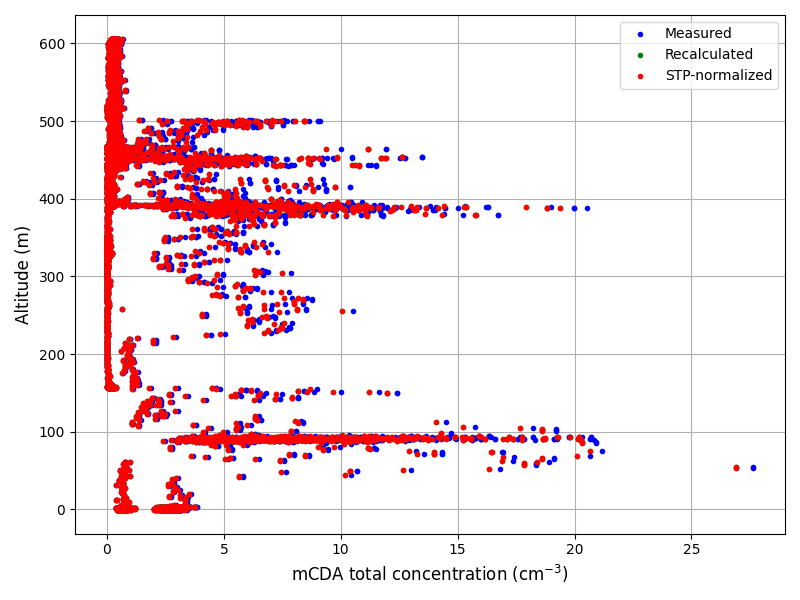

In [19]:
from helikite.instruments.mcda_instrument import mCDA_STP_normalization
%matplotlib ipympl

df = mCDA_STP_normalization(df)

### Plot mCDA size distribution and total concentration

STP normalized bin concentrations and total concentration  

174.39152957579282


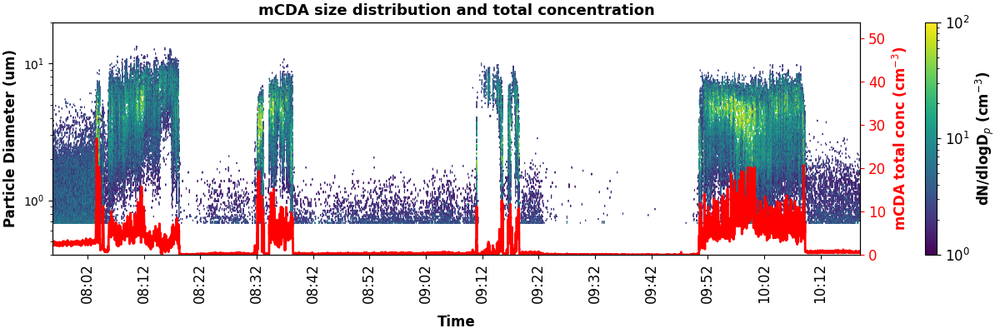

In [20]:
from helikite.instruments.mcda_instrument import Midpoint_diameter_list as Midpoint_diameter_list
from helikite.instruments.mcda_instrument import plot_mcda_distribution

plot_mcda_distribution(df, Midpoint_diameter_list, time_start=None, time_end=None)

**Vertical droplet size distribution**

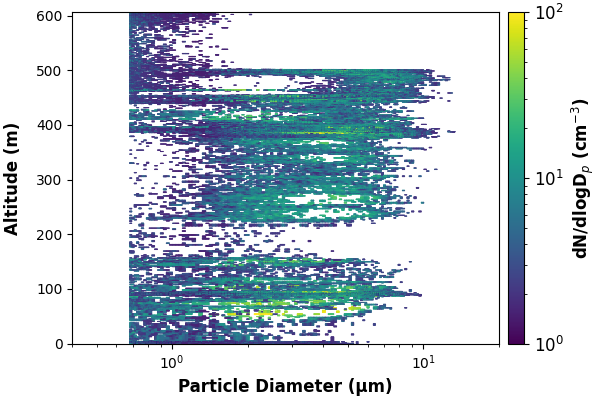

In [21]:
from helikite.instruments.mcda_instrument import Midpoint_diameter_list as Midpoint_diameter_list
from helikite.instruments.mcda_instrument import plot_mcda_vertical_distribution

plot_mcda_vertical_distribution(df, Midpoint_diameter_list)

## CPC3007 data processing

In [ ]:
print(df['cpc_totalconc_raw'])

**If no CPC measurements, add columns with NaN into dataset.**

In [22]:
df['cpc_totalconc_raw'] = np.nan

### Normalization of CPC3007 concentrations to standard temperature and pressure (STP)

at 0°C (273.15 K) and 1 atm (1013.25 hPa).  

$C_{\text{STP}} = C_{\text{measured}} \times \left( \frac{P_{\text{measured}}}{P_{\text{STP}}} \right) \times \left( \frac{T_{\text{STP}}}{T_{\text{measured}}} \right)$  


       
Adds 'CPC_total_N_stp' into df.

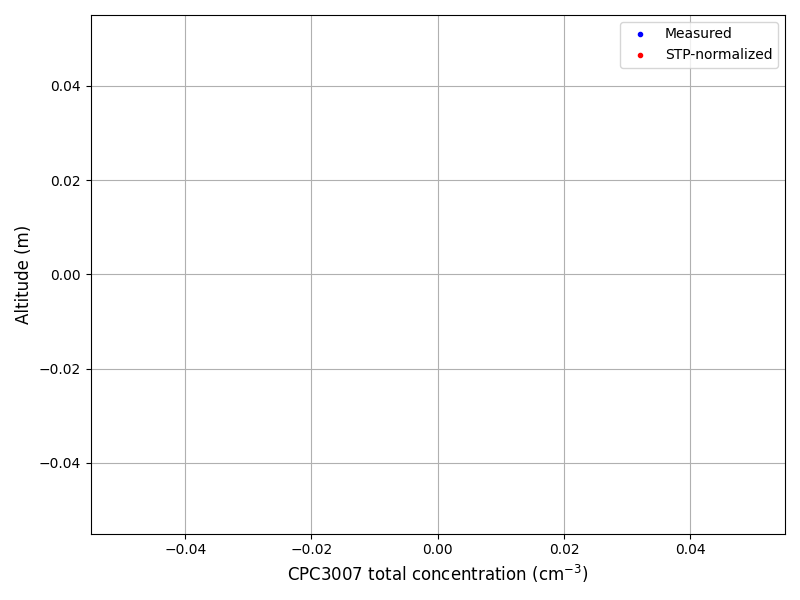

In [23]:
from helikite.instruments.cpc3007 import CPC
%matplotlib ipympl

df = CPC.CPC_STP_normalization(df)

In [24]:
df[['cpc_totalconc_raw', 'cpc_totalconc_stp']].head()

,cpc_totalconc_raw,cpc_totalconc_stp
DateTime,,
2025-02-12 07:55:45,NaN,NaN
2025-02-12 07:55:46,NaN,NaN
2025-02-12 07:55:47,NaN,NaN
2025-02-12 07:55:48,NaN,NaN
2025-02-12 07:55:49,NaN,NaN


## Filter data check

In [ ]:
# NO FILT DATA FROM FC --> READ IN THE FILT FILE AND PASTE IT INTO DF WITH CORRECT NAMES !!!!!

In [28]:
filt = pd.read_csv(r"C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\2024-2025_Sorted\2025-01-27_A\250127A3.TXT", skiprows=13, delimiter='\t')  # or use sep=',' if it's CSV

date_str = filt['#YY/MM/DD'].str.strip()
time_str = filt['HR:MN:SC'].str.strip()
combined = date_str + ' ' + time_str
filt['datetime'] = pd.to_datetime(combined, format='%y/%m/%d %H:%M:%S')
filt = filt.set_index('datetime', drop=False)
filt.columns = 'flight_computer_F_' + filt.columns.astype(str)

filt

,flight_computer_F_#YY/MM/DD,flight_computer_F_HR:MN:SC,flight_computer_F_cur_pos,flight_computer_F_cntdown,flight_computer_F_smp_flw,flight_computer_F_smp_tmp,flight_computer_F_smp_prs,flight_computer_F_pump_pw,flight_computer_F_psvolts,flight_computer_F_err_rpt,flight_computer_F_pumpctl,flight_computer_F_ctlmode,flight_computer_F_intervl,flight_computer_F_flow_sp,flight_computer_F_Unnamed: 14,flight_computer_F_datetime
datetime,,,,,,,,,,,,,,,,
2025-01-27 17:55:48,25/01/27,17:55:48,0,0,-0.07,2.6,984.0,0.0,11.74,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:55:48
2025-01-27 17:55:49,25/01/27,17:55:49,0,0,-0.07,2.6,984.0,0.0,11.75,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:55:49
2025-01-27 17:55:50,25/01/27,17:55:50,0,0,-0.07,2.6,984.0,0.0,11.75,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:55:50
2025-01-27 17:55:51,25/01/27,17:55:51,0,0,-0.06,2.7,984.0,0.0,11.75,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:55:51
2025-01-27 17:55:52,25/01/27,17:55:52,0,0,-0.07,2.6,984.0,0.0,11.75,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:55:52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-27 19:43:06,25/01/27,19:43:06,1,0,-0.08,13.3,984.0,0.0,12.13,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 19:43:06
2025-01-27 19:43:07,25/01/27,19:43:07,1,0,-0.08,13.2,984.0,0.0,12.12,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 19:43:07
2025-01-27 19:43:08,25/01/27,19:43:08,1,0,-0.08,13.3,984.0,0.0,12.12,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 19:43:08


In [29]:
df = df.join(filt, how='left')
df

,pops_Status,pops_PartCt,pops_BL,pops_BLTH,pops_STD,pops_P,pops_TofP,pops_POPS_Flow,pops_PumpFB,pops_LDTemp,...,flight_computer_F_smp_prs,flight_computer_F_pump_pw,flight_computer_F_psvolts,flight_computer_F_err_rpt,flight_computer_F_pumpctl,flight_computer_F_ctlmode,flight_computer_F_intervl,flight_computer_F_flow_sp,flight_computer_F_Unnamed: 14,flight_computer_F_datetime
DateTime,,,,,,,,,,,,,,,,,,,,,
2025-01-27 17:57:43,1,0,2380,2416,12.04,987.90,6.37,-0.08,76.0,29.41,...,984.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:43
2025-01-27 17:57:44,1,30,2380,2413,10.94,987.87,6.38,-0.11,451.0,29.75,...,984.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:44
2025-01-27 17:57:45,1,8,2381,2413,10.83,987.84,6.39,0.42,739.0,30.09,...,984.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:45
2025-01-27 17:57:46,1,41,2379,2410,10.43,987.85,6.40,0.35,1062.0,30.43,...,983.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:46
2025-01-27 17:57:47,1,0,2379,2412,10.90,987.82,6.41,-0.09,1102.0,30.70,...,984.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-27 19:44:21,1,11,2353,2384,10.34,987.60,43.00,2.56,483.0,44.90,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
2025-01-27 19:44:22,1,4,2354,2383,9.82,987.56,43.00,3.02,483.0,44.90,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
2025-01-27 19:44:23,1,5,2353,2383,9.85,987.62,43.00,3.43,483.0,44.90,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT


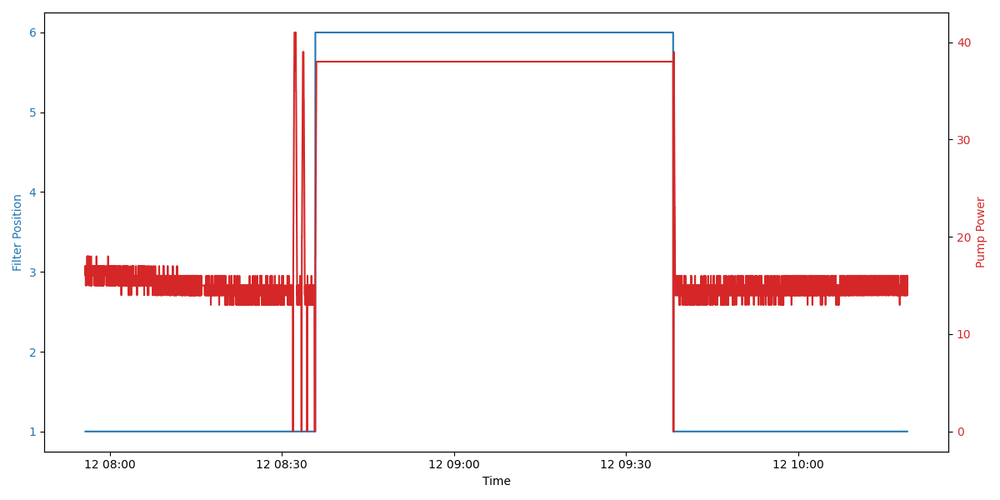

In [27]:
from helikite.processing.post.level1 import filter_data
import matplotlib.pyplot as plt

plt.close('all')
%matplotlib ipympl

filter_data(df)

**In case of broken filters, replace filter positions by 1.**

In [28]:
df['flight_computer_F_cur_pos'] = 1
df['flight_computer_F_pump_pw'] = 0

In [26]:
df.loc[df['flight_computer_F_cur_pos'] == 0, 'flight_computer_F_cur_pos'] = 1
df.loc[df['flight_computer_F_cur_pos'] == 2, 'flight_computer_F_cur_pos'] = 1
df.loc[df['flight_computer_F_cur_pos'] == 4, 'flight_computer_F_cur_pos'] = 1

In [29]:
broken_filter_start = pd.Timestamp("2025-02-11 15:44:14")
broken_filter_end = pd.Timestamp("2025-02-11 16:11:39")
df.loc[df['flight_computer_F_cur_pos'] == 0, 'flight_computer_F_cur_pos'] = 1

df.loc[(df.index >= broken_filter_start) & (df.index <= broken_filter_end), 'flight_computer_F_cur_pos'] = 2.0
df.loc[(df.index >= broken_filter_start) & (df.index <= broken_filter_end), 'flight_computer_F_pump_pw'] = 37.0
df['flight_computer_F_cur_pos']

DateTime
2025-02-11 14:25:15   NaN
2025-02-11 14:25:16   NaN
2025-02-11 14:25:17   NaN
2025-02-11 14:25:18   NaN
2025-02-11 14:25:19   NaN
                       ..
2025-02-11 17:09:27   NaN
2025-02-11 17:09:28   NaN
2025-02-11 17:09:29   NaN
2025-02-11 17:09:30   NaN
2025-02-11 17:09:31   NaN
Name: flight_computer_F_cur_pos, Length: 9857, dtype: float64

## TAPIR data check

In [40]:
tapir_data = [col for col in df if col.startswith('tapir_')]
print(df[tapir_data].columns.tolist())

['tapir_DateTime', 'tapir_ST', 'tapir_YrMoDy', 'tapir_HrMnSd', 'tapir_GT', 'tapir_YrMoDy.1', 'tapir_HrMnSd.1', 'tapir_GL', 'tapir_Lat', 'tapir_Le', 'tapir_Lon', 'tapir_Lm', 'tapir_speed', 'tapir_route', 'tapir_TP', 'tapir_Tproc1', 'tapir_Tproc2', 'tapir_Tproc3', 'tapir_Tproc4', 'tapir_TH', 'tapir_Thead1', 'tapir_Thead2', 'tapir_Thead3', 'tapir_Thead4', 'tapir_TB', 'tapir_Tbox']


**If no TAPIR measurements, add columns with NaN into dataset.**

In [28]:
for col in [
    'tapir_GL', 'tapir_Lat', 'tapir_Le', 'tapir_Lon', 'tapir_Lm',
    'tapir_speed', 'tapir_route', 'tapir_TP', 'tapir_Tproc1', 'tapir_Tproc2',
    'tapir_Tproc3', 'tapir_Tproc4', 'tapir_TH', 'tapir_Thead1', 'tapir_Thead2',
    'tapir_Thead3', 'tapir_Thead4', 'tapir_TB', 'tapir_Tbox'
]:
    df[col] = np.nan

df[['tapir_GL', 'tapir_Lat', 'tapir_Le']].head()

,tapir_GL,tapir_Lat,tapir_Le
DateTime,,,
2025-02-15 09:45:16,NaN,NaN,NaN
2025-02-15 09:45:17,NaN,NaN,NaN
2025-02-15 09:45:18,NaN,NaN,NaN
2025-02-15 09:45:19,NaN,NaN,NaN
2025-02-15 09:45:20,NaN,NaN,NaN


In [32]:
df

,pops_Status,pops_PartCt,pops_BL,pops_BLTH,pops_STD,pops_P,pops_TofP,pops_POPS_Flow,pops_PumpFB,pops_LDTemp,...,flight_computer_F_smp_prs,flight_computer_F_pump_pw,flight_computer_F_psvolts,flight_computer_F_err_rpt,flight_computer_F_pumpctl,flight_computer_F_ctlmode,flight_computer_F_intervl,flight_computer_F_flow_sp,flight_computer_F_Unnamed: 14,flight_computer_F_datetime
DateTime,,,,,,,,,,,,,,,,,,,,,
2025-01-27 17:57:43,1,0,2380,2416,12.04,987.90,6.37,-0.08,76.0,29.41,...,984.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:43
2025-01-27 17:57:44,1,30,2380,2413,10.94,987.87,6.38,-0.11,451.0,29.75,...,984.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:44
2025-01-27 17:57:45,1,8,2381,2413,10.83,987.84,6.39,0.42,739.0,30.09,...,984.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:45
2025-01-27 17:57:46,1,41,2379,2410,10.43,987.85,6.40,0.35,1062.0,30.43,...,983.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:46
2025-01-27 17:57:47,1,0,2379,2412,10.90,987.82,6.41,-0.09,1102.0,30.70,...,984.0,0.0,11.8,0.0,0.0,0.0,2400.0,0.9,NaN,2025-01-27 17:57:47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-27 19:44:21,1,11,2353,2384,10.34,987.60,43.00,2.56,483.0,44.90,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
2025-01-27 19:44:22,1,4,2354,2383,9.82,987.56,43.00,3.02,483.0,44.90,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
2025-01-27 19:44:23,1,5,2353,2383,9.85,987.62,43.00,3.43,483.0,44.90,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT


## Data quicklooks

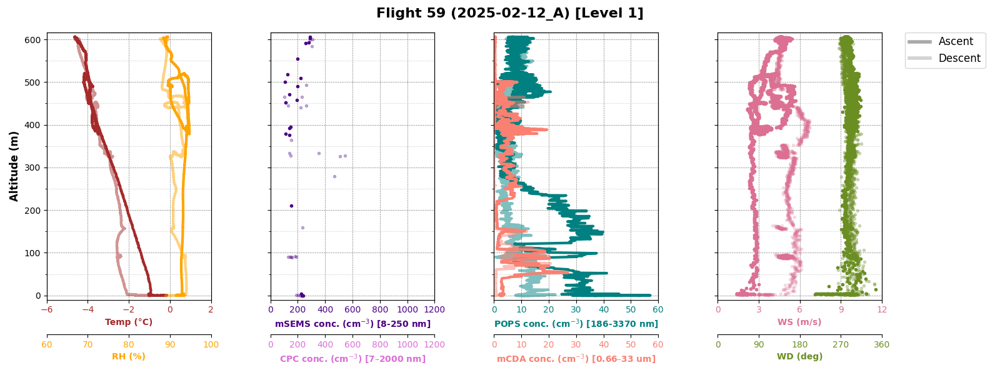

In [28]:
from helikite.processing.post.level1 import flight_profiles_1

# Limits for x-axis (T, RH, mSEMS, CPC, POPS, mCDA, WS, WD)
custom_xlim = {
    'ax1': (-6, 2),
    'ax2': (60, 100),
    'ax3': (0, 1200), 
    'ax4': (0, 1200),
    'ax5': (0, 60),
    'ax6': (0, 60),
    'ax7': (0, 12)
}

custom_xticks = {
    'ax1': np.arange(-6, 3, 2),
    'ax2': np.arange(60, 101, 10), 
    'ax3': np.arange(0, 1201, 200),
    'ax4': np.arange(0, 1201, 200),
    'ax5': np.arange(0, 61, 10),
    'ax6': np.arange(0, 61, 10),
    'ax7': np.arange(0, 13, 3)
}

# Plot title
custom_title = f'Flight {metadata.flight} ({metadata.flight_date}_A) [Level 1]'

fig = flight_profiles_1(df, metadata, xlims=custom_xlim, xticks=custom_xticks, fig_title=custom_title)

# Save the figure after plotting
#folder_path = r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1'
#filename = f'Level1_{metadata.flight_date}_A_Flight_{metadata.flight}.png'
#save_path = f'{folder_path}\\{filename}'
#print("Saving figure to:", save_path)
#fig.savefig(save_path, dpi=300, bbox_inches='tight')

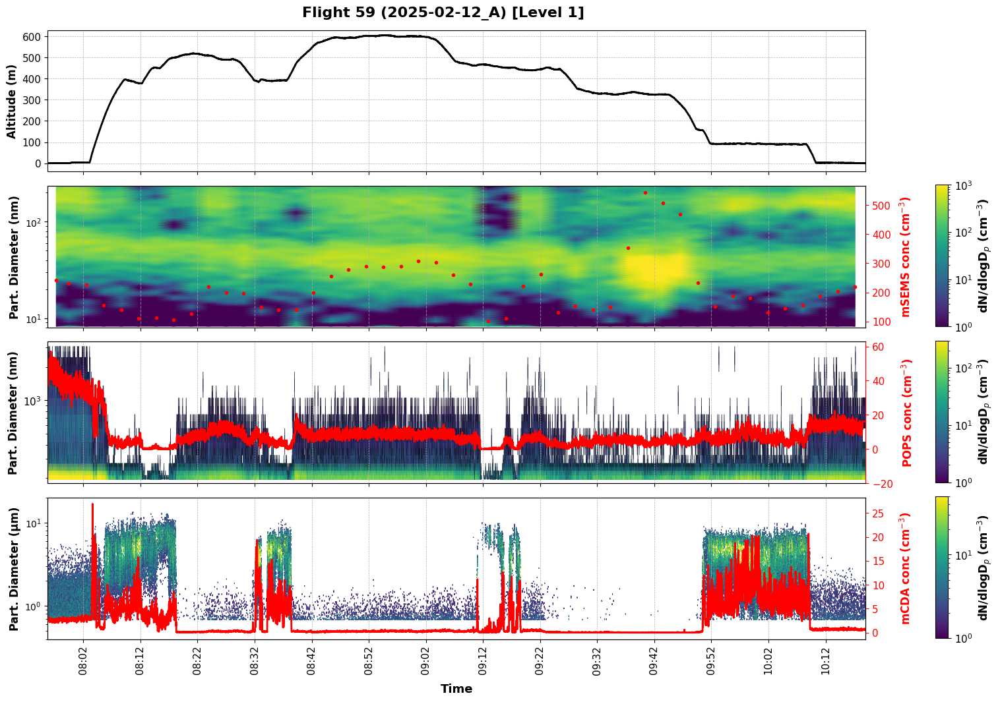

In [29]:
# TEMPORAL PLOT OF FLIGHT with POPS and mSEMS HEAT MAPS

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
from matplotlib.lines import Line2D
import matplotlib.ticker as ticker
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.colors as mcols
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

%matplotlib inline
plt.close('all')

# Create figure with 3 subplots, sharing the same x-axis
fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True, gridspec_kw={'height_ratios': [1, 1, 1, 1]})
plt.subplots_adjust(hspace=0.1)

""" SET THE TITLE OF THE PLOT (FLIGHT N° with DATE_X) """
# 'i' will automatically be replaced by the set flight number
# '_X' has to be changed manually in function of the flight index of the day (A, B, ...)
fig.suptitle(f'Flight {metadata.flight} ({metadata.flight_date}_A) [Level 1]', fontsize=16, fontweight='bold', y=0.91)

### SUBPLOT 1: Altitude vs. Time
ax1 = axes[0]
ax1.plot(df.index, df['Altitude'], color='black', linewidth=2, label='Altitude')

ax1.set_ylabel('Altitude (m)', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y', labelsize=11)
ax1.grid(True, linestyle='--', linewidth=0.5)
ax1.tick_params(axis='x', labelbottom=False)
ax1.set_ylim(-40, df['Altitude'].max() * 1.04)

### SUBPLOT 2: mSEMS heatmmap & total concentration
ax2 = axes[1]

# Get diameter bin averages
start_dia = 'msems_inverted_Bin_Dia1'
end_dia = 'msems_inverted_Bin_Dia60'
bin_diameter_averages = df.loc[:, start_dia:end_dia].mean()

# Get concentration data
start_conc = 'msems_inverted_Bin_Conc1_stp'
end_conc = 'msems_inverted_Bin_Conc60_stp'
counts = df.loc[:, start_conc:end_conc]
counts.index = df.index
counts = counts.astype(float).dropna(how='any')
counts = counts.clip(lower=1)

# Create 2D grid
xx, yy = np.meshgrid(counts.index.values, bin_diameter_averages)

# Contour plot
norm = mcolors.LogNorm(vmin=1, vmax=1000)
mesh = ax2.pcolormesh(xx, yy, counts.values.T, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax2)
cax = inset_axes(ax2, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax2.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=13, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Add Secondary Y-axis for Total Concentration
ax2_right = ax2.twinx()
total_conc = df['msems_inverted_dN_totalconc_stp']
ax2_right.scatter(df.index, total_conc, color='red', marker='.')
ax2_right.set_ylabel('mSEMS conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=8)
ax2_right.tick_params(axis='y', labelsize=11, colors='red')
#ax2_right.set_ylim(0, total_conc.max() * 1.1)

# Labels and limits
ax2.set_yscale('log')
ax2.set_ylabel('Part. Diameter (nm)', fontsize=12, fontweight='bold')
ax2.set_ylim(8, 236)
ax2.grid(True, linestyle='--', alpha=0.6, axis='x')


### SUBPLOT 3: POPS heatmap & total concentration 
ax3 = axes[2]

# Define pops_dlogDp variable from Hendix documentation
pops_dia = [
    149.0801282, 162.7094017, 178.3613191, 195.2873341, 
    212.890625, 234.121875, 272.2136986, 322.6106374, 
    422.0817873, 561.8906456, 748.8896681, 1054.138693,
    1358.502538, 1802.347716, 2440.99162, 3061.590212
]

pops_dlogDp = [
    0.036454582, 0.039402553, 0.040330922, 0.038498955,
    0.036550107, 0.045593506, 0.082615487, 0.066315868,
    0.15575785, 0.100807113, 0.142865049, 0.152476328,
    0.077693935, 0.157186601, 0.113075192, 0.086705426
]

# Define the range of columns for POPS concentration
start_conc = 'pops_b3_dlogDp_stp'
end_conc = 'pops_b15_dlogDp_stp'

# Get POPS concentration data
pops_counts = df.loc[:, start_conc:end_conc]
pops_counts = pops_counts.set_index(df.index).astype(float)

# Create 2D grid
#pops_dia = np.logspace(np.log10(180), np.log10(3370), num=pops_counts.shape[1])
bin_diameters = pops_dia[3:16]
xx, yy = np.meshgrid(pops_counts.index.values, bin_diameters)

# Heatmap
norm = mcolors.LogNorm(vmin=1, vmax=300)
mesh = ax3.pcolormesh(xx, yy, pops_counts.values.T, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax3)
cax = inset_axes(ax3, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax3.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=12, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Labels and grid
ax3.set_yscale('log')
ax3.set_ylabel('Part. Diameter (nm)', fontsize=12, fontweight='bold')
ax3.tick_params(axis='y', labelsize=11)
ax3.grid(True, linestyle='--', linewidth=0.5, axis='x')
ax3.grid(False, axis='y')
ax3.set_ylim(180, 3370)

# Add Secondary Y-axis for Total POPS Concentration
ax3_right = ax3.twinx()
ax3_right.plot(df.index, df['pops_total_conc_stp'], color='red', linewidth=2, label='Total POPS Conc.')
ax3_right.set_ylabel('POPS conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=8)
ax3_right.tick_params(axis='y', labelsize=11, colors='red')
ax3_right.spines['right'].set_color('red')
ax3_right.set_ylim(-20, df['pops_total_conc_stp'].max() * 1.1)

### Subplot 4: mCDA heatmap & total concentration 
ax4 = axes[3]

# Midpoint diameters 
Midpoint_diameter_list = np.array([
    0.244381, 0.246646, 0.248908, 0.251144, 0.253398, 0.255593, 0.257846, 0.260141, 0.262561, 0.265062, 0.267712, 0.270370, 0.273159, 0.275904, 0.278724, 0.281554, 0.284585, 0.287661, 0.290892, 0.294127, 0.297512, 0.300813, 0.304101, 0.307439,
    0.310919, 0.314493, 0.318336, 0.322265, 0.326283, 0.330307, 0.334409, 0.338478, 0.342743, 0.347102, 0.351648, 0.356225, 0.360972, 0.365856, 0.371028, 0.376344, 0.382058, 0.387995, 0.394223, 0.400632, 0.407341, 0.414345, 0.421740, 0.429371,
    0.437556, 0.446036, 0.454738, 0.463515, 0.472572, 0.481728, 0.491201, 0.500739, 0.510645, 0.520720, 0.530938, 0.541128, 0.551563, 0.562058, 0.572951, 0.583736, 0.594907, 0.606101, 0.617542, 0.628738, 0.640375, 0.652197, 0.664789, 0.677657,
    0.691517, 0.705944, 0.721263, 0.736906, 0.753552, 0.770735, 0.789397, 0.808690, 0.829510, 0.851216, 0.874296, 0.897757, 0.922457, 0.948074, 0.975372, 1.003264, 1.033206, 1.064365, 1.097090, 1.130405, 1.165455, 1.201346, 1.239589, 1.278023,
    1.318937, 1.360743, 1.403723, 1.446000, 1.489565, 1.532676, 1.577436, 1.621533, 1.667088, 1.712520, 1.758571, 1.802912, 1.847836, 1.891948, 1.937088, 1.981087, 2.027604, 2.074306, 2.121821, 2.168489, 2.216644, 2.263724, 2.312591, 2.361099,
    2.412220, 2.464198, 2.518098, 2.571786, 2.628213, 2.685162, 2.745035, 2.805450, 2.869842, 2.935997, 3.005175, 3.074905, 3.148598, 3.224051, 3.305016, 3.387588, 3.476382, 3.568195, 3.664863, 3.761628, 3.863183, 3.965651, 4.072830, 4.179050,
    4.289743, 4.400463, 4.512449, 4.621025, 4.731530, 4.839920, 4.949855, 5.057777, 5.169742, 5.281416, 5.395039, 5.506828, 5.621488, 5.734391, 5.849553, 5.962881, 6.081516, 6.200801, 6.322133, 6.441786, 6.565130, 6.686935, 6.813017, 6.938981,
    7.071558, 7.205968, 7.345185, 7.483423, 7.628105, 7.774385, 7.926945, 8.080500, 8.247832, 8.419585, 8.598929, 8.780634, 8.973158, 9.167022, 9.372760, 9.582145, 9.808045, 10.041607, 10.287848, 10.537226, 10.801172, 11.068405, 11.345135,
    11.621413, 11.910639, 12.200227, 12.492929, 12.780176, 13.072476, 13.359067, 13.651163, 13.937329, 14.232032, 14.523919, 14.819204, 15.106612, 15.402110, 15.695489, 15.998035, 16.297519, 16.610927, 16.926800, 17.250511,
    17.570901, 17.904338, 18.239874, 18.588605, 18.938763, 19.311505, 19.693678, 20.093464, 20.498208, 20.927653, 21.366609, 21.827923, 22.297936, 22.802929, 23.325426, 23.872344, 24.428708, 25.016547, 25.616663, 26.249815,
    26.888493, 27.563838, 28.246317, 28.944507, 29.626186, 30.323440, 31.005915, 31.691752, 32.353900, 33.030123, 33.692286, 34.350532, 34.984611, 35.626553, 36.250913, 36.878655, 37.489663, 38.121550, 38.748073, 39.384594, 
    40.008540, 40.654627, 41.292757, 41.937789, 42.578436
])

# Prepare data
counts = df.loc[:, 'mcda_dataB 1_dN_dlogDp_stp':'mcda_dataB 256_dN_dlogDp_stp']
counts = counts.set_index(df.index)
counts = counts.astype(float)
counts[counts == 0] = np.nan

bin_diameters = Midpoint_diameter_list
xx, yy = np.meshgrid(counts.index.values, bin_diameters)
Z = counts.values.T

# Plot heatmap
norm = mcolors.LogNorm(vmin=1, vmax=50)
mesh = ax4.pcolormesh(xx, yy, Z, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax4)
cax = inset_axes(ax4, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax4.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=12, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Total concentration
ax4_right = ax4.twinx()
total_conc = df['mcda_dN_totalconc_stp']
ax4_right.plot(df.index, total_conc, color='red', linewidth=2)
ax4_right.set_ylabel('mCDA conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=15)
ax4_right.tick_params(axis='y', labelsize=11, colors='red')
#ax4_right.set_ylim(0, total_conc.max() * 2)
#ax4_right.set_xlim(ax4.get_xlim())

# Axis styling
ax4.set_yscale('log')
ax4.set_ylabel('Part. Diameter (μm)', fontsize=12, fontweight='bold')
ax4.set_ylim(0.4, 20)
ax4.grid(True, linestyle='--', linewidth=0.5, axis='x')
ax4.grid(False, axis='y')

# Legend for secondary y-axis
#ax2_right.legend(['mSEMS total conc.'], loc='upper right', fontsize=11, frameon=False)
#ax3_right.legend(['POPS total conc.'], loc='upper right', fontsize=11, frameon=False)
#ax4_right.legend(['mCDA total conc.'], loc='upper right', fontsize=11, frameon=False)

# X-axis formatting for all subplots
ax4.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax4.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax4.set_xlabel('Time', fontsize=13, fontweight='bold', labelpad=10)
ax4.tick_params(axis='x', rotation=90, labelsize=11)


""" SET TIME RANGE (DATE + TIME) """
#ax3.set_xlim(pd.Timestamp('2025-02-12T07:55:00'), pd.Timestamp('2025-02-12T10:20:00'))

""" SAVE PLOT """
#folder_path = r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1'
#filename = f'Level1_{metadata.flight_date}_A_SizeDistr_Flight_{metadata.flight}.png'
#save_path = f'{folder_path}\\{filename}'
#print("Saving figure to:", save_path)
#fig.savefig(save_path, dpi=300, bbox_inches='tight')

#plt.tight_layout()
plt.show()

## Level 1
**Save file containing all the columns (processed)**

In [38]:
""" CHANGE NAME OF OUTPUT FILE """

df.to_csv(r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1\level1_2025-01-27_A.csv', index=True)

# Data processing - Level 1.5  

- Remove data before and after landing – the data processor needs to take an expert judgement (first couple of meters)
- Definition of columns, order them specifically for final output, 1 file per campaign
- Only report instruments that were flown in that campaign   
  
Timestamp (native), altitude, lat, lon, pressure, Temp, RH, wind speed, wind direction  
Total conc: POPS, mSEMS, miniCDA, CPC, ‘other’ (e.g., partector, LOAC)  
Other total variables: absorption coefficients, eBC concentration, CO2, CO, O3  
Size distributions: usable POPS bins; mSEMS bins, mCDA bins, other (partector bins, LOAC bins)  
Pollution flag*, Flight number, campaign name  
  
*: if pollution was not targeted in the science and not representative of the local environment (e.g., pollution in ALPACA = not to be flagged as pollution; during ArtofMelt = pollution has to be flagged)

## Load level 1 dataset

In [44]:
import pandas as pd

""" CHANGE NAME OF INPUT FILE """

df_level1 = pd.read_csv(
    r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1\level1_2025-02-12_A.csv',
    index_col='DateTime',
    parse_dates=['DateTime']
)

if 'DateTime.1' in df_level1.columns:
    df_level1.rename(columns={'DateTime.1': 'DateTime'}, inplace=True)
    
df_level1

C:\Users\temel\AppData\Local\Temp\ipykernel_32936\2239130870.py:5: DtypeWarning:

Columns (96,104) have mixed types. Specify dtype option on import or set low_memory=False.



,flight_computer_Time,flight_computer_F_cur_pos,flight_computer_F_cntdown,flight_computer_F_smp_flw,flight_computer_F_smp_tmp,flight_computer_F_smp_prs,flight_computer_F_pump_pw,flight_computer_F_psvolts,flight_computer_F_err_rpt,flight_computer_SO_S,...,latitude_dd,longitude_dd,Average_Temperature,Average_RH,DateTime,Pressure_ground,Temperature_ground,Altitude,cpc_totalconc_raw,cpc_totalconc_stp
DateTime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:55:45,250212-075545,1.0,0.0,0.83,1.7,983.0,17.0,11.91,0.0,2.32,...,-70.662060,-8.285985,-0.180,93.450,2025-02-12 07:55:45,989.291667,272.921167,0.013507,NaN,NaN
2025-02-12 07:55:46,250212-075546,1.0,0.0,1.00,1.7,982.0,16.0,11.92,0.0,1.91,...,-70.662060,-8.285985,-0.195,93.420,2025-02-12 07:55:46,989.291653,272.921072,0.418624,NaN,NaN
2025-02-12 07:55:47,250212-075547,1.0,0.0,0.77,1.7,983.0,16.0,11.94,0.0,1.95,...,-70.662060,-8.285985,-0.180,93.445,2025-02-12 07:55:47,989.291640,272.920977,0.094336,NaN,NaN
2025-02-12 07:55:48,250212-075548,1.0,0.0,0.92,1.7,982.0,17.0,11.94,0.0,2.23,...,-70.662060,-8.285985,-0.170,93.415,2025-02-12 07:55:48,989.291627,272.920882,-0.067857,NaN,NaN
2025-02-12 07:55:49,250212-075549,1.0,0.0,0.94,1.7,982.0,15.0,11.94,0.0,2.36,...,-70.662060,-8.285985,-0.195,93.400,2025-02-12 07:55:49,989.291614,272.920787,0.256209,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-12 10:18:57,250212-101857,1.0,0.0,1.06,18.0,982.0,14.0,12.00,0.0,4.01,...,-70.662037,-8.286063,-0.975,89.040,2025-02-12 10:18:57,989.177886,272.105463,-0.097883,NaN,NaN
2025-02-12 10:18:58,250212-101858,1.0,0.0,0.81,18.0,983.0,15.0,11.97,0.0,4.28,...,-70.662045,-8.286063,-0.960,89.015,2025-02-12 10:18:58,989.177873,272.105368,0.225230,NaN,NaN
2025-02-12 10:18:59,250212-101859,1.0,0.0,0.99,18.0,982.0,14.0,11.99,0.0,3.57,...,-70.662045,-8.286063,-0.970,89.020,2025-02-12 10:18:59,989.177860,272.105273,-0.259702,NaN,NaN


## Fill in msems values at takeoff and landing times

'takeoff_time' and 'landing_time' selected in level 0 and stored in the metadata.  
  
mSEMS scan and inverted data are available every 3 minutes. To avoid losing data points at the beginning and end of the flight (due to cutting the DataFrame at takeoff and landing), the empty timestamps at takeoff and landing are filled with the closest available mSEMS data within a 90-second window.

In [45]:
from helikite.processing.post.level1 import fill_msems_takeoff_landing
fill_msems_takeoff_landing(df_level1, metadata, time_window_seconds=90)

Filled mSEMS columns at takeoff_time (2025-02-12 07:59:35) using values from 2025-02-12 07:59:28
Filled mSEMS columns at landing_time (2025-02-12 10:17:15) using values from 2025-02-12 10:17:10


## Remove data from before takeoff and after landing time

'takeoff_time' and 'landing_time' selected in level 0 and stored in the metadata.

In [46]:
df_level1 = df_level1.loc[metadata.takeoff_time : metadata.landing_time]
#df_level1 = df_level1.loc[metadata.takeoff_time : "2025-02-06 17:58:00"]
df_level1.iloc[[0, -1]]

,flight_computer_Time,flight_computer_F_cur_pos,flight_computer_F_cntdown,flight_computer_F_smp_flw,flight_computer_F_smp_tmp,flight_computer_F_smp_prs,flight_computer_F_pump_pw,flight_computer_F_psvolts,flight_computer_F_err_rpt,flight_computer_SO_S,...,latitude_dd,longitude_dd,Average_Temperature,Average_RH,DateTime,Pressure_ground,Temperature_ground,Altitude,cpc_totalconc_raw,cpc_totalconc_stp
DateTime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:59:35,250212-075935,1.0,0.0,0.93,2.9,982.0,15.0,11.83,0.0,1.93,...,-70.662028,-8.286042,-0.990,93.180,2025-02-12 07:59:35,989.288621,272.899331,-0.578409,NaN,NaN
2025-02-12 10:17:15,250212-101715,1.0,0.0,0.86,18.2,982.0,16.0,11.91,0.0,4.16,...,-70.662028,-8.286050,-1.555,91.495,2025-02-12 10:17:15,989.179237,272.115147,-0.167778,NaN,NaN


## Columns - rename and select defined columns
**Column list and names for final data file**  

datetime,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,  
POPS_total_N,mSEMS_total_N, mCDA_total_N, CPC_total_N,  
Filter_position,Filter_flow,  
POPS_b3,POPS_b4,POPS_b5,POPS_b6,POPS_b7,POPS_b8,POPS_b9,POPS_b10,POPS_b11,POPS_b12,POPS_b13,POPS_b14,POPS_b15,  
mSEMS_Bin_Conc1,mSEMS_Bin_Conc2,mSEMS_Bin_Conc3,mSEMS_Bin_Conc4,mSEMS_Bin_Conc5,mSEMS_Bin_Conc6,mSEMS_Bin_Conc7,mSEMS_Bin_Conc8,mSEMS_Bin_Conc9,mSEMS_Bin_Conc10,  
mSEMS_Bin_Conc11,mSEMS_Bin_Conc12,mSEMS_Bin_Conc13,mSEMS_Bin_Conc14,mSEMS_Bin_Conc15,mSEMS_Bin_Conc16,mSEMS_Bin_Conc17,mSEMS_Bin_Conc18,mSEMS_Bin_Conc19,mSEMS_Bin_Conc20,  
mSEMS_Bin_Conc21,mSEMS_Bin_Conc22,mSEMS_Bin_Conc23,mSEMS_Bin_Conc24,mSEMS_Bin_Conc25,mSEMS_Bin_Conc26,mSEMS_Bin_Conc27,mSEMS_Bin_Conc28,mSEMS_Bin_Conc29,mSEMS_Bin_Conc30,  
mSEMS_Bin_Conc31,mSEMS_Bin_Conc32,mSEMS_Bin_Conc33,mSEMS_Bin_Conc34,mSEMS_Bin_Conc35,mSEMS_Bin_Conc36,mSEMS_Bin_Conc37,mSEMS_Bin_Conc38,mSEMS_Bin_Conc39,mSEMS_Bin_Conc40,  
mSEMS_Bin_Conc41,mSEMS_Bin_Conc42,mSEMS_Bin_Conc43,mSEMS_Bin_Conc44,mSEMS_Bin_Conc45,mSEMS_Bin_Conc46,mSEMS_Bin_Conc47,mSEMS_Bin_Conc48,mSEMS_Bin_Conc49,mSEMS_Bin_Conc50,  
mSEMS_Bin_Conc51,mSEMS_Bin_Conc52,mSEMS_Bin_Conc53,mSEMS_Bin_Conc54,mSEMS_Bin_Conc55,mSEMS_Bin_Conc56,mSEMS_Bin_Conc57,mSEMS_Bin_Conc58,mSEMS_Bin_Conc59,mSEMS_Bin_Conc60,  
mCDA_dataB1, ... , mCDA_dataB256,  
tapir_GL,tapir_Lat,tapir_Le,tapir_Lon,tapir_Lm,tapir_speed,tapir_route,tapir_TP,tapir_Tproc1,tapir_Tproc2,tapir_Tproc3,tapir_Tproc4,tapir_TH,tapir_Thead1,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,  
flag_pollution,flag_hovering,flag_cloud,flight_nr,campaign  

In [57]:
# In case of missing columns
df_level1['latitude_dd'] = np.nan
df_level1['longitude_dd'] = np.nan
df_level1['flight_computer_F_smp_flw'] = np.nan

In [47]:
from helikite.processing.post.level1 import create_level1_dataframe
from helikite.processing.post.level1 import rename_columns
from helikite.processing.post.level1 import round_flightnbr_campaign

df_level1 = create_level1_dataframe(df_level1)
df_level1 = rename_columns(df_level1)
df_level1 = round_flightnbr_campaign(df_level1, metadata, decimals=2)

df_level1

C:\Users\temel\helikite-data-processing\Yolanda-helikite-data-processing\helikite\processing\post\level1.py:128: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\temel\helikite-data-processing\Yolanda-helikite-data-processing\helikite\processing\post\level1.py:129: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



,datetime,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,...,tapir_Tproc4,tapir_TH,tapir_Thead1,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,flight_nr,campaign
DateTime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:59:35,2025-02-12 07:59:35,-0.58,-70.662,-8.286,989.36,-0.99,93.18,NaN,<NA>,34.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 07:59:36,2025-02-12 07:59:36,-0.25,-70.662,-8.286,989.32,-0.99,93.22,NaN,<NA>,39.82,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 07:59:37,2025-02-12 07:59:37,-0.01,-70.662,-8.286,989.29,-1.00,93.19,NaN,<NA>,32.25,...,0.2,TH,2.7,1.9,2.1,4.1,TB,5.5,59,ORACLES
2025-02-12 07:59:38,2025-02-12 07:59:38,-0.01,-70.662,-8.286,989.29,-1.01,93.18,NaN,<NA>,33.57,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 07:59:39,2025-02-12 07:59:39,0.31,-70.662,-8.286,989.25,-0.98,93.20,NaN,<NA>,38.83,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-12 10:17:11,2025-02-12 10:17:11,0.24,-70.662,-8.286,989.15,-1.64,91.46,NaN,<NA>,13.19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 10:17:12,2025-02-12 10:17:12,0.40,-70.662,-8.286,989.13,-1.62,91.49,NaN,<NA>,12.53,...,10.6,TH,5.9,4.9,5.3,7.4,TB,19.8,59,ORACLES
2025-02-12 10:17:13,2025-02-12 10:17:13,-0.01,-70.662,-8.286,989.18,-1.58,91.50,NaN,<NA>,12.86,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES


## Level 1.5
**Save file with colums to keep and cut to takeoff and landing.**

In [39]:
print(df_level1.columns.tolist())

['datetime', 'Altitude', 'Lat', 'Long', 'P', 'TEMP', 'RH', 'WindSpeed', 'WindDir', 'POPS_total_N', 'mSEMS_total_N', 'mCDA_total_N', 'CPC_total_N', 'Filter_position', 'Filter_flow', 'POPS_b3', 'POPS_b4', 'POPS_b5', 'POPS_b6', 'POPS_b7', 'POPS_b8', 'POPS_b9', 'POPS_b10', 'POPS_b11', 'POPS_b12', 'POPS_b13', 'POPS_b14', 'POPS_b15', 'mSEMS_Bin_Conc1', 'mSEMS_Bin_Conc2', 'mSEMS_Bin_Conc3', 'mSEMS_Bin_Conc4', 'mSEMS_Bin_Conc5', 'mSEMS_Bin_Conc6', 'mSEMS_Bin_Conc7', 'mSEMS_Bin_Conc8', 'mSEMS_Bin_Conc9', 'mSEMS_Bin_Conc10', 'mSEMS_Bin_Conc11', 'mSEMS_Bin_Conc12', 'mSEMS_Bin_Conc13', 'mSEMS_Bin_Conc14', 'mSEMS_Bin_Conc15', 'mSEMS_Bin_Conc16', 'mSEMS_Bin_Conc17', 'mSEMS_Bin_Conc18', 'mSEMS_Bin_Conc19', 'mSEMS_Bin_Conc20', 'mSEMS_Bin_Conc21', 'mSEMS_Bin_Conc22', 'mSEMS_Bin_Conc23', 'mSEMS_Bin_Conc24', 'mSEMS_Bin_Conc25', 'mSEMS_Bin_Conc26', 'mSEMS_Bin_Conc27', 'mSEMS_Bin_Conc28', 'mSEMS_Bin_Conc29', 'mSEMS_Bin_Conc30', 'mSEMS_Bin_Conc31', 'mSEMS_Bin_Conc32', 'mSEMS_Bin_Conc33', 'mSEMS_Bin_Conc34',

In [45]:
""" CHANGE NAME OF OUTPUT FILE """

df_level1.to_csv(r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1.5\level1.5_2025-01-27_A.csv', index=False)

# Data processing - Level 2  
Adding flags:  
- Pollution flag
- Cloud (1 = in; 0 = out)  
- Hovering flag (0=moving; 1 = hovering, more than 2 min)

**Not done in this case**  
Time averaging:  
- 10 sec all instruments, but  
- mSEMS remains native)

## Load level 1.5 dataset

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.widgets import Button
from matplotlib.dates import AutoDateLocator, DateFormatter
import warnings

# Suppress specific warning
warnings.filterwarnings("ignore", category=DeprecationWarning)
# Suppress all warnings
warnings.filterwarnings("ignore")

In [70]:
""" CHANGE NAME OF INPUT FILE """

df_level1_5 = pd.read_csv(r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1.5\level1.5_2025-02-12_A.csv')
df_level1_5["datetime"] = pd.to_datetime(df_level1_5["datetime"])
df_level1_5.set_index("datetime", inplace=True)
df_level1_5

,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,mSEMS_total_N,...,tapir_TH,tapir_Thead1,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,flag_pollution,flight_nr,campaign
datetime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:59:37,0.00,-70.662,-8.286,989.29,-1.00,93.19,NaN,NaN,32.25,229.89,...,TH,2.7,1.9,2.1,4.1,TB,5.5,NaN,59,ORACLES
2025-02-12 07:59:38,0.00,-70.662,-8.286,989.29,-1.01,93.18,NaN,NaN,33.57,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 07:59:39,0.31,-70.662,-8.286,989.25,-0.98,93.20,NaN,NaN,38.83,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 07:59:40,0.56,-70.662,-8.286,989.22,-0.98,93.23,NaN,NaN,30.27,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 07:59:41,0.39,-70.662,-8.286,989.24,-1.00,93.25,NaN,NaN,29.62,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-12 10:17:11,0.24,-70.662,-8.286,989.15,-1.64,91.46,NaN,NaN,13.19,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 10:17:12,0.40,-70.662,-8.286,989.13,-1.62,91.49,NaN,NaN,12.53,NaN,...,TH,5.9,4.9,5.3,7.4,TB,19.8,NaN,59,ORACLES
2025-02-12 10:17:13,0.00,-70.662,-8.286,989.18,-1.58,91.50,NaN,NaN,12.86,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES


## Flags
### Pollution flag

In [48]:
df_level1 = df_level1.copy()
df_level1.insert(loc=df_level1.columns.get_loc('flight_nr'), column='flag_pollution', value=np.nan)   # Insert 'pollution_flag' column filled with NaN before 'flight_nr'
df_level1

,datetime,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,...,tapir_TH,tapir_Thead1,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,flag_pollution,flight_nr,campaign
DateTime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:59:35,2025-02-12 07:59:35,-0.58,-70.662,-8.286,989.36,-0.99,93.18,NaN,<NA>,34.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 07:59:36,2025-02-12 07:59:36,-0.25,-70.662,-8.286,989.32,-0.99,93.22,NaN,<NA>,39.82,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 07:59:37,2025-02-12 07:59:37,-0.01,-70.662,-8.286,989.29,-1.00,93.19,NaN,<NA>,32.25,...,TH,2.7,1.9,2.1,4.1,TB,5.5,NaN,59,ORACLES
2025-02-12 07:59:38,2025-02-12 07:59:38,-0.01,-70.662,-8.286,989.29,-1.01,93.18,NaN,<NA>,33.57,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 07:59:39,2025-02-12 07:59:39,0.31,-70.662,-8.286,989.25,-0.98,93.20,NaN,<NA>,38.83,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-12 10:17:11,2025-02-12 10:17:11,0.24,-70.662,-8.286,989.15,-1.64,91.46,NaN,<NA>,13.19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES
2025-02-12 10:17:12,2025-02-12 10:17:12,0.40,-70.662,-8.286,989.13,-1.62,91.49,NaN,<NA>,12.53,...,TH,5.9,4.9,5.3,7.4,TB,19.8,NaN,59,ORACLES
2025-02-12 10:17:13,2025-02-12 10:17:13,-0.01,-70.662,-8.286,989.18,-1.58,91.50,NaN,<NA>,12.86,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59,ORACLES


### Hovering flag
(Code from Joanna)

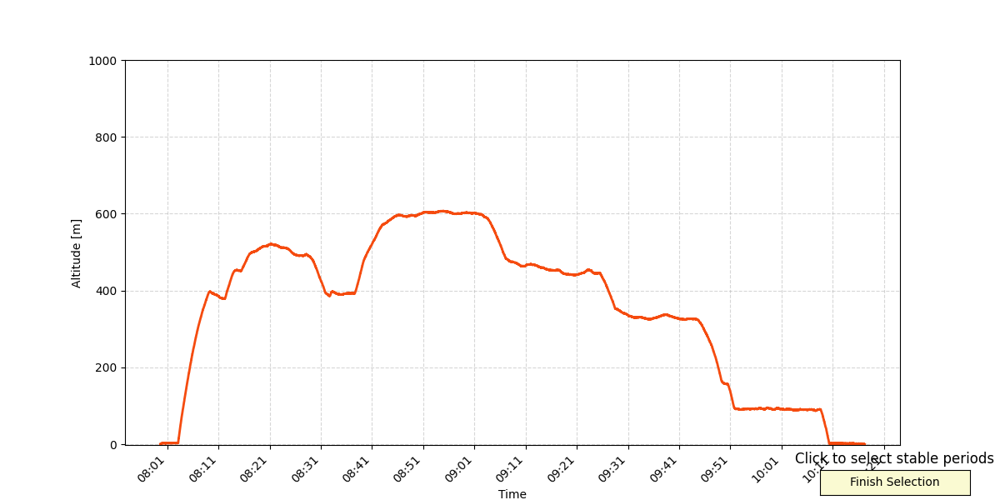

None


In [52]:
%matplotlib widget
plt.close('all')

# Plot setup
fig, ax = plt.subplots(figsize=(12, 6))
palette = ["#F54B0F", "#415067"]

ax.plot(df_level1_5.index, df_level1_5["Altitude"], color=palette[0], linewidth=2)
ax.grid(True, ls="--", alpha=0.5)
ax.set_ylim(-2, 1000)
ax.set_ylabel("Altitude [m]")
ax.set_xlabel("Time")
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

# Interaction logic
selected_points = []
stable_periods = []
span_artists = []

def onclick(event):
    if event.inaxes != ax:
        return

    # Skip if zoom or pan mode is active
    if plt.get_current_fig_manager().toolbar.mode != '':
        return
        
    click_time = mdates.num2date(event.xdata)
    selected_points.append(click_time)

    ax.plot(event.xdata, event.ydata, 'o', color=palette[1], markersize=8)
    fig.canvas.draw()

    if len(selected_points) == 2:
        start, end = sorted(selected_points)
        stable_periods.append((start, end))
        span = ax.axvspan(start, end, color=palette[1], alpha=0.2)
        span_artists.append(span)
        selected_points.clear()
        fig.canvas.draw()
results_df = None

def finish_selection(event):
    global results_df

    if stable_periods:
        results_df = pd.DataFrame(stable_periods, columns=['Start_Time', 'End_Time'])
        results_df['Duration'] = results_df['End_Time'] - results_df['Start_Time']
        
        # Optional formatting
        results_df['Start_Time'] = results_df['Start_Time'].dt.strftime('%Y-%m-%d %H:%M:%S')
        results_df['End_Time'] = results_df['End_Time'].dt.strftime('%Y-%m-%d %H:%M:%S')

        print("\nSelected Stable Periods:")
        print(results_df.to_string(index=False))

        # Copy to clipboard
        results_df.to_clipboard(index=False)
        print("\nResults copied to clipboard!")
    else:
        print("No stable periods selected")

# Add button
ax_button = plt.axes([0.82, 0.01, 0.15, 0.05])
btn = Button(ax_button, 'Finish Selection', color='lightgoldenrodyellow')
btn.on_clicked(finish_selection)

# Hook up click handler
fig.canvas.mpl_connect('button_press_event', onclick)

plt.title("Click to select stable periods")
plt.show()

print(results_df)

In [49]:
results_df

,Start_Time,End_Time,Duration
0,2025-01-27 18:19:00,2025-01-27 18:28:31,0 days 00:09:30.879976
1,2025-01-27 18:34:00,2025-01-27 18:37:17,0 days 00:03:17.887564
2,2025-01-27 18:55:47,2025-01-27 19:06:56,0 days 00:11:09.230400
3,2025-01-27 19:12:35,2025-01-27 19:15:50,0 days 00:03:15.915028
4,2025-01-27 19:18:55,2025-01-27 19:28:02,0 days 00:09:06.033541
5,2025-01-27 19:31:31,2025-01-27 19:37:53,0 days 00:06:22.045165


In [71]:
""" CHANGE NAME OF OUTPUT FILE """

#results_df.to_csv(r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1.5\level1.5_2025-01-27_A_hovering.csv', index=False)

results_df = pd.read_csv(r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1.5\level1.5_2025-02-12_A_hovering.csv')
results_df

,Start_Time,End_Time,Duration
0,2025-02-12 07:59:59,2025-02-12 08:03:07,0 days 00:03:08.026422
1,2025-02-12 08:31:52,2025-02-12 08:37:38,0 days 00:05:46.121992
2,2025-02-12 08:45:32,2025-02-12 09:02:30,0 days 00:16:57.074067
3,2025-02-12 09:31:07,2025-02-12 09:44:33,0 days 00:13:26.427564
4,2025-02-12 09:15:27,2025-02-12 09:25:32,0 days 00:10:04.765215
5,2025-02-12 09:08:01,2025-02-12 09:13:21,0 days 00:05:20.015319
6,2025-02-12 09:51:53,2025-02-12 10:08:38,0 days 00:16:45.099624
7,2025-02-12 10:10:17,2025-02-12 10:17:15,0 days 00:08:44
8,2025-02-12 08:25:41,2025-02-12 08:28:44,0 days 00:03:02.034126
9,2025-02-12 08:19:08,2025-02-12 08:24:12,0 days 00:05:03.238952


In [72]:
# Add 'flag_hovering' column to 'df_level1_5'

results_df['Start_Time'] = pd.to_datetime(results_df['Start_Time'])
results_df['End_Time'] = pd.to_datetime(results_df['End_Time'])

df_level1_5['flag_hovering'] = 0
for _, row in results_df.iterrows():
    mask = (df_level1_5.index >= row['Start_Time']) & (df_level1_5.index <= row['End_Time'])
    df_level1_5.loc[mask, 'flag_hovering'] = 1

if 'flag_pollution' in df_level1_5.columns:
    cols = list(df_level1_5.columns)
    idx = cols.index('flag_pollution') + 1
    col = df_level1_5.pop('flag_hovering')
    df_level1_5.insert(idx, 'flag_hovering', col)

df_level1_5

,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,mSEMS_total_N,...,tapir_Thead1,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,flag_pollution,flag_hovering,flight_nr,campaign
datetime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:59:37,0.00,-70.662,-8.286,989.29,-1.00,93.19,NaN,NaN,32.25,229.89,...,2.7,1.9,2.1,4.1,TB,5.5,NaN,0,59,ORACLES
2025-02-12 07:59:38,0.00,-70.662,-8.286,989.29,-1.01,93.18,NaN,NaN,33.57,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,59,ORACLES
2025-02-12 07:59:39,0.31,-70.662,-8.286,989.25,-0.98,93.20,NaN,NaN,38.83,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,59,ORACLES
2025-02-12 07:59:40,0.56,-70.662,-8.286,989.22,-0.98,93.23,NaN,NaN,30.27,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,59,ORACLES
2025-02-12 07:59:41,0.39,-70.662,-8.286,989.24,-1.00,93.25,NaN,NaN,29.62,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,59,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-12 10:17:11,0.24,-70.662,-8.286,989.15,-1.64,91.46,NaN,NaN,13.19,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,59,ORACLES
2025-02-12 10:17:12,0.40,-70.662,-8.286,989.13,-1.62,91.49,NaN,NaN,12.53,NaN,...,5.9,4.9,5.3,7.4,TB,19.8,NaN,1,59,ORACLES
2025-02-12 10:17:13,0.00,-70.662,-8.286,989.18,-1.58,91.50,NaN,NaN,12.86,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,59,ORACLES


In [73]:
# Check flag
start_time = "2025-02-12 10:08:30"
end_time = "2025-02-12 10:08:40"

filtered_hovering = df_level1_5.loc[(df_level1_5.index >= start_time) & (df_level1_5.index <= end_time), 'flag_hovering']
print(filtered_hovering)

datetime
2025-02-12 10:08:30    1
2025-02-12 10:08:31    1
2025-02-12 10:08:32    1
2025-02-12 10:08:33    1
2025-02-12 10:08:34    1
2025-02-12 10:08:35    1
2025-02-12 10:08:36    1
2025-02-12 10:08:37    1
2025-02-12 10:08:38    1
2025-02-12 10:08:39    0
2025-02-12 10:08:40    0
Name: flag_hovering, dtype: int64


### Cloud flag

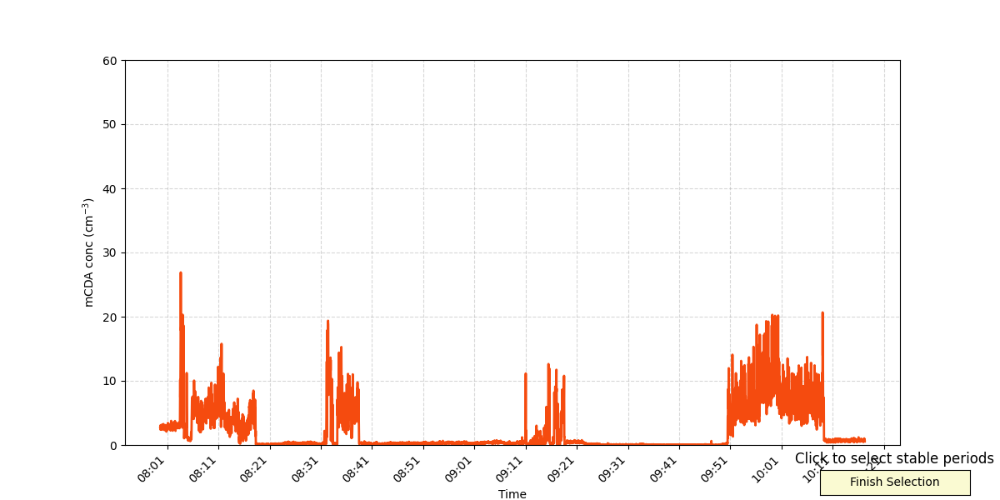

None


In [57]:
%matplotlib widget
plt.close('all')

# Plot setup
fig, ax = plt.subplots(figsize=(12, 6))
palette = ["#F54B0F", "#415067"]

ax.plot(df_level1_5.index, df_level1_5["mCDA_total_N"], color=palette[0], linewidth=2)
ax.grid(True, ls="--", alpha=0.5)
ax.set_ylim(0, 60)
ax.set_ylabel("mCDA conc (cm$^{-3}$)")
ax.set_xlabel("Time")
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

# Interaction logic
selected_points = []
stable_periods = []
span_artists = []

def onclick(event):
    if event.inaxes != ax:
        return

    # Skip if zoom or pan mode is active
    if plt.get_current_fig_manager().toolbar.mode != '':
        return
        
    click_time = mdates.num2date(event.xdata)
    selected_points.append(click_time)

    ax.plot(event.xdata, event.ydata, 'o', color=palette[1], markersize=8)
    fig.canvas.draw()

    if len(selected_points) == 2:
        start, end = sorted(selected_points)
        stable_periods.append((start, end))
        span = ax.axvspan(start, end, color=palette[1], alpha=0.2)
        span_artists.append(span)
        selected_points.clear()
        fig.canvas.draw()
results_df = None

def finish_selection(event):
    global results_df

    if stable_periods:
        results_df = pd.DataFrame(stable_periods, columns=['Start_Time', 'End_Time'])
        results_df['Duration'] = results_df['End_Time'] - results_df['Start_Time']
        
        # Optional formatting
        results_df['Start_Time'] = results_df['Start_Time'].dt.strftime('%Y-%m-%d %H:%M:%S')
        results_df['End_Time'] = results_df['End_Time'].dt.strftime('%Y-%m-%d %H:%M:%S')

        print("\nSelected Stable Periods:")
        print(results_df.to_string(index=False))

        # Copy to clipboard
        results_df.to_clipboard(index=False)
        print("\nResults copied to clipboard!")
    else:
        print("No stable periods selected")

# Add button
ax_button = plt.axes([0.82, 0.01, 0.15, 0.05])
btn = Button(ax_button, 'Finish Selection', color='lightgoldenrodyellow')
btn.on_clicked(finish_selection)

# Hook up click handler
fig.canvas.mpl_connect('button_press_event', onclick)

plt.title("Click to select stable periods")
plt.show()

print(results_df)

In [67]:
results_df

,Start_Time,End_Time,Duration
0,2025-02-11 14:41:00,2025-02-11 14:44:00,0 days 00:02:59.846285
1,2025-02-11 14:50:00,2025-02-11 15:00:01,0 days 00:10:01.052161


In [74]:
""" CHANGE NAME OF OUTPUT FILE """

#results_df.to_csv(r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1.5\level1.5_2025-02-11_A_cloud.csv', index=False)

results_df = pd.read_csv(r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level1.5\level1.5_2025-02-12_A_cloud.csv')
results_df

,Start_Time,End_Time,Duration
0,2025-02-12 07:59:37,2025-02-12 08:18:17,0 days 00:22:33.182694
1,2025-02-12 08:31:38,2025-02-12 08:31:45,0 days 00:00:07.003000
2,2025-02-12 08:32:03,2025-02-12 08:33:18,0 days 00:01:15.093715
3,2025-02-12 08:34:11,2025-02-12 08:38:27,0 days 00:04:15.997931
4,2025-02-12 09:10:55,2025-02-12 09:11:09,0 days 00:00:14.017595
5,2025-02-12 09:12:18,2025-02-12 09:15:40,0 days 00:03:21.972874
6,2025-02-12 09:16:19,2025-02-12 09:17:34,0 days 00:01:14.400213
7,2025-02-12 09:17:43,2025-02-12 09:18:36,0 days 00:00:52.947777
8,2025-02-12 09:50:27,2025-02-12 10:09:17,0 days 00:18:49.997958


In [75]:
# Add 'flag_cloud' column to 'df_level1_5'

results_df['Start_Time'] = pd.to_datetime(results_df['Start_Time'])
results_df['End_Time'] = pd.to_datetime(results_df['End_Time'])

df_level1_5['flag_cloud'] = 0
for _, row in results_df.iterrows():
    mask = (df_level1_5.index >= row['Start_Time']) & (df_level1_5.index <= row['End_Time'])
    df_level1_5.loc[mask, 'flag_cloud'] = 1

if 'flag_hovering' in df_level1_5.columns:
    cols = list(df_level1_5.columns)
    idx = cols.index('flag_hovering') + 1
    col = df_level1_5.pop('flag_cloud')
    df_level1_5.insert(idx, 'flag_cloud', col)

df_level1_5

,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,mSEMS_total_N,...,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,flag_pollution,flag_hovering,flag_cloud,flight_nr,campaign
datetime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:59:37,0.00,-70.662,-8.286,989.29,-1.00,93.19,NaN,NaN,32.25,229.89,...,1.9,2.1,4.1,TB,5.5,NaN,0,1,59,ORACLES
2025-02-12 07:59:38,0.00,-70.662,-8.286,989.29,-1.01,93.18,NaN,NaN,33.57,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59,ORACLES
2025-02-12 07:59:39,0.31,-70.662,-8.286,989.25,-0.98,93.20,NaN,NaN,38.83,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59,ORACLES
2025-02-12 07:59:40,0.56,-70.662,-8.286,989.22,-0.98,93.23,NaN,NaN,30.27,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59,ORACLES
2025-02-12 07:59:41,0.39,-70.662,-8.286,989.24,-1.00,93.25,NaN,NaN,29.62,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-12 10:17:11,0.24,-70.662,-8.286,989.15,-1.64,91.46,NaN,NaN,13.19,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,59,ORACLES
2025-02-12 10:17:12,0.40,-70.662,-8.286,989.13,-1.62,91.49,NaN,NaN,12.53,NaN,...,4.9,5.3,7.4,TB,19.8,NaN,1,0,59,ORACLES
2025-02-12 10:17:13,0.00,-70.662,-8.286,989.18,-1.58,91.50,NaN,NaN,12.86,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,59,ORACLES


In [52]:
# If no clouds
df_level1_5.insert(loc=df_level1_5.columns.get_loc('flight_nr'), column='flag_cloud', value=0)   # Insert 'flag_cloud' column filled with 0s before 'flight_nr'
df_level1_5

,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,mSEMS_total_N,...,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,flag_pollution,flag_hovering,flag_cloud,flight_nr,campaign
datetime,,,,,,,,,,,,,,,,,,,,,
2025-01-27 18:18:43,0.00,NaN,NaN,987.09,8.40,47.2,NaN,NaN,1.27,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,45,ORACLES
2025-01-27 18:18:44,-0.10,NaN,NaN,987.06,8.40,47.2,NaN,NaN,3.18,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,45,ORACLES
2025-01-27 18:18:45,0.07,NaN,NaN,987.04,8.40,47.2,NaN,NaN,1.59,NaN,...,3.3,4.3,4.3,TB,7.9,NaN,0,0,45,ORACLES
2025-01-27 18:18:46,0.49,-70.6621,-8.286,986.99,8.40,47.2,1.1,154.0,2.54,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,45,ORACLES
2025-01-27 18:18:47,0.83,-70.6621,-8.286,986.95,8.40,47.2,1.1,158.0,3.18,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,45,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-27 19:37:50,0.99,-70.6621,-8.286,987.43,-1.88,75.8,NaN,NaN,0.66,NaN,...,7.8,9.5,8.7,TB,22.1,NaN,1,0,45,ORACLES
2025-01-27 19:37:51,0.75,-70.6621,-8.286,987.46,-1.88,75.8,NaN,NaN,0.66,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,45,ORACLES
2025-01-27 19:37:52,0.51,-70.6621,-8.286,987.49,-1.88,75.8,NaN,NaN,0.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,45,ORACLES


In [60]:
start_time = "2025-02-12 09:11:05"
end_time = "2025-02-12 09:11:10"

filtered_cloud = df_level1_5.loc[(df_level1_5.index >= start_time) & (df_level1_5.index <= end_time), 'flag_cloud']
print(filtered_cloud)

datetime
2025-02-12 09:11:05    1
2025-02-12 09:11:06    1
2025-02-12 09:11:07    1
2025-02-12 09:11:08    1
2025-02-12 09:11:09    1
2025-02-12 09:11:10    0
Name: flag_cloud, dtype: int64


## Data quicklooks

In [61]:
#df_level1_5 = pd.read_csv(r"C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\level2_2025-01-28_A.csv")
#df_level1_5["datetime"] = pd.to_datetime(df_level1_5["datetime"])
#df_level1_5.set_index("datetime", inplace=True)
df_level1_5

,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,mSEMS_total_N,...,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,flag_pollution,flag_hovering,flag_cloud,flight_nr,campaign
datetime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:59:37,0.00,-70.662,-8.286,989.29,-1.00,93.19,NaN,NaN,32.25,229.89,...,1.9,2.1,4.1,TB,5.5,NaN,0,1,59,ORACLES
2025-02-12 07:59:38,0.00,-70.662,-8.286,989.29,-1.01,93.18,NaN,NaN,33.57,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59,ORACLES
2025-02-12 07:59:39,0.31,-70.662,-8.286,989.25,-0.98,93.20,NaN,NaN,38.83,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59,ORACLES
2025-02-12 07:59:40,0.56,-70.662,-8.286,989.22,-0.98,93.23,NaN,NaN,30.27,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59,ORACLES
2025-02-12 07:59:41,0.39,-70.662,-8.286,989.24,-1.00,93.25,NaN,NaN,29.62,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-12 10:17:11,0.24,-70.662,-8.286,989.15,-1.64,91.46,NaN,NaN,13.19,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,59,ORACLES
2025-02-12 10:17:12,0.40,-70.662,-8.286,989.13,-1.62,91.49,NaN,NaN,12.53,NaN,...,4.9,5.3,7.4,TB,19.8,NaN,1,0,59,ORACLES
2025-02-12 10:17:13,0.00,-70.662,-8.286,989.18,-1.58,91.50,NaN,NaN,12.86,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,59,ORACLES


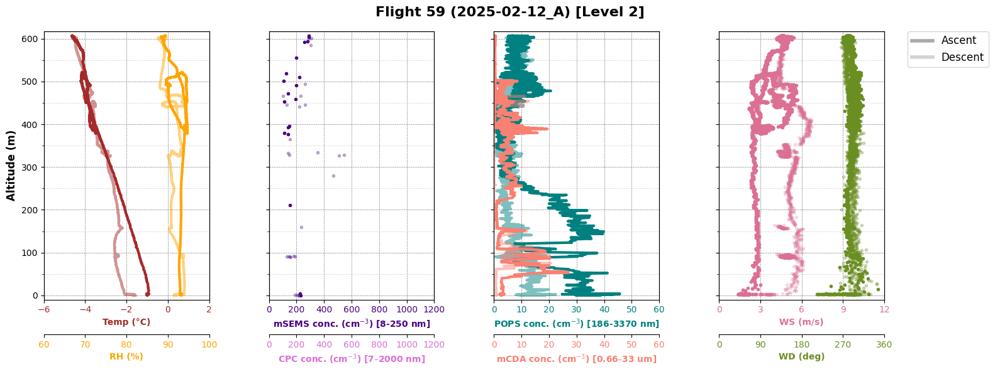

Saving figure to: C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\Level2_2025-02-12_A_Flight_59.png


In [76]:
from helikite.processing.post.level1 import flight_profiles_2

# Limits for x-axis (T, RH, mSEMS, CPC, POPS, mCDA, WS, WD)
custom_xlim = {
    'ax1': (-6, 2),
    'ax2': (60, 100),
    'ax3': (0, 1200), 
    'ax4': (0, 1200),
    'ax5': (0, 60),
    'ax6': (0, 60),
    'ax7': (0, 12)
}

custom_xticks = {
    'ax1': np.arange(-6, 3, 2),
    'ax2': np.arange(60, 101, 10), 
    'ax3': np.arange(0, 1201, 200),
    'ax4': np.arange(0, 1201, 200),
    'ax5': np.arange(0, 61, 10),
    'ax6': np.arange(0, 61, 10),
    'ax7': np.arange(0, 13, 3)
}

# Plot title
custom_title = f'Flight {metadata.flight} ({metadata.flight_date}_A) [Level 2]'
#custom_title = f'Flight 48 (2025-02-03_A) [Level 2]'

fig = flight_profiles_2(df_level1_5, metadata, xlims=custom_xlim, xticks=custom_xticks, fig_title=custom_title)

# Save the figure after plotting
folder_path = r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2'
filename = f'Level2_{metadata.flight_date}_A_Flight_{metadata.flight}.png'
#filename = f'Level2_2025-02-03_A_Flight_48.png'
save_path = f'{folder_path}\\{filename}'
print("Saving figure to:", save_path)
fig.savefig(save_path, dpi=300, bbox_inches='tight')

In [19]:
import numpy as np

bin_diameter_averages = np.array([
    8.209426, 8.652978, 9.120773, 9.614176, 10.134633, 10.683676, 11.262924,
    11.874097, 12.519017, 13.199618, 13.917952, 14.676198, 15.476672,
    16.319869, 17.212476, 18.155273, 19.151085, 20.203080, 21.314636,
    22.489353, 23.731074, 25.043907, 26.432241, 27.900779, 29.454554,
    31.098968, 32.839819, 34.683337, 36.636229, 38.705716, 40.899590,
    43.226267, 45.694846, 48.315185, 51.097974, 54.054825, 57.198371,
    60.542379, 64.101873, 67.893280, 71.934588, 76.245533, 80.847801,
    85.765265, 91.024253, 96.653846, 102.686223, 109.157047, 116.105907,
    123.576809, 131.618741, 140.286300, 149.640401, 159.749066, 170.688305,
    182.543091, 195.408432, 209.392962, 224.611976, 241.211823
])


Saving figure to: C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\Level2_2025-02-12_A_Flight_59_SizeDistr.png


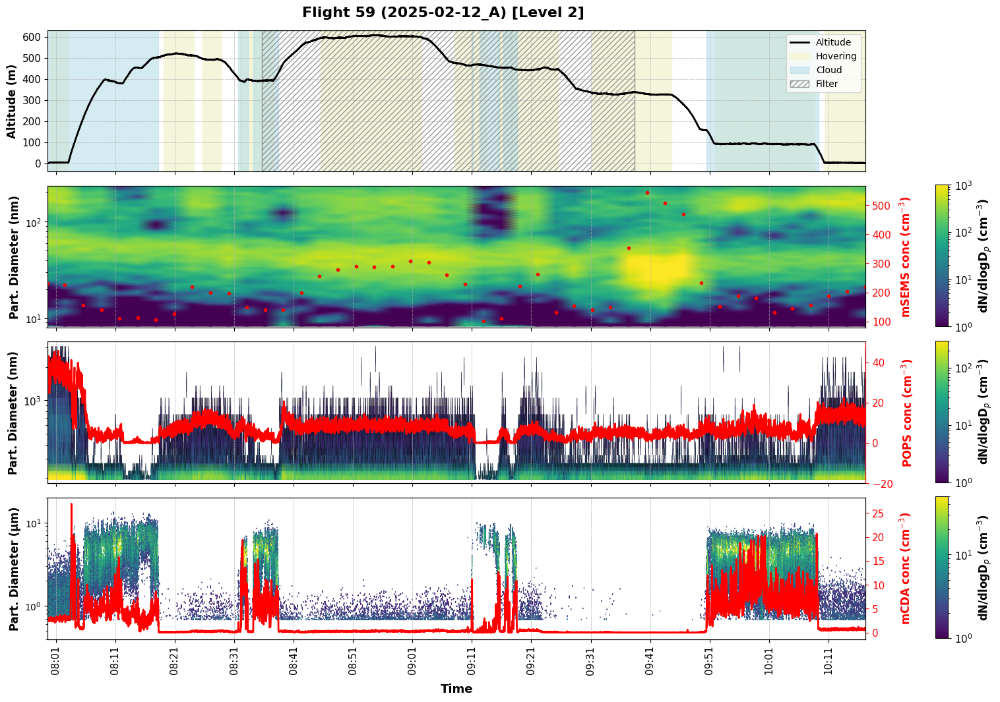

In [77]:
# TEMPORAL PLOT OF FLIGHT with POPS and mSEMS HEAT MAPS

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
from matplotlib.lines import Line2D
import matplotlib.ticker as ticker
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.colors as mcols
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

%matplotlib inline
plt.close('all')

# Create figure with 3 subplots, sharing the same x-axis
fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True, gridspec_kw={'height_ratios': [1, 1, 1, 1]})
plt.subplots_adjust(hspace=0.1)

""" SET THE TITLE OF THE PLOT (FLIGHT N° with DATE_X) """
# 'i' will automatically be replaced by the set flight number
# '_X' has to be changed manually in function of the flight index of the day (A, B, ...)
fig.suptitle(f'Flight {metadata.flight} ({metadata.flight_date}_A) [Level 2]', fontsize=16, fontweight='bold', y=0.91)

### SUBPLOT 1: Altitude vs. Time
ax1 = axes[0]
ax1.plot(df_level1_5.index, df_level1_5['Altitude'], color='black', linewidth=2, label='Altitude')

ax1.set_ylabel('Altitude (m)', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y', labelsize=11)
ax1.grid(True, linestyle='--', linewidth=0.5)
ax1.tick_params(axis='x', labelbottom=False)
ax1.set_ylim(-40, df_level1_5['Altitude'].max() * 1.04)

# Shade areas for flag_pollution == 1
pollution_times = df_level1_5[df_level1_5['flag_pollution'] == 1].index
if not pollution_times.empty:
    start = pollution_times[0]
    for i in range(1, len(pollution_times)):
        if (pollution_times[i] - pollution_times[i - 1]) > pd.Timedelta(seconds=1):
            ax1.axvspan(start, pollution_times[i - 1], color='lightcoral', alpha=0.8, label='Pollution')
            start = pollution_times[i]
    ax1.axvspan(start, pollution_times[-1], color='lightcoral', alpha=0.8, label='Pollution')

# Shade areas for flag_hovering == 1
hovering_times = df_level1_5[df_level1_5['flag_hovering'] == 1].index
if not hovering_times.empty:
    start = hovering_times[0]
    for i in range(1, len(hovering_times)):
        if (hovering_times[i] - hovering_times[i - 1]) > pd.Timedelta(seconds=1):
            ax1.axvspan(start, hovering_times[i - 1], color='beige', alpha=1, label='Hovering')
            start = hovering_times[i]
    ax1.axvspan(start, hovering_times[-1], color='beige', alpha=1, label='Hovering')

# Shade areas for flag_cloud == 1
cloud_times = df_level1_5[df_level1_5['flag_cloud'] == 1].index
if not cloud_times.empty:
    start = cloud_times[0]
    for i in range(1, len(cloud_times)):
        if (cloud_times[i] - cloud_times[i - 1]) > pd.Timedelta(seconds=1):
            ax1.axvspan(start, cloud_times[i - 1], color='lightblue', alpha=0.5, label='Cloud')
            start = cloud_times[i]
    ax1.axvspan(start, cloud_times[-1], color='lightblue', alpha=0.5, label='Cloud')

# Shade areas for Filter_position !== 1.0
filter_mask = df_level1_5['Filter_position'] != 1.0
filter_times = df_level1_5[filter_mask].index

if not filter_times.empty:
    start = filter_times[0]
    for i in range(1, len(filter_times)):
        if (filter_times[i] - filter_times[i - 1]) > pd.Timedelta(seconds=1):
            ax1.axvspan(start, filter_times[i - 1], facecolor='none', edgecolor='gray', hatch='////', alpha=0.8, label='Filter')
            start = filter_times[i]
    ax1.axvspan(start, filter_times[-1], facecolor='none', edgecolor='gray', hatch='////', alpha=0.8, label='Filter')


# Optional: Clean legend (avoid duplicates)
handles, labels = ax1.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax1.legend(by_label.values(), by_label.keys(), fontsize=10)


### SUBPLOT 2: mSEMS heatmmap & total concentration
ax2 = axes[1]

# Get diameter bin averages
#start_dia = 'msems_inverted_Bin_Dia1'
#end_dia = 'msems_inverted_Bin_Dia60'
#bin_diameter_averages = df_level1_5.loc[:, start_dia:end_dia].mean()

# Get concentration data
start_conc = 'mSEMS_Bin_Conc1'
end_conc = 'mSEMS_Bin_Conc60'
counts = df_level1_5.loc[:, start_conc:end_conc]
counts.index = df_level1_5.index
counts = counts.astype(float).dropna(how='any')
counts = counts.clip(lower=1)

# Create 2D grid
xx, yy = np.meshgrid(counts.index.values, bin_diameter_averages)

# Contour plot
norm = mcolors.LogNorm(vmin=1, vmax=1000)
mesh = ax2.pcolormesh(xx, yy, counts.values.T, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax2)
cax = inset_axes(ax2, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax2.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=13, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Add Secondary Y-axis for Total Concentration
ax2_right = ax2.twinx()
total_conc = df_level1_5['mSEMS_total_N']
ax2_right.scatter(df_level1_5.index, total_conc, color='red', marker='.')
ax2_right.set_ylabel('mSEMS conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=8)
ax2_right.tick_params(axis='y', labelsize=11, colors='red')
#ax2_right.set_ylim(0, total_conc.max() * 1.1)

# Labels and limits
ax2.set_yscale('log')
ax2.set_ylabel('Part. Diameter (nm)', fontsize=12, fontweight='bold')
ax2.set_ylim(8, 236)
ax2.grid(True, linestyle='--', alpha=0.6, axis='x')


### SUBPLOT 3: POPS heatmap & total concentration 
ax3 = axes[2]

# Define pops_dlogDp variable from Hendix documentation
pops_dia = [
    149.0801282, 162.7094017, 178.3613191, 195.2873341, 
    212.890625, 234.121875, 272.2136986, 322.6106374, 
    422.0817873, 561.8906456, 748.8896681, 1054.138693,
    1358.502538, 1802.347716, 2440.99162, 3061.590212
]

pops_dlogDp = [
    0.036454582, 0.039402553, 0.040330922, 0.038498955,
    0.036550107, 0.045593506, 0.082615487, 0.066315868,
    0.15575785, 0.100807113, 0.142865049, 0.152476328,
    0.077693935, 0.157186601, 0.113075192, 0.086705426
]

# Define the range of columns for POPS concentration
start_conc = 'POPS_b3'
end_conc = 'POPS_b15'

# Get POPS concentration data
pops_counts = df_level1_5.loc[:, start_conc:end_conc]
pops_counts = pops_counts.set_index(df_level1_5.index).astype(float)

# Create 2D grid
#pops_dia = np.logspace(np.log10(180), np.log10(3370), num=pops_counts.shape[1])
bin_diameters = pops_dia[3:16]
xx, yy = np.meshgrid(pops_counts.index.values, bin_diameters)

# Heatmap
norm = mcolors.LogNorm(vmin=1, vmax=300)
mesh = ax3.pcolormesh(xx, yy, pops_counts.values.T, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax3)
cax = inset_axes(ax3, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax3.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=12, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Labels and grid
ax3.set_yscale('log')
ax3.set_ylabel('Part. Diameter (nm)', fontsize=12, fontweight='bold')
ax3.tick_params(axis='y', labelsize=11)
ax3.grid(True, linestyle='--', linewidth=0.5, axis='x')
ax3.grid(False, axis='y')
ax3.set_ylim(180, 3370)

# Add Secondary Y-axis for Total POPS Concentration
ax3_right = ax3.twinx()
ax3_right.plot(df_level1_5.index, df_level1_5['POPS_total_N'], color='red', linewidth=2, label='Total POPS Conc.')
ax3_right.set_ylabel('POPS conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=8)
ax3_right.tick_params(axis='y', labelsize=11, colors='red')
ax3_right.spines['right'].set_color('red')
ax3_right.set_ylim(-20, df_level1_5['POPS_total_N'].max() * 1.1)


### Subplot 4: mCDA heatmap & total concentration 
ax4 = axes[3]

# Midpoint diameters
Midpoint_diameter_list = np.array([
    0.244381, 0.246646, 0.248908, 0.251144, 0.253398, 0.255593, 0.257846, 0.260141, 0.262561, 0.265062, 0.267712, 0.270370, 0.273159, 0.275904, 0.278724, 0.281554, 0.284585, 0.287661, 0.290892, 0.294127, 0.297512, 0.300813, 0.304101, 0.307439,
    0.310919, 0.314493, 0.318336, 0.322265, 0.326283, 0.330307, 0.334409, 0.338478, 0.342743, 0.347102, 0.351648, 0.356225, 0.360972, 0.365856, 0.371028, 0.376344, 0.382058, 0.387995, 0.394223, 0.400632, 0.407341, 0.414345, 0.421740, 0.429371,
    0.437556, 0.446036, 0.454738, 0.463515, 0.472572, 0.481728, 0.491201, 0.500739, 0.510645, 0.520720, 0.530938, 0.541128, 0.551563, 0.562058, 0.572951, 0.583736, 0.594907, 0.606101, 0.617542, 0.628738, 0.640375, 0.652197, 0.664789, 0.677657,
    0.691517, 0.705944, 0.721263, 0.736906, 0.753552, 0.770735, 0.789397, 0.808690, 0.829510, 0.851216, 0.874296, 0.897757, 0.922457, 0.948074, 0.975372, 1.003264, 1.033206, 1.064365, 1.097090, 1.130405, 1.165455, 1.201346, 1.239589, 1.278023,
    1.318937, 1.360743, 1.403723, 1.446000, 1.489565, 1.532676, 1.577436, 1.621533, 1.667088, 1.712520, 1.758571, 1.802912, 1.847836, 1.891948, 1.937088, 1.981087, 2.027604, 2.074306, 2.121821, 2.168489, 2.216644, 2.263724, 2.312591, 2.361099,
    2.412220, 2.464198, 2.518098, 2.571786, 2.628213, 2.685162, 2.745035, 2.805450, 2.869842, 2.935997, 3.005175, 3.074905, 3.148598, 3.224051, 3.305016, 3.387588, 3.476382, 3.568195, 3.664863, 3.761628, 3.863183, 3.965651, 4.072830, 4.179050,
    4.289743, 4.400463, 4.512449, 4.621025, 4.731530, 4.839920, 4.949855, 5.057777, 5.169742, 5.281416, 5.395039, 5.506828, 5.621488, 5.734391, 5.849553, 5.962881, 6.081516, 6.200801, 6.322133, 6.441786, 6.565130, 6.686935, 6.813017, 6.938981,
    7.071558, 7.205968, 7.345185, 7.483423, 7.628105, 7.774385, 7.926945, 8.080500, 8.247832, 8.419585, 8.598929, 8.780634, 8.973158, 9.167022, 9.372760, 9.582145, 9.808045, 10.041607, 10.287848, 10.537226, 10.801172, 11.068405, 11.345135,
    11.621413, 11.910639, 12.200227, 12.492929, 12.780176, 13.072476, 13.359067, 13.651163, 13.937329, 14.232032, 14.523919, 14.819204, 15.106612, 15.402110, 15.695489, 15.998035, 16.297519, 16.610927, 16.926800, 17.250511,
    17.570901, 17.904338, 18.239874, 18.588605, 18.938763, 19.311505, 19.693678, 20.093464, 20.498208, 20.927653, 21.366609, 21.827923, 22.297936, 22.802929, 23.325426, 23.872344, 24.428708, 25.016547, 25.616663, 26.249815,
    26.888493, 27.563838, 28.246317, 28.944507, 29.626186, 30.323440, 31.005915, 31.691752, 32.353900, 33.030123, 33.692286, 34.350532, 34.984611, 35.626553, 36.250913, 36.878655, 37.489663, 38.121550, 38.748073, 39.384594, 
    40.008540, 40.654627, 41.292757, 41.937789, 42.578436
])

# Prepare data
counts = df_level1_5.loc[:, 'mCDA_dataB1':'mCDA_dataB256']
counts = counts.set_index(df_level1_5.index)
counts = counts.astype(float)
counts[counts == 0] = np.nan

bin_diameters = Midpoint_diameter_list
xx, yy = np.meshgrid(counts.index.values, bin_diameters)
Z = counts.values.T

# Plot heatmap
norm = mcolors.LogNorm(vmin=1, vmax=50)
mesh = ax4.pcolormesh(xx, yy, Z, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax4)
cax = inset_axes(ax4, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax4.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=12, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Total concentration
ax4_right = ax4.twinx()
total_conc = df_level1_5['mCDA_total_N']
ax4_right.plot(df_level1_5.index, total_conc, color='red', linewidth=2)
ax4_right.set_ylabel('mCDA conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=15)
ax4_right.tick_params(axis='y', labelsize=11, colors='red')
#ax4_right.set_ylim(0, total_conc.max() * 2)
#ax4_right.set_xlim(ax4.get_xlim())

# Axis styling
ax4.set_yscale('log')
ax4.set_ylabel('Part. Diameter (μm)', fontsize=12, fontweight='bold')
ax4.set_ylim(0.4, 20)
ax4.grid(True, linestyle='--', linewidth=0.5, axis='x')
ax4.grid(False, axis='y')

# Legend for secondary y-axis
#ax2_right.legend(['mSEMS total conc.'], loc='upper right', fontsize=11, frameon=False)
#ax3_right.legend(['POPS total conc.'], loc='upper right', fontsize=11, frameon=False)
#ax4_right.legend(['mCDA total conc.'], loc='upper right', fontsize=11, frameon=False)

# X-axis formatting for all subplots
ax4.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax4.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax4.set_xlabel('Time', fontsize=13, fontweight='bold', labelpad=10)
ax4.tick_params(axis='x', rotation=90, labelsize=11)

""" SET TIME RANGE (DATE + TIME) """
#ax3.set_xlim(pd.Timestamp('2025-02-12T07:55:00'), pd.Timestamp('2025-02-12T10:20:00'))

""" SAVE PLOT """
folder_path = r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2'
filename = f'Level2_{metadata.flight_date}_A_Flight_{metadata.flight}_SizeDistr.png'
save_path = f'{folder_path}\\{filename}'
print("Saving figure to:", save_path)
fig.savefig(save_path, dpi=300, bbox_inches='tight')

#plt.tight_layout()
plt.show()

## Final file
### 1 second resolution
**Save final processed file.**

In [78]:
""" CHANGE NAME OF OUTPUT FILE """

df_level1_5.to_csv(r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\level2_2025-02-12_A.csv', index=True)
print(f"Saved Level2 file of Flight {metadata.flight}.")

Saved Level2 file of Flight 59.


# 10 second resolution
**Averaging over 10 seconds**

In [79]:
""" CHANGE NAME OF INPUT FILE """

df_level2 = pd.read_csv(r"C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\level2_2025-02-12_A.csv")
df_level2.set_index("datetime", inplace=True)
df_level2

# Remove text columns
columns_to_remove = ['tapir_GL', 'tapir_Le', 'tapir_Lm', 'tapir_TP', 'tapir_TH', 'tapir_TB', 'campaign']
df_level2 = df_level2.drop(columns=columns_to_remove, errors='ignore')
df_level2

,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,mSEMS_total_N,...,tapir_Tproc4,tapir_Thead1,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_Tbox,flag_pollution,flag_hovering,flag_cloud,flight_nr
datetime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:59:37,0.00,-70.662,-8.286,989.29,-1.00,93.19,NaN,NaN,32.25,229.89,...,0.2,2.7,1.9,2.1,4.1,5.5,NaN,0,1,59
2025-02-12 07:59:38,0.00,-70.662,-8.286,989.29,-1.01,93.18,NaN,NaN,33.57,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59
2025-02-12 07:59:39,0.31,-70.662,-8.286,989.25,-0.98,93.20,NaN,NaN,38.83,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59
2025-02-12 07:59:40,0.56,-70.662,-8.286,989.22,-0.98,93.23,NaN,NaN,30.27,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59
2025-02-12 07:59:41,0.39,-70.662,-8.286,989.24,-1.00,93.25,NaN,NaN,29.62,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-12 10:17:11,0.24,-70.662,-8.286,989.15,-1.64,91.46,NaN,NaN,13.19,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,59
2025-02-12 10:17:12,0.40,-70.662,-8.286,989.13,-1.62,91.49,NaN,NaN,12.53,NaN,...,10.6,5.9,4.9,5.3,7.4,19.8,NaN,1,0,59
2025-02-12 10:17:13,0.00,-70.662,-8.286,989.18,-1.58,91.50,NaN,NaN,12.86,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,59


In [80]:
# AVERAGING
from scipy.stats import circmean

df_level2.index = pd.to_datetime(df_level2.index)

df_level2_average = df_level2.resample('10s').mean()                                                                        # Calculate the regular 10-second average       
df_level2_average['WindDir'] = df_level2['WindDir'].resample('10s').apply(lambda x: circmean(x.dropna(), high=360, low=0))  # Correctly average wind direction using circular mean

flag_cols = ['flag_hovering', 'flag_cloud']
df_level2_average[flag_cols] = (df_level2_average[flag_cols] >= 0.5).astype(int)

# Round
df_level2_average['Lat'] = df_level2_average['Lat'].round(4)
df_level2_average['Long'] = df_level2_average['Long'].round(4)
df_level2_average['flight_nr'] = df_level2_average['flight_nr'].round(0).astype(int)
cols_to_round_2 = df_level2_average.select_dtypes(include='number').columns.difference(['Lat', 'Long', 'flight_nr'])
df_level2_average[cols_to_round_2] = df_level2_average[cols_to_round_2].round(2)
df_level2_average.loc[df_level2_average['Filter_position'] <= 1.5, 'Filter_position'] = 0
df_level2_average.loc[df_level2_average['Filter_position'] > 1.5, 'Filter_position'] = 1
#df_level2_average['flag_pollution'] = np.nan

df_level2_average['campaign'] = 'ORACLES'
df_level2_average

,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,mSEMS_total_N,...,tapir_Thead1,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_Tbox,flag_pollution,flag_hovering,flag_cloud,flight_nr,campaign
datetime,,,,,,,,,,,,,,,,,,,,,
2025-02-12 07:59:30,0.10,-70.662,-8.2860,989.28,-1.00,93.19,NaN,NaN,34.88,229.89,...,2.70,1.90,2.10,4.10,5.50,NaN,0,1,59,ORACLES
2025-02-12 07:59:40,1.18,-70.662,-8.2860,989.14,-1.01,93.26,NaN,NaN,36.56,NaN,...,2.85,1.90,2.15,4.20,5.55,NaN,0,1,59,ORACLES
2025-02-12 07:59:50,2.20,-70.662,-8.2860,989.02,-1.02,93.29,NaN,NaN,36.46,NaN,...,2.90,1.95,2.20,4.30,5.60,NaN,0,1,59,ORACLES
2025-02-12 08:00:00,3.08,-70.662,-8.2860,988.91,-1.02,93.31,NaN,NaN,34.35,NaN,...,2.95,2.05,2.30,4.30,5.70,NaN,1,1,59,ORACLES
2025-02-12 08:00:10,2.92,-70.662,-8.2860,988.93,-1.01,93.35,NaN,NaN,37.18,NaN,...,3.05,2.20,2.35,4.40,5.75,NaN,1,1,59,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-12 10:16:30,1.48,-70.662,-8.2861,989.00,-1.62,91.88,NaN,NaN,12.40,NaN,...,5.60,4.65,5.05,7.00,19.80,NaN,1,0,59,ORACLES
2025-02-12 10:16:40,1.23,-70.662,-8.2861,989.03,-1.64,91.90,NaN,NaN,12.66,NaN,...,5.70,4.70,5.10,7.20,19.80,NaN,1,0,59,ORACLES
2025-02-12 10:16:50,1.38,-70.662,-8.2861,989.01,-1.66,91.75,NaN,NaN,12.13,NaN,...,5.75,4.70,5.10,7.25,19.80,NaN,1,0,59,ORACLES


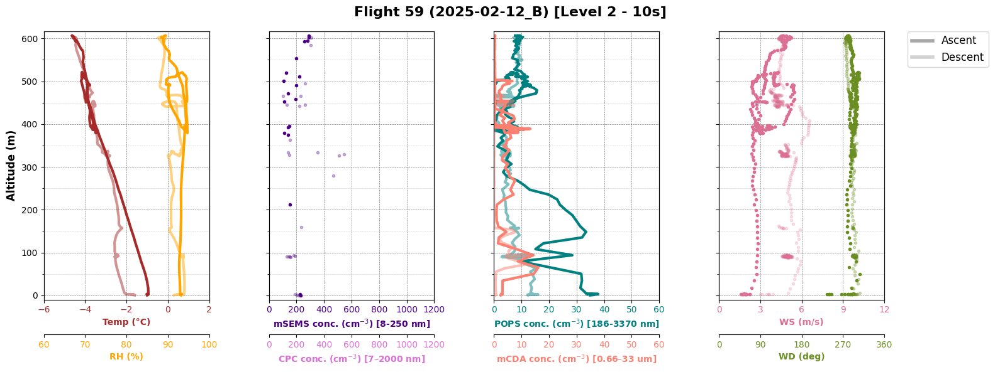

Saving figure to: C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\Level2_2025-02-12_A_10s_Flight_59.png


In [82]:
from helikite.processing.post.level1 import flight_profiles_2

# Limits for x-axis (T, RH, mSEMS, CPC, POPS, mCDA, WS, WD)
custom_xlim = {
    'ax1': (-6, 2),
    'ax2': (60, 100),
    'ax3': (0, 1200), 
    'ax4': (0, 1200),
    'ax5': (0, 60),
    'ax6': (0, 60),
    'ax7': (0, 12)
}

custom_xticks = {
    'ax1': np.arange(-6, 3, 2),
    'ax2': np.arange(60, 101, 10), 
    'ax3': np.arange(0, 1201, 200),
    'ax4': np.arange(0, 1201, 200),
    'ax5': np.arange(0, 61, 10),
    'ax6': np.arange(0, 61, 10),
    'ax7': np.arange(0, 13, 3)
}

# Plot title
custom_title = f'Flight {metadata.flight} ({metadata.flight_date}_B) [Level 2 - 10s]'
#custom_title = f'Flight 51 (2025-02-06_B) [Level 2]'

fig = flight_profiles_2(df_level2_average, metadata, xlims=custom_xlim, xticks=custom_xticks, fig_title=custom_title)

# Save the figure after plotting
folder_path = r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2'
filename = f'Level2_{metadata.flight_date}_A_10s_Flight_{metadata.flight}.png'
#filename = f'Level2_2025-02-06_B_Flight_51.png'
save_path = f'{folder_path}\\{filename}'
print("Saving figure to:", save_path)
fig.savefig(save_path, dpi=300, bbox_inches='tight')

Saving figure to: C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\Level2_2025-02-12_A_10s_Flight_59_SizeDistr.png


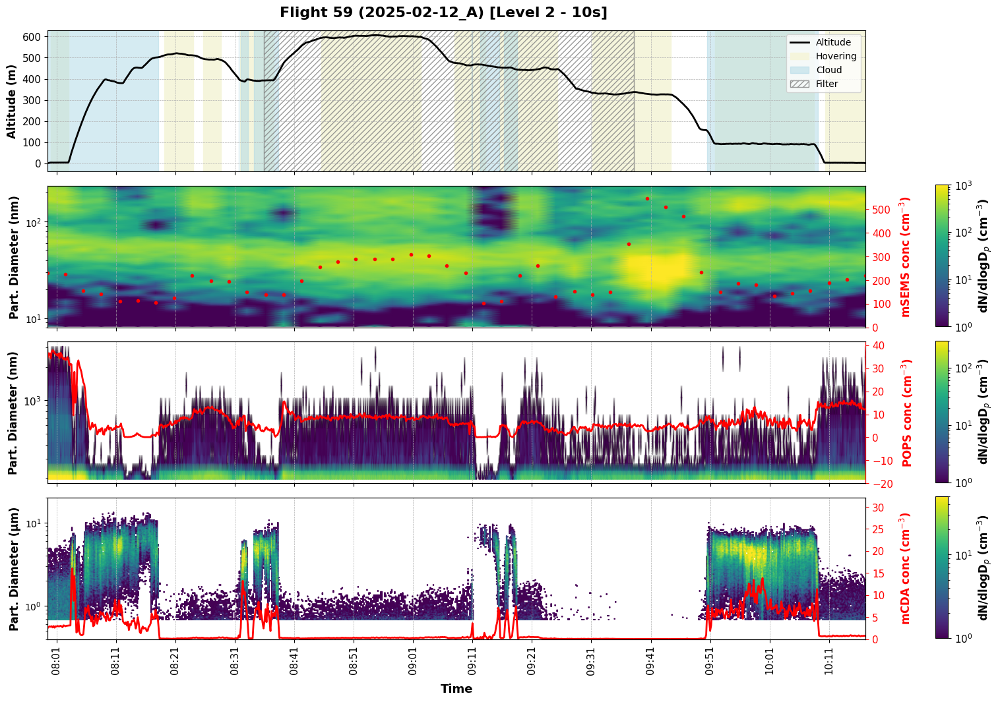

In [85]:
# TEMPORAL PLOT OF FLIGHT with POPS and mSEMS HEAT MAPS

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
from matplotlib.lines import Line2D
import matplotlib.ticker as ticker
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.colors as mcols
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

bin_diameter_averages = np.array([
    8.2, 8.7, 9.1, 9.6, 10.1, 10.7, 11.3,
    11.9, 12.5, 13.2, 13.9, 14.7, 15.5,
    16.3, 17.2, 18.2, 19.2, 20.2, 21.3,
    22.5, 23.7, 25.0, 26.4, 27.9, 29.5,
    31.1, 32.8, 34.7, 36.6, 38.7, 40.9,
    43.2, 45.7, 48.3, 51.1, 54.1, 57.2,
    60.5, 64.1, 67.9, 71.9, 76.2, 80.8,
    85.8, 91.0, 96.7, 102.7, 109.2, 116.1,
    123.6, 131.6, 140.3, 149.6, 159.7, 170.7,
    182.5, 195.4, 209.4, 224.6, 241.2
])


%matplotlib inline
plt.close('all')

# Create figure with 3 subplots, sharing the same x-axis
fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True, gridspec_kw={'height_ratios': [1, 1, 1, 1]})
plt.subplots_adjust(hspace=0.1)

""" SET THE TITLE OF THE PLOT (FLIGHT N° with DATE_X) """
# 'i' will automatically be replaced by the set flight number
# '_X' has to be changed manually in function of the flight index of the day (A, B, ...)
fig.suptitle(f'Flight {metadata.flight} ({metadata.flight_date}_A) [Level 2 - 10s]', fontsize=16, fontweight='bold', y=0.91)

### SUBPLOT 1: Altitude vs. Time
ax1 = axes[0]
ax1.plot(df_level2_average.index, df_level2_average['Altitude'], color='black', linewidth=2, label='Altitude')

ax1.set_ylabel('Altitude (m)', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y', labelsize=11)
ax1.grid(True, linestyle='--', linewidth=0.5)
ax1.tick_params(axis='x', labelbottom=False)
ax1.set_ylim(-40, df_level2_average['Altitude'].max() * 1.04)

# Shade areas for flag_pollution == 1
pollution_times = df_level2_average[df_level2_average['flag_pollution'] == 1].index
if not pollution_times.empty:
    start = pollution_times[0]
    for i in range(1, len(pollution_times)):
        if (pollution_times[i] - pollution_times[i - 1]) > pd.Timedelta(seconds=1):
            ax1.axvspan(start, pollution_times[i - 1], color='lightcoral', alpha=0.8, label='Pollution')
            start = pollution_times[i]
    ax1.axvspan(start, pollution_times[-1], color='lightcoral', alpha=0.8, label='Pollution')

# Shade areas for flag_hovering == 1
hovering_times = df_level2_average[df_level2_average['flag_hovering'] == 1].index
if not hovering_times.empty:
    start = hovering_times[0]
    for i in range(1, len(hovering_times)):
        if (hovering_times[i] - hovering_times[i - 1]) > pd.Timedelta(seconds=10):
            ax1.axvspan(start, hovering_times[i - 1], color='beige', alpha=1, label='Hovering')
            start = hovering_times[i]
    ax1.axvspan(start, hovering_times[-1], color='beige', alpha=1, label='Hovering')

# Shade areas for flag_cloud == 1
cloud_times = df_level2_average[df_level2_average['flag_cloud'] == 1].index
if not cloud_times.empty:
    start = cloud_times[0]
    for i in range(1, len(cloud_times)):
        if (cloud_times[i] - cloud_times[i - 1]) > pd.Timedelta(seconds=10):
            ax1.axvspan(start, cloud_times[i - 1], color='lightblue', alpha=0.5, label='Cloud')
            start = cloud_times[i]
    ax1.axvspan(start, cloud_times[-1], color='lightblue', alpha=0.5, label='Cloud')

# Shade areas for Filter_position !== 0.0
filter_times = df_level2_average[df_level2_average['Filter_position'] == 1].index
if not filter_times.empty:
    start = filter_times[0]
    for i in range(1, len(filter_times)):
        if (filter_times[i] - filter_times[i - 1]) > pd.Timedelta(seconds=10):
            ax1.axvspan(start, filter_times[i - 1], facecolor='none', edgecolor='gray', hatch='////', alpha=0.8, label='Filter')
            start = filter_times[i]
    ax1.axvspan(start, filter_times[-1], facecolor='none', edgecolor='gray', hatch='////', alpha=0.8, label='Filter')


# Optional: Clean legend (avoid duplicates)
handles, labels = ax1.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax1.legend(by_label.values(), by_label.keys(), fontsize=10)


### SUBPLOT 2: mSEMS heatmmap & total concentration
ax2 = axes[1]

# Get diameter bin averages
#start_dia = 'msems_inverted_Bin_Dia1'
#end_dia = 'msems_inverted_Bin_Dia60'
#bin_diameter_averages = df_level2_average.loc[:, start_dia:end_dia].mean()

# Get concentration data
start_conc = 'mSEMS_Bin_Conc1'
end_conc = 'mSEMS_Bin_Conc60'
counts = df_level2_average.loc[:, start_conc:end_conc]
counts.index = df_level2_average.index
counts = counts.astype(float).dropna(how='any')
counts = counts.clip(lower=1)

# Create 2D grid
xx, yy = np.meshgrid(counts.index.values, bin_diameter_averages)

# Contour plot
norm = mcolors.LogNorm(vmin=1, vmax=1000)
mesh = ax2.pcolormesh(xx, yy, counts.values.T, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax2)
cax = inset_axes(ax2, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax2.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=13, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Add Secondary Y-axis for Total Concentration
ax2_right = ax2.twinx()
total_conc = df_level2_average['mSEMS_total_N']
ax2_right.scatter(df_level2_average.index, total_conc, color='red', marker='.')
ax2_right.set_ylabel('mSEMS conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=8)
ax2_right.tick_params(axis='y', labelsize=11, colors='red')
ax2_right.set_ylim(0, total_conc.max() * 1.1)

# Labels and limits
ax2.set_yscale('log')
ax2.set_ylabel('Part. Diameter (nm)', fontsize=12, fontweight='bold')
ax2.set_ylim(8, 236)
ax2.grid(True, linestyle='--', alpha=0.6, axis='x')


### SUBPLOT 3: POPS heatmap & total concentration 
ax3 = axes[2]

# Define pops_dlogDp variable from Hendix documentation
pops_dia = [
    149.0801282, 162.7094017, 178.3613191, 195.2873341, 
    212.890625, 234.121875, 272.2136986, 322.6106374, 
    422.0817873, 561.8906456, 748.8896681, 1054.138693,
    1358.502538, 1802.347716, 2440.99162, 3061.590212
]

pops_dlogDp = [
    0.036454582, 0.039402553, 0.040330922, 0.038498955,
    0.036550107, 0.045593506, 0.082615487, 0.066315868,
    0.15575785, 0.100807113, 0.142865049, 0.152476328,
    0.077693935, 0.157186601, 0.113075192, 0.086705426
]

# Define the range of columns for POPS concentration
start_conc = 'POPS_b3'
end_conc = 'POPS_b15'

# Get POPS concentration data
pops_counts = df_level2_average.loc[:, start_conc:end_conc]
pops_counts = pops_counts.set_index(df_level2_average.index).astype(float)

# Create 2D grid
#pops_dia = np.logspace(np.log10(180), np.log10(3370), num=pops_counts.shape[1])
bin_diameters = pops_dia[3:16]
xx, yy = np.meshgrid(pops_counts.index.values, bin_diameters)

# Heatmap
norm = mcolors.LogNorm(vmin=1, vmax=300)
mesh = ax3.pcolormesh(xx, yy, pops_counts.values.T, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax3)
cax = inset_axes(ax3, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax3.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=12, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Labels and grid
ax3.set_yscale('log')
ax3.set_ylabel('Part. Diameter (nm)', fontsize=12, fontweight='bold')
ax3.tick_params(axis='y', labelsize=11)
ax3.grid(True, linestyle='--', linewidth=0.5, axis='x')
ax3.grid(False, axis='y')
ax3.set_ylim(180, 3370)

# Add Secondary Y-axis for Total POPS Concentration
ax3_right = ax3.twinx()
ax3_right.plot(df_level2_average.index, df_level2_average['POPS_total_N'], color='red', linewidth=2, label='Total POPS Conc.')
ax3_right.set_ylabel('POPS conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=8)
ax3_right.tick_params(axis='y', labelsize=11, colors='red')
ax3_right.spines['right'].set_color('red')
ax3_right.set_ylim(-20, df_level2_average['POPS_total_N'].max() * 1.1)


### Subplot 4: mCDA heatmap & total concentration 
ax4 = axes[3]

# Midpoint diameters
Midpoint_diameter_list = np.array([
    0.244381, 0.246646, 0.248908, 0.251144, 0.253398, 0.255593, 0.257846, 0.260141, 0.262561, 0.265062, 0.267712, 0.270370, 0.273159, 0.275904, 0.278724, 0.281554, 0.284585, 0.287661, 0.290892, 0.294127, 0.297512, 0.300813, 0.304101, 0.307439,
    0.310919, 0.314493, 0.318336, 0.322265, 0.326283, 0.330307, 0.334409, 0.338478, 0.342743, 0.347102, 0.351648, 0.356225, 0.360972, 0.365856, 0.371028, 0.376344, 0.382058, 0.387995, 0.394223, 0.400632, 0.407341, 0.414345, 0.421740, 0.429371,
    0.437556, 0.446036, 0.454738, 0.463515, 0.472572, 0.481728, 0.491201, 0.500739, 0.510645, 0.520720, 0.530938, 0.541128, 0.551563, 0.562058, 0.572951, 0.583736, 0.594907, 0.606101, 0.617542, 0.628738, 0.640375, 0.652197, 0.664789, 0.677657,
    0.691517, 0.705944, 0.721263, 0.736906, 0.753552, 0.770735, 0.789397, 0.808690, 0.829510, 0.851216, 0.874296, 0.897757, 0.922457, 0.948074, 0.975372, 1.003264, 1.033206, 1.064365, 1.097090, 1.130405, 1.165455, 1.201346, 1.239589, 1.278023,
    1.318937, 1.360743, 1.403723, 1.446000, 1.489565, 1.532676, 1.577436, 1.621533, 1.667088, 1.712520, 1.758571, 1.802912, 1.847836, 1.891948, 1.937088, 1.981087, 2.027604, 2.074306, 2.121821, 2.168489, 2.216644, 2.263724, 2.312591, 2.361099,
    2.412220, 2.464198, 2.518098, 2.571786, 2.628213, 2.685162, 2.745035, 2.805450, 2.869842, 2.935997, 3.005175, 3.074905, 3.148598, 3.224051, 3.305016, 3.387588, 3.476382, 3.568195, 3.664863, 3.761628, 3.863183, 3.965651, 4.072830, 4.179050,
    4.289743, 4.400463, 4.512449, 4.621025, 4.731530, 4.839920, 4.949855, 5.057777, 5.169742, 5.281416, 5.395039, 5.506828, 5.621488, 5.734391, 5.849553, 5.962881, 6.081516, 6.200801, 6.322133, 6.441786, 6.565130, 6.686935, 6.813017, 6.938981,
    7.071558, 7.205968, 7.345185, 7.483423, 7.628105, 7.774385, 7.926945, 8.080500, 8.247832, 8.419585, 8.598929, 8.780634, 8.973158, 9.167022, 9.372760, 9.582145, 9.808045, 10.041607, 10.287848, 10.537226, 10.801172, 11.068405, 11.345135,
    11.621413, 11.910639, 12.200227, 12.492929, 12.780176, 13.072476, 13.359067, 13.651163, 13.937329, 14.232032, 14.523919, 14.819204, 15.106612, 15.402110, 15.695489, 15.998035, 16.297519, 16.610927, 16.926800, 17.250511,
    17.570901, 17.904338, 18.239874, 18.588605, 18.938763, 19.311505, 19.693678, 20.093464, 20.498208, 20.927653, 21.366609, 21.827923, 22.297936, 22.802929, 23.325426, 23.872344, 24.428708, 25.016547, 25.616663, 26.249815,
    26.888493, 27.563838, 28.246317, 28.944507, 29.626186, 30.323440, 31.005915, 31.691752, 32.353900, 33.030123, 33.692286, 34.350532, 34.984611, 35.626553, 36.250913, 36.878655, 37.489663, 38.121550, 38.748073, 39.384594, 
    40.008540, 40.654627, 41.292757, 41.937789, 42.578436
])

# Prepare data
counts = df_level2_average.loc[:, 'mCDA_dataB1':'mCDA_dataB256']
counts = counts.set_index(df_level2_average.index)
counts = counts.astype(float)
counts[counts == 0] = np.nan

bin_diameters = Midpoint_diameter_list
xx, yy = np.meshgrid(counts.index.values, bin_diameters)
Z = counts.values.T

# Plot heatmap
norm = mcolors.LogNorm(vmin=1, vmax=50)
mesh = ax4.pcolormesh(xx, yy, Z, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax4)
cax = inset_axes(ax4, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax4.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=12, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Total concentration
ax4_right = ax4.twinx()
total_conc = df_level2_average['mCDA_total_N']
ax4_right.plot(df_level2_average.index, total_conc, color='red', linewidth=2)
ax4_right.set_ylabel('mCDA conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=15)
ax4_right.tick_params(axis='y', labelsize=11, colors='red')
ax4_right.set_ylim(0, total_conc.max() * 2)
ax4_right.set_xlim(ax4.get_xlim())

# Axis styling
ax4.set_yscale('log')
ax4.set_ylabel('Part. Diameter (μm)', fontsize=12, fontweight='bold')
ax4.set_ylim(0.4, 20)
ax4.grid(True, linestyle='--', linewidth=0.5, axis='x')
ax4.grid(False, axis='y')

# Legend for secondary y-axis
#ax2_right.legend(['mSEMS total conc.'], loc='upper right', fontsize=11, frameon=False)
#ax3_right.legend(['POPS total conc.'], loc='upper right', fontsize=11, frameon=False)
#ax4_right.legend(['mCDA total conc.'], loc='upper right', fontsize=11, frameon=False)

# X-axis formatting for all subplots
ax4.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax4.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax4.set_xlabel('Time', fontsize=13, fontweight='bold', labelpad=10)
ax4.tick_params(axis='x', rotation=90, labelsize=11)

""" SET TIME RANGE (DATE + TIME) """
#ax3.set_xlim(pd.Timestamp('2025-02-12T07:55:00'), pd.Timestamp('2025-02-12T10:20:00'))

""" SAVE PLOT """
folder_path = r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2'
filename = f'Level2_{metadata.flight_date}_A_10s_Flight_{metadata.flight}_SizeDistr.png'
save_path = f'{folder_path}\\{filename}'
print("Saving figure to:", save_path)
fig.savefig(save_path, dpi=300, bbox_inches='tight')

#plt.tight_layout()
plt.show()

In [32]:
""" CHANGE NAME OF OUTPUT FILE """

df_level2_average.to_csv(r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\Averaged\level2_2025-02-12_A_10s.csv', index=True)
print(f"Saved Level2 (averaged) file of Flight {metadata.flight}.")

Saved Level2 (averaged) file of Flight 51.


**FINISHED**

# Final file  
Combine all csv files into one big txt file.

In [35]:
import pandas as pd
import glob
import os

# Define the folder containing your CSV files
folder = r"C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\Averaged"

# Find all CSV files in the folder
csv_files = glob.glob(os.path.join(folder, "*.csv"))

df_list = []

for i, file in enumerate(csv_files):
    # Read all files the same way; we'll parse datetime afterward
    df = pd.read_csv(file)
    df_list.append(df)

# Combine all files
combined_df = pd.concat(df_list, ignore_index=True)

# Parse the first column as datetime
datetime_col = combined_df.columns[0]
combined_df[datetime_col] = pd.to_datetime(combined_df[datetime_col], errors='coerce')

# Sort by the datetime column
combined_df = combined_df.sort_values(by=datetime_col)
combined_df = combined_df.set_index('datetime')

# Save as a single comma-separated text file
output_path = os.path.join(folder, r"C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\Averaged\ORACLES_64Helikite_2024.txt")
combined_df.to_csv(output_path, index=True)
combined_df

,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,mSEMS_total_N,...,tapir_Thead1,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_Tbox,flag_pollution,flag_hovering,flag_cloud,flight_nr,campaign
datetime,,,,,,,,,,,,,,,,,,,,,
2025-01-27 18:18:40,0.33,-70.6621,-8.2860,987.02,8.40,47.20,1.20,154.50,2.45,NaN,...,3.30,3.3,4.30,4.3,7.90,NaN,0,0,45,ORACLES
2025-01-27 18:18:50,1.87,-70.6621,-8.2860,986.83,8.42,47.20,1.12,154.50,2.67,NaN,...,3.40,3.3,4.30,4.3,7.95,NaN,0,0,45,ORACLES
2025-01-27 18:19:00,2.79,NaN,NaN,986.72,8.41,47.19,NaN,NaN,1.37,NaN,...,3.55,3.3,4.40,4.3,8.00,NaN,1,0,45,ORACLES
2025-01-27 18:19:10,2.63,-70.6621,-8.2860,986.74,8.22,47.04,1.78,172.45,0.57,NaN,...,3.60,3.4,4.45,4.4,8.10,NaN,1,0,45,ORACLES
2025-01-27 18:19:20,2.44,-70.6621,-8.2860,986.76,6.86,46.99,1.46,205.08,1.47,NaN,...,3.60,3.5,4.55,4.5,8.15,NaN,1,0,45,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-15 11:21:40,3.42,-70.6620,-8.2862,982.29,-9.86,77.36,NaN,NaN,4.41,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,68,ORACLES
2025-02-15 11:21:50,3.52,-70.6620,-8.2862,982.28,-9.92,77.38,NaN,NaN,5.01,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,68,ORACLES
2025-02-15 11:22:00,3.59,-70.6620,-8.2862,982.27,-9.94,77.43,NaN,NaN,4.68,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,68,ORACLES


Saving figure to: C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\BigHelikiteFlights_SizeDistr.png


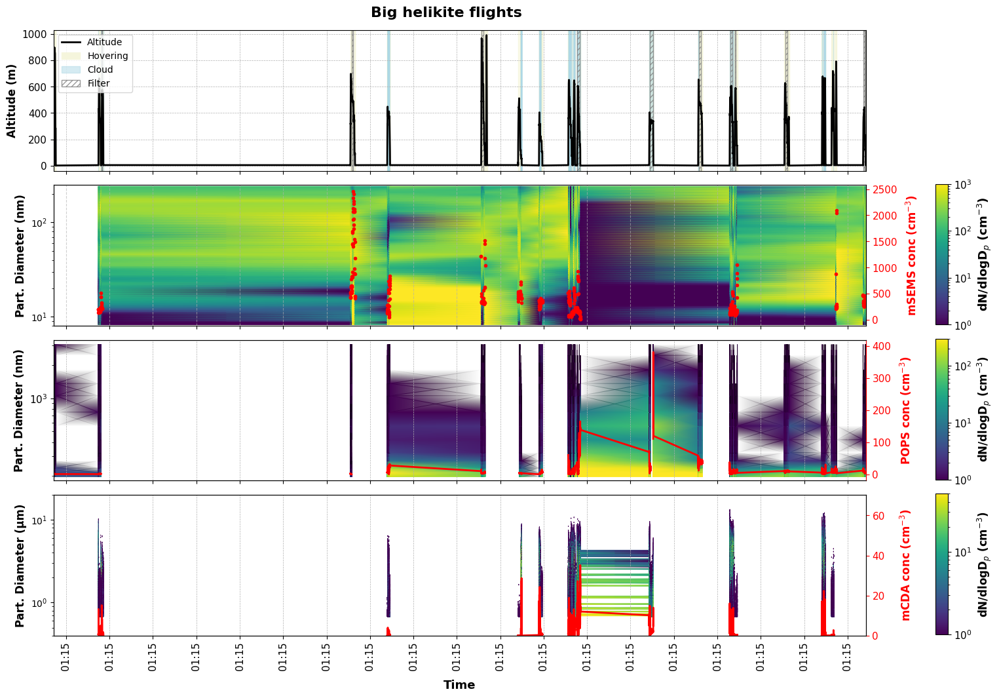

In [2]:
# TEMPORAL PLOT OF FLIGHT with POPS and mSEMS HEAT MAPS

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
from matplotlib.lines import Line2D
import matplotlib.ticker as ticker
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.colors as mcols
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

bin_diameter_averages = np.array([
    8.2, 8.7, 9.1, 9.6, 10.1, 10.7, 11.3,
    11.9, 12.5, 13.2, 13.9, 14.7, 15.5,
    16.3, 17.2, 18.2, 19.2, 20.2, 21.3,
    22.5, 23.7, 25.0, 26.4, 27.9, 29.5,
    31.1, 32.8, 34.7, 36.6, 38.7, 40.9,
    43.2, 45.7, 48.3, 51.1, 54.1, 57.2,
    60.5, 64.1, 67.9, 71.9, 76.2, 80.8,
    85.8, 91.0, 96.7, 102.7, 109.2, 116.1,
    123.6, 131.6, 140.3, 149.6, 159.7, 170.7,
    182.5, 195.4, 209.4, 224.6, 241.2
])


%matplotlib inline
plt.close('all')

# Create figure with 3 subplots, sharing the same x-axis
fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True, gridspec_kw={'height_ratios': [1, 1, 1, 1]})
plt.subplots_adjust(hspace=0.1)

""" SET THE TITLE OF THE PLOT (FLIGHT N° with DATE_X) """
# 'i' will automatically be replaced by the set flight number
# '_X' has to be changed manually in function of the flight index of the day (A, B, ...)
fig.suptitle(f'Big helikite flights', fontsize=16, fontweight='bold', y=0.91)

### SUBPLOT 1: Altitude vs. Time
ax1 = axes[0]
ax1.plot(combined_df.index, combined_df['Altitude'], color='black', linewidth=2, label='Altitude')

ax1.set_ylabel('Altitude (m)', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y', labelsize=11)
ax1.grid(True, linestyle='--', linewidth=0.5)
ax1.tick_params(axis='x', labelbottom=False)
ax1.set_ylim(-40, combined_df['Altitude'].max() * 1.04)

# Shade areas for flag_pollution == 1
pollution_times = combined_df[combined_df['flag_pollution'] == 1].index
if not pollution_times.empty:
    start = pollution_times[0]
    for i in range(1, len(pollution_times)):
        if (pollution_times[i] - pollution_times[i - 1]) > pd.Timedelta(seconds=1):
            ax1.axvspan(start, pollution_times[i - 1], color='lightcoral', alpha=0.8, label='Pollution')
            start = pollution_times[i]
    ax1.axvspan(start, pollution_times[-1], color='lightcoral', alpha=0.8, label='Pollution')

# Shade areas for flag_hovering == 1
combined_df.index = pd.to_datetime(combined_df.index, errors='coerce')
hovering_times = combined_df[combined_df['flag_hovering'] == 1].index
if not hovering_times.empty:
    start = hovering_times[0]
    for i in range(1, len(hovering_times)):
        if (hovering_times[i] - hovering_times[i - 1]) > pd.Timedelta(seconds=10):
            ax1.axvspan(start, hovering_times[i - 1], color='beige', alpha=1, label='Hovering')
            start = hovering_times[i]
    ax1.axvspan(start, hovering_times[-1], color='beige', alpha=1, label='Hovering')

# Shade areas for flag_cloud == 1
cloud_times = combined_df[combined_df['flag_cloud'] == 1].index
if not cloud_times.empty:
    start = cloud_times[0]
    for i in range(1, len(cloud_times)):
        if (cloud_times[i] - cloud_times[i - 1]) > pd.Timedelta(seconds=10):
            ax1.axvspan(start, cloud_times[i - 1], color='lightblue', alpha=0.5, label='Cloud')
            start = cloud_times[i]
    ax1.axvspan(start, cloud_times[-1], color='lightblue', alpha=0.5, label='Cloud')

# Shade areas for Filter_position !== 0.0
filter_times = combined_df[combined_df['Filter_position'] == 1].index
if not filter_times.empty:
    start = filter_times[0]
    for i in range(1, len(filter_times)):
        if (filter_times[i] - filter_times[i - 1]) > pd.Timedelta(seconds=10):
            ax1.axvspan(start, filter_times[i - 1], facecolor='none', edgecolor='gray', hatch='////', alpha=0.8, label='Filter')
            start = filter_times[i]
    ax1.axvspan(start, filter_times[-1], facecolor='none', edgecolor='gray', hatch='////', alpha=0.8, label='Filter')


# Optional: Clean legend (avoid duplicates)
handles, labels = ax1.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax1.legend(by_label.values(), by_label.keys(), fontsize=10)


### SUBPLOT 2: mSEMS heatmmap & total concentration
ax2 = axes[1]

# Get diameter bin averages
#start_dia = 'msems_inverted_Bin_Dia1'
#end_dia = 'msems_inverted_Bin_Dia60'
#bin_diameter_averages = combined_df.loc[:, start_dia:end_dia].mean()

# Get concentration data
start_conc = 'mSEMS_Bin_Conc1'
end_conc = 'mSEMS_Bin_Conc60'
counts = combined_df.loc[:, start_conc:end_conc]
counts.index = combined_df.index
counts = counts.astype(float).dropna(how='any')
counts = counts.clip(lower=1)

# Create 2D grid
xx, yy = np.meshgrid(counts.index.values, bin_diameter_averages)

# Contour plot
norm = mcolors.LogNorm(vmin=1, vmax=1000)
mesh = ax2.pcolormesh(xx, yy, counts.values.T, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax2)
cax = inset_axes(ax2, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax2.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=13, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Add Secondary Y-axis for Total Concentration
ax2_right = ax2.twinx()
total_conc = combined_df['mSEMS_total_N']
ax2_right.scatter(combined_df.index, total_conc, color='red', marker='.')
ax2_right.set_ylabel('mSEMS conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=8)
ax2_right.tick_params(axis='y', labelsize=11, colors='red')
#ax2_right.set_ylim(0, total_conc.max() * 1.1)

# Labels and limits
ax2.set_yscale('log')
ax2.set_ylabel('Part. Diameter (nm)', fontsize=12, fontweight='bold')
ax2.set_ylim(8, 250)
ax2.grid(True, linestyle='--', alpha=0.6, axis='x')


### SUBPLOT 3: POPS heatmap & total concentration 
ax3 = axes[2]

# Define pops_dlogDp variable from Hendix documentation
pops_dia = [
    149.0801282, 162.7094017, 178.3613191, 195.2873341, 
    212.890625, 234.121875, 272.2136986, 322.6106374, 
    422.0817873, 561.8906456, 748.8896681, 1054.138693,
    1358.502538, 1802.347716, 2440.99162, 3061.590212
]

pops_dlogDp = [
    0.036454582, 0.039402553, 0.040330922, 0.038498955,
    0.036550107, 0.045593506, 0.082615487, 0.066315868,
    0.15575785, 0.100807113, 0.142865049, 0.152476328,
    0.077693935, 0.157186601, 0.113075192, 0.086705426
]

# Define the range of columns for POPS concentration
start_conc = 'POPS_b3'
end_conc = 'POPS_b15'

# Get POPS concentration data
pops_counts = combined_df.loc[:, start_conc:end_conc]
pops_counts = pops_counts.set_index(combined_df.index).astype(float)

# Create 2D grid
#pops_dia = np.logspace(np.log10(180), np.log10(3370), num=pops_counts.shape[1])
bin_diameters = pops_dia[3:16]
xx, yy = np.meshgrid(pops_counts.index.values, bin_diameters)

# Heatmap
norm = mcolors.LogNorm(vmin=1, vmax=300)
mesh = ax3.pcolormesh(xx, yy, pops_counts.values.T, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax3)
cax = inset_axes(ax3, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax3.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=12, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Labels and grid
ax3.set_yscale('log')
ax3.set_ylabel('Part. Diameter (nm)', fontsize=12, fontweight='bold')
ax3.tick_params(axis='y', labelsize=11)
ax3.grid(True, linestyle='--', linewidth=0.5, axis='x')
ax3.grid(False, axis='y')
ax3.set_ylim(180, 3370)

# Add Secondary Y-axis for Total POPS Concentration
ax3_right = ax3.twinx()
ax3_right.plot(combined_df.index, combined_df['POPS_total_N'], color='red', linewidth=2, label='Total POPS Conc.')
ax3_right.set_ylabel('POPS conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=8)
ax3_right.tick_params(axis='y', labelsize=11, colors='red')
ax3_right.spines['right'].set_color('red')
ax3_right.set_ylim(-20, combined_df['POPS_total_N'].max() * 1.1)


### Subplot 4: mCDA heatmap & total concentration 
ax4 = axes[3]

# Midpoint diameters
Midpoint_diameter_list = np.array([
    0.244381, 0.246646, 0.248908, 0.251144, 0.253398, 0.255593, 0.257846, 0.260141, 0.262561, 0.265062, 0.267712, 0.270370, 0.273159, 0.275904, 0.278724, 0.281554, 0.284585, 0.287661, 0.290892, 0.294127, 0.297512, 0.300813, 0.304101, 0.307439,
    0.310919, 0.314493, 0.318336, 0.322265, 0.326283, 0.330307, 0.334409, 0.338478, 0.342743, 0.347102, 0.351648, 0.356225, 0.360972, 0.365856, 0.371028, 0.376344, 0.382058, 0.387995, 0.394223, 0.400632, 0.407341, 0.414345, 0.421740, 0.429371,
    0.437556, 0.446036, 0.454738, 0.463515, 0.472572, 0.481728, 0.491201, 0.500739, 0.510645, 0.520720, 0.530938, 0.541128, 0.551563, 0.562058, 0.572951, 0.583736, 0.594907, 0.606101, 0.617542, 0.628738, 0.640375, 0.652197, 0.664789, 0.677657,
    0.691517, 0.705944, 0.721263, 0.736906, 0.753552, 0.770735, 0.789397, 0.808690, 0.829510, 0.851216, 0.874296, 0.897757, 0.922457, 0.948074, 0.975372, 1.003264, 1.033206, 1.064365, 1.097090, 1.130405, 1.165455, 1.201346, 1.239589, 1.278023,
    1.318937, 1.360743, 1.403723, 1.446000, 1.489565, 1.532676, 1.577436, 1.621533, 1.667088, 1.712520, 1.758571, 1.802912, 1.847836, 1.891948, 1.937088, 1.981087, 2.027604, 2.074306, 2.121821, 2.168489, 2.216644, 2.263724, 2.312591, 2.361099,
    2.412220, 2.464198, 2.518098, 2.571786, 2.628213, 2.685162, 2.745035, 2.805450, 2.869842, 2.935997, 3.005175, 3.074905, 3.148598, 3.224051, 3.305016, 3.387588, 3.476382, 3.568195, 3.664863, 3.761628, 3.863183, 3.965651, 4.072830, 4.179050,
    4.289743, 4.400463, 4.512449, 4.621025, 4.731530, 4.839920, 4.949855, 5.057777, 5.169742, 5.281416, 5.395039, 5.506828, 5.621488, 5.734391, 5.849553, 5.962881, 6.081516, 6.200801, 6.322133, 6.441786, 6.565130, 6.686935, 6.813017, 6.938981,
    7.071558, 7.205968, 7.345185, 7.483423, 7.628105, 7.774385, 7.926945, 8.080500, 8.247832, 8.419585, 8.598929, 8.780634, 8.973158, 9.167022, 9.372760, 9.582145, 9.808045, 10.041607, 10.287848, 10.537226, 10.801172, 11.068405, 11.345135,
    11.621413, 11.910639, 12.200227, 12.492929, 12.780176, 13.072476, 13.359067, 13.651163, 13.937329, 14.232032, 14.523919, 14.819204, 15.106612, 15.402110, 15.695489, 15.998035, 16.297519, 16.610927, 16.926800, 17.250511,
    17.570901, 17.904338, 18.239874, 18.588605, 18.938763, 19.311505, 19.693678, 20.093464, 20.498208, 20.927653, 21.366609, 21.827923, 22.297936, 22.802929, 23.325426, 23.872344, 24.428708, 25.016547, 25.616663, 26.249815,
    26.888493, 27.563838, 28.246317, 28.944507, 29.626186, 30.323440, 31.005915, 31.691752, 32.353900, 33.030123, 33.692286, 34.350532, 34.984611, 35.626553, 36.250913, 36.878655, 37.489663, 38.121550, 38.748073, 39.384594, 
    40.008540, 40.654627, 41.292757, 41.937789, 42.578436
])

# Prepare data
counts = combined_df.loc[:, 'mCDA_dataB1':'mCDA_dataB256']
counts = counts.set_index(combined_df.index)
counts = counts.astype(float)
counts[counts == 0] = np.nan

bin_diameters = Midpoint_diameter_list
xx, yy = np.meshgrid(counts.index.values, bin_diameters)
Z = counts.values.T

# Plot heatmap
norm = mcolors.LogNorm(vmin=1, vmax=50)
mesh = ax4.pcolormesh(xx, yy, Z, cmap='viridis', norm=norm, shading="gouraud")

# Colorbar
divider = make_axes_locatable(ax4)
cax = inset_axes(ax4, width="1.5%", height="100%", loc='lower left',
                 bbox_to_anchor=(1.08, -0.025, 1, 1), bbox_transform=ax4.transAxes)
cb = fig.colorbar(mesh, cax=cax, orientation='vertical')
cb.set_label('dN/dlogD$_p$ (cm$^{-3}$)', fontsize=12, fontweight='bold')
cb.ax.tick_params(labelsize=11)

# Total concentration
ax4_right = ax4.twinx()
total_conc = combined_df['mCDA_total_N']
ax4_right.plot(combined_df.index, total_conc, color='red', linewidth=2)
ax4_right.set_ylabel('mCDA conc (cm$^{-3}$)', fontsize=12, fontweight='bold', color='red', labelpad=15)
ax4_right.tick_params(axis='y', labelsize=11, colors='red')
ax4_right.set_ylim(0, total_conc.max() * 2)
ax4_right.set_xlim(ax4.get_xlim())

# Axis styling
ax4.set_yscale('log')
ax4.set_ylabel('Part. Diameter (μm)', fontsize=12, fontweight='bold')
ax4.set_ylim(0.4, 20)
ax4.grid(True, linestyle='--', linewidth=0.5, axis='x')
ax4.grid(False, axis='y')

# Legend for secondary y-axis
#ax2_right.legend(['mSEMS total conc.'], loc='upper right', fontsize=11, frameon=False)
#ax3_right.legend(['POPS total conc.'], loc='upper right', fontsize=11, frameon=False)
#ax4_right.legend(['mCDA total conc.'], loc='upper right', fontsize=11, frameon=False)

# X-axis formatting for all subplots
ax4.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax4.xaxis.set_major_locator(mdates.MinuteLocator(interval=1440))
ax4.set_xlabel('Time', fontsize=13, fontweight='bold', labelpad=10)
ax4.tick_params(axis='x', rotation=90, labelsize=11)

""" SET TIME RANGE (DATE + TIME) """
#ax3.set_xlim(pd.Timestamp('2025-02-12T07:55:00'), pd.Timestamp('2025-02-12T10:20:00'))

""" SAVE PLOT """
folder_path = r'C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2'
filename = f'BigHelikiteFlights_SizeDistr.png'
save_path = f'{folder_path}\\{filename}'
print("Saving figure to:", save_path)
fig.savefig(save_path, dpi=300, bbox_inches='tight')

#plt.tight_layout()
plt.show()

# Random code bits
### Remove outliers from the Smart Tether WS and WD datapoints

This is a **sliding-window median filter** used for **outlier detection and removal**.
- Look at a window of neighboring values around each data point (10 neighboring values)
- Compare the current point to the median of this window.
- If the point is significantly different (>35% away from the median), it's treated as an outlier and **replaced with NaN**.

Applied on WS, the corresponding WD datapoints are then also removed.

Number of wind speed outliers replaced with NaN: 92


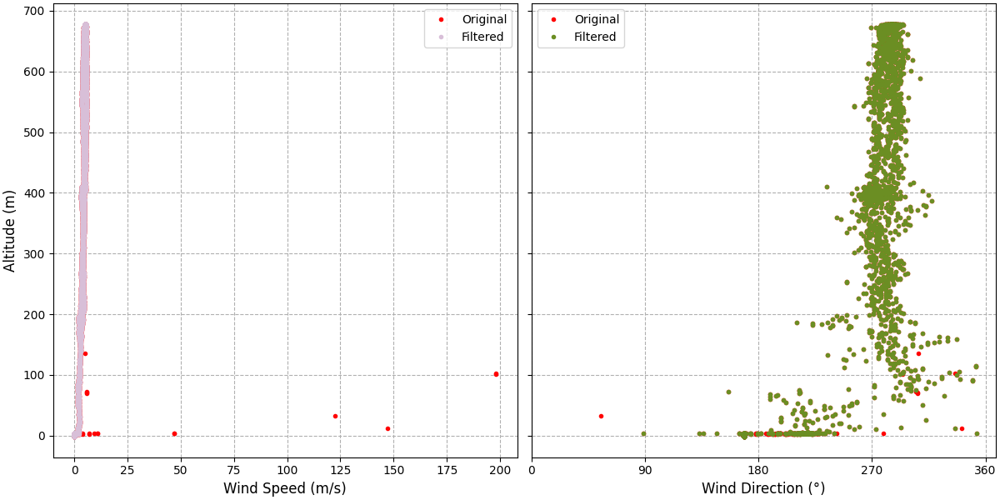

In [46]:
from helikite.instruments.smart_tether import wind_outlier_removal
%matplotlib ipympl

df_filtered = wind_outlier_removal(df)

**IF THE FILTER APPLIES CORRECTLY** : save the filtered WS and WD data back into th original dataframe

In [18]:
# Save the filtered data back into th original dataframe
df['smart_tether_Wind (m/s)'] = df_filtered['smart_tether_Wind (m/s)']
df['smart_tether_Wind (degrees)'] = df_filtered['smart_tether_Wind (degrees)']
print("Filtered data saved to the original dataframe.")

Filtered data saved to the original dataframe.


### Metadata dictionary

In [ ]:
# Otherwise, to make a dictionary from the metadata:
metadata_dict = metadata.model_dump()

# Then use it as a normal Python dictionary
metadata_dict['flight_date']

In [ ]:
# The dataframe is unpacked into the 'df' variable from that function above
df

### Remove WS and WD outliers after data processing

In [18]:
file_path = r"C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\level2_2025-02-06_B.csv"

flight51 = pd.read_csv(file_path)
flight51

,datetime,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,...,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,flag_pollution,flag_hovering,flag_cloud,flight_nr,campaign
0,2025-02-06 17:24:35,3.91,NaN,NaN,978.0,2.75,69.3,0.0,298,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
1,2025-02-06 17:24:36,3.91,NaN,NaN,978.0,2.75,69.2,0.0,298,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
2,2025-02-06 17:24:37,4.74,NaN,NaN,977.9,2.75,69.1,0.0,296,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
3,2025-02-06 17:24:38,3.91,NaN,NaN,978.0,2.75,69.0,0.0,300,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
4,2025-02-06 17:24:39,3.91,NaN,NaN,978.0,2.75,68.9,0.0,297,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1990,2025-02-06 17:57:56,3.91,NaN,NaN,978.0,-0.62,74.0,1.6,180,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
1991,2025-02-06 17:57:57,3.91,NaN,NaN,978.0,-0.62,73.9,1.6,180,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
1992,2025-02-06 17:57:58,3.91,NaN,NaN,978.0,-0.62,73.9,1.6,177,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
1993,2025-02-06 17:57:59,3.91,NaN,NaN,978.0,-0.62,73.9,1.6,179,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES


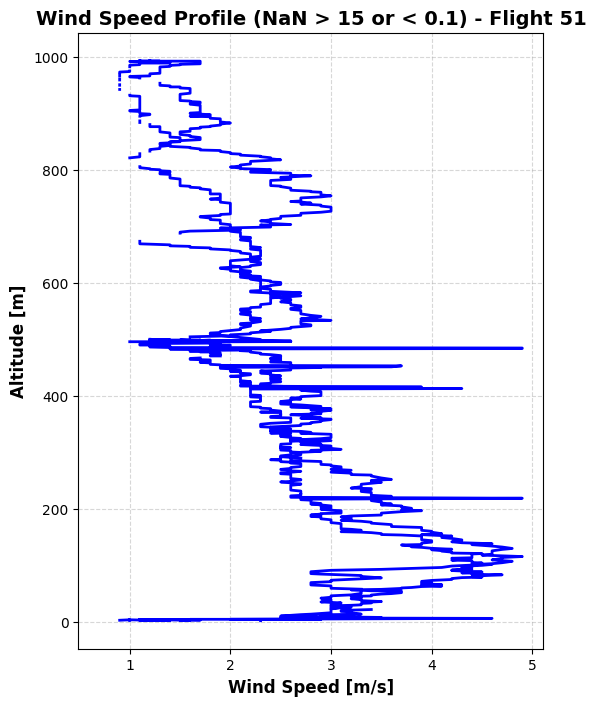

In [23]:
# Replace WindSpeed > 15 or < 0.1 with NaN
mask = (flight51['WindSpeed'] > 5) | (flight51['WindSpeed'] < 0.1)
flight51.loc[mask, 'WindSpeed'] = np.nan

# Replace corresponding WindDir with NaN
flight51.loc[mask, 'WindDir'] = np.nan

# Plot WindSpeed vs Altitude
plt.figure(figsize=(6,8))
plt.plot(flight51['WindSpeed'], flight51['Altitude'], color='blue', linewidth=2)

plt.xlabel("Wind Speed [m/s]", fontsize=12, fontweight='bold')
plt.ylabel("Altitude [m]", fontsize=12, fontweight='bold')
plt.title("Wind Speed Profile (NaN > 15 or < 0.1) - Flight 51", fontsize=14, fontweight='bold')
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

In [24]:
flight51

,datetime,Altitude,Lat,Long,P,TEMP,RH,WindSpeed,WindDir,POPS_total_N,...,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox,flag_pollution,flag_hovering,flag_cloud,flight_nr,campaign
0,2025-02-06 17:24:35,3.91,NaN,NaN,978.0,2.75,69.3,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
1,2025-02-06 17:24:36,3.91,NaN,NaN,978.0,2.75,69.2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
2,2025-02-06 17:24:37,4.74,NaN,NaN,977.9,2.75,69.1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
3,2025-02-06 17:24:38,3.91,NaN,NaN,978.0,2.75,69.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
4,2025-02-06 17:24:39,3.91,NaN,NaN,978.0,2.75,68.9,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1990,2025-02-06 17:57:56,3.91,NaN,NaN,978.0,-0.62,74.0,1.6,180.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
1991,2025-02-06 17:57:57,3.91,NaN,NaN,978.0,-0.62,73.9,1.6,180.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
1992,2025-02-06 17:57:58,3.91,NaN,NaN,978.0,-0.62,73.9,1.6,177.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES
1993,2025-02-06 17:57:59,3.91,NaN,NaN,978.0,-0.62,73.9,1.6,179.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,0,51,ORACLES


In [33]:
file_path = r"C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\level2_2025-02-06_B.csv"

# Save cleaned flight51
flight51.to_csv(file_path, index=False)

print(f"Flight 51 saved to {file_path}")


Flight 51 saved to C:\Users\temel\Desktop\EERL\Campaigns\03_ORACLES\Neumayer_2024\Data\Processing\Level2\level2_2025-02-06_B.csv


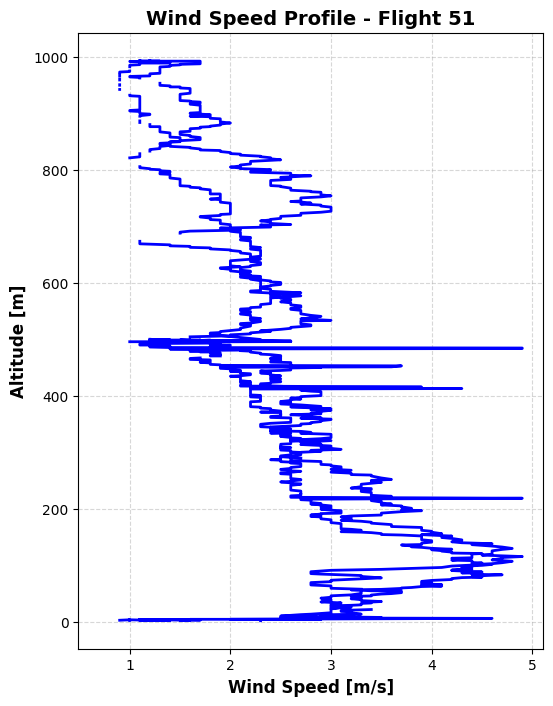

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,8))
plt.plot(flight51['WindSpeed'], flight51['Altitude'], color='blue', linewidth=2)

plt.xlabel("Wind Speed [m/s]", fontsize=12, fontweight='bold')
plt.ylabel("Altitude [m]", fontsize=12, fontweight='bold')
plt.title("Wind Speed Profile - Flight 51", fontsize=14, fontweight='bold')
plt.grid(True, linestyle="--", alpha=0.5)

plt.show()


### GPS coordinate check

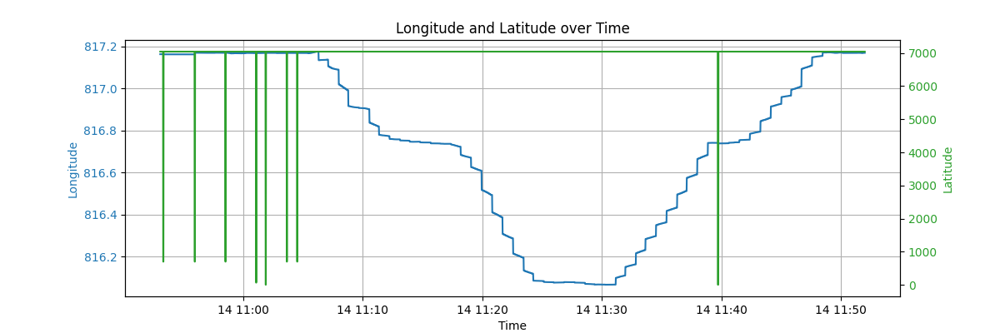

In [48]:
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots(figsize=(12, 4))

# First y-axis for Longitude
color = 'tab:blue'
ax1.set_xlabel('Time')
ax1.set_ylabel('Longitude', color=color)
ax1.plot(df.index, df['flight_computer_Long'], color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(True)

# Second y-axis for Latitude
ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Latitude', color=color)
ax2.plot(df.index, df['flight_computer_Lat'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Longitude and Latitude over Time')
plt.show()


In [66]:
import pandas as pd

def convert_dm_to_dd(dm_value, direction):
    if pd.isna(dm_value):
        return None
    degrees = int(dm_value / 100)
    minutes = dm_value - degrees * 100
    dd = degrees + minutes / 60
    if direction in ['S', 'W']:
        dd *= -1
    return dd

# Apply conversion to the entire column
df['latitude_dd'] = df['flight_computer_Lat'].apply(lambda x: convert_dm_to_dd(x, 'S'))
df['longitude_dd'] = df['flight_computer_Long'].apply(lambda x: convert_dm_to_dd(x, 'W'))
df['latitude_dd']

DateTime
2025-02-14 10:53:05   -70.662045
2025-02-14 10:53:06   -70.662045
2025-02-14 10:53:07   -70.662045
2025-02-14 10:53:08   -70.662045
2025-02-14 10:53:09   -70.662045
                         ...    
2025-02-14 11:51:56   -70.662003
2025-02-14 11:51:57   -70.662003
2025-02-14 11:51:58   -70.662003
2025-02-14 11:51:59   -70.662003
2025-02-14 11:52:00   -70.662003
Name: latitude_dd, Length: 3536, dtype: float64

### Export TAPIR data for Delphine 

In [8]:
df['mcda_dN_totalconc_stp'] = np.nan

In [24]:
# Create a new DataFrame with the same DateTime index as df
df_tapir = df.loc[:, ['Altitude', 'Average_Temperature', 'Temperature_ground', 'mcda_dN_totalconc_stp'] + 
                  [col for col in df.columns if col.startswith('tapir_')]]
df_tapir['Altitude'] = df_tapir['Altitude'].round(2)
df_tapir['Average_Temperature'] = df_tapir['Average_Temperature'].round(2)
df_tapir['mcda_dN_totalconc_stp'] = df_tapir['mcda_dN_totalconc_stp'].round(2)

df_tapir

,Altitude,Average_Temperature,Temperature_ground,mcda_dN_totalconc_stp,tapir_DateTime,tapir_ST,tapir_YrMoDy,tapir_HrMnSd,tapir_GT,tapir_YrMoDy.1,...,tapir_Tproc2,tapir_Tproc3,tapir_Tproc4,tapir_TH,tapir_Thead1,tapir_Thead2,tapir_Thead3,tapir_Thead4,tapir_TB,tapir_Tbox
DateTime,,,,,,,,,,,,,,,,,,,,,
2025-02-08 19:36:53,-0.24,-0.18,272.842417,4.75,2025-02-08 19:36:53,ST,20250208,193651,GT,20250208.0,...,1.6,2.0,0.4,TH,2.5,2.3,2.8,3.3,TB,8.5
2025-02-08 19:36:54,-0.40,-0.18,272.842417,4.06,2025-02-08 19:36:54,None,None,None,None,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,None,NaN
2025-02-08 19:36:55,-0.72,-0.18,272.842417,4.06,2025-02-08 19:36:55,None,None,None,None,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,None,NaN
2025-02-08 19:36:56,-0.24,-0.18,272.842417,5.00,2025-02-08 19:36:56,ST,20250208,193656,GT,20250208.0,...,1.6,2.0,0.4,TH,2.5,2.3,2.8,3.3,TB,8.6
2025-02-08 19:36:57,-0.15,-0.18,272.842417,5.00,2025-02-08 19:36:57,None,None,None,None,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-08 21:35:34,-0.34,-0.61,272.416000,13.56,NaT,None,None,None,None,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,None,NaN
2025-02-08 21:35:35,-0.42,-0.60,272.416000,12.81,NaT,None,None,None,None,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,None,NaN
2025-02-08 21:35:36,0.47,-0.62,272.416000,11.92,NaT,None,None,None,None,NaN,...,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,None,NaN


In [26]:
import pandas as pd
import os

# Example metadata as a dictionary (you can adjust this to your actual metadata object)
metadata_lines = {
    'Flight date' : metadata.flight_date,
    'Flight number' : metadata.flight,
    'Takeoff time' : metadata.takeoff_time,
    'Landing time' : metadata.landing_time,
    'Average_Temperature (in °C)' : 'average T from two temperature sensors',
    'Temperature_ground (in K)' : 'extrapolated ground temperature based on T at takeoff and landing',
    'mcda_dN_totalconc_stp (cm-3)' : 'droplet total concentration',
    'Note' : 'there are two "peaks" in the temperature profile, I am however not yet sure if they are significant or outliers'
}

# Construct the dynamic filename
filename = f"{metadata.flight_date}_Flight{metadata.flight}_TAPIR.txt"

# Define your output directory (use raw string if needed)
output_dir = r'C:\Users\temel\helikite-data-processing\Yolanda-helikite-data-processing\notebooks\tapir'

# Combine the path and filename
output_path = os.path.join(output_dir, filename)

# Save the file
with open(output_path, 'w', newline='') as f:
    for key, value in metadata_lines.items():
        f.write(f"# {key}: {value}\n")
    f.write("\n")
    df_tapir.to_csv(f, index=True)